 # **Проект для «Викишоп»**

## Описание проекта и данных.
Интернет-магазин «Викишоп» запускает новый сервис. Теперь пользователи могут редактировать и дополнять описания товаров, как в вики-сообществах. То есть клиенты предлагают свои правки и комментируют изменения других. Магазину нужен инструмент, который будет искать токсичные комментарии и отправлять их на модерацию.
Обучите модель классифицировать комментарии на позитивные и негативные. В вашем распоряжении набор данных с разметкой о токсичности правок.
Постройте модель со значением метрики качества F1 не меньше 0.75.

Данные находятся в файле toxic_comments.csv.
Столбец text в нём содержит текст комментария,
а toxic — целевой признак.

## Подготовка к анализу

### Установка библиотек

In [1]:
!pip install wordcloud
!pip install pymystem3

### Импорт библиотек и загрузка доп. материалов

In [87]:
# Standard library imports
import re
import string
import time
import unicodedata
import warnings

# Third party imports
import matplotlib.pyplot as plt
import nltk
import numpy as np
import pandas as pd
import seaborn as sns
from catboost import CatBoostClassifier
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.corpus import wordnet
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from scipy.sparse import hstack
from scipy.sparse import vstack
from sklearn.compose import ColumnTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC
from sklearn.tree import DecisionTreeClassifier
from tqdm.notebook import tqdm
from wordcloud import WordCloud, STOPWORDS


# Other settings/configurations
warnings.filterwarnings("ignore")
tqdm.pandas()


In [53]:
lem = WordNetLemmatizer()
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')

en_stops = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/aleksandrkuzmic/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/aleksandrkuzmic/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/aleksandrkuzmic/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /Users/aleksandrkuzmic/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


### Импорт данных

In [55]:
try:
    df = pd.read_csv('/datasets/toxic_comments.csv', index_col=0)
except:
    df = pd.read_csv('/Users/aleksandrkuzmic/Downloads/toxic_comments.csv', index_col=0)


In [56]:
df

,text,toxic
0,Explanation\nWhy the edits made under my usern...,0
1,D'aww! He matches this background colour I'm s...,0
2,"Hey man, I'm really not trying to edit war. It...",0
3,"""\nMore\nI can't make any real suggestions on ...",0
4,"You, sir, are my hero. Any chance you remember...",0
...,...,...
159446,""":::::And for the second time of asking, when ...",0
159447,You should be ashamed of yourself \n\nThat is ...,0
159448,"Spitzer \n\nUmm, theres no actual article for ...",0
159449,And it looks like it was actually you who put ...,0


### Подготовка констант

In [57]:
RANDOM_STATE = 12345

## Вспомогательные функции

Напишем несколько функция для удобства

### Облако слов

In [58]:
def get_wordcloud(frame_slice):
    text=frame_slice['text'].values
    wc= WordCloud(background_color="white",max_words=200, collocations=False)
    wc.generate(" ".join(text))
    plt.figure(figsize=(16,9))
    plt.axis("off")
    plt.imshow(wc.recolor(colormap= 'viridis' , random_state=17), alpha=0.98)
    plt.show()

### Обучение базовой модели

In [59]:
experiments = pd.DataFrame(columns=['Train F1 score', 'Valid F1 score', 'Training time, sec', 'Predict on validation time, sec'])
experiments.index.name = 'Модель'

In [60]:
def add_experiment(model, xtrain, xtest, ytrain, ytest, exp_name):
    
    start_time = time.time()
    model.fit(xtrain, ytrain)
    end_time = time.time()
    training_time = round(end_time - start_time, 3)
    
    start_time = time.time()
    predict_train = model.predict(xtrain)
    end_time = time.time()
    train_prediction_time = round(end_time - start_time, 3)
    
    start_time = time.time()
    predict_test = model.predict(xtest)
    end_time = time.time()
    test_prediction_time = round(end_time - start_time, 3)

    f1_train = round(f1_score(ytrain, predict_train) * 100, 4)
    f1_test = round(f1_score(ytest, predict_test) * 100, 4)

    print(f'F1 on train {f1_train}% - F1 on valid {f1_test}%')
    print(f'Training time: {training_time} sec - Predict on validation time: {test_prediction_time} sec')
    
    experiments.loc[exp_name] = [f1_train, f1_test, training_time, test_prediction_time]


### TF-IDF визуализация

In [61]:
def top_tfidf_feats(row, features, top_n=25):
    topn_ids = np.argsort(row)[::-1][:top_n]
    top_feats = [(features[i], row[i]) for i in topn_ids]
    df = pd.DataFrame(top_feats)
    df.columns = ['feature', 'tfidf']
    
    return df

def tfidf_means(vec, features, min_tfidf=0.1):
    ngrams_array = vec.toarray()
    ngrams_array[ngrams_array < min_tfidf] = 0
    tfidf_means = np.mean(ngrams_array, axis=0)
    tfidf_df = top_tfidf_feats(tfidf_means, features)
    
    return tfidf_df
    
def show_tfidf_viz(vec, features):
    
    tfidf__df = tfidf_means(vec, features)
    
    plt.figure(figsize=(16, 9))
    sns.barplot(x=tfidf__df.feature.iloc[0:10], y=tfidf__df.tfidf.iloc[0:10])
    plt.title('TF-IDF',fontsize=15)
    plt.xlabel('N-грамма', fontsize=12)
    plt.ylabel('TF-IDF score', fontsize=12)


## Предобработка данных

### Генерация фичей 

Сделаем новые признаки на основе имеющейся информацией по конкретному тексту. Признаки будут основываться на простых статистиках (кол-во слов, кол-во букв и т.д.)

In [62]:
# Кол-во строк в тексте на основе символа переноса строки
df['count_sent'] = df['text'].apply(lambda x: len(re.findall("\n",str(x)))+1)

# Кол-во слов в тексте
df['count_word'] = df['text'].apply(lambda x: len(str(x).split()))

# Кол-во уникальных слов в тексте
df['count_unique_word'] = df['text'].apply(lambda x: len(set(str(x).split())))

# Кол-во букв в тексте
df['count_letters'] = df['text'].apply(lambda x: len(str(x)))

# Кол-во знаков препинания в тексте
df["count_punctuations"] = df['text'].apply(lambda x: len([c for c in str(x) if c in string.punctuation]))

# Кол-во слов в верхнем регистре
df["count_words_upper"] = df['text'].apply(lambda x: len([w for w in str(x).split() if w.isupper()]))

# Кол-во заголовков в тексте
df["count_words_title"] = df['text'].apply(lambda x: len([w for w in str(x).split() if w.istitle()]))

# Кол-во стопслов
df["count_stopwords"] = df['text'].apply(lambda x: len([w for w in str(x).lower().split() if w in en_stops]))

# Средняя длина слов в тексте
df["mean_word_len"] = df['text'].apply(lambda x: np.mean([len(w) for w in str(x).split()]))

# Доля уникальных слов в тексте
df['word_unique_percent']=df['count_unique_word']*100/df['count_word']

# Доля знаков препинания в тексте
df['punct_percent']=df['count_punctuations']*100/df['count_word']

### Разделение на трейн и тест

In [63]:
features = df.drop(['toxic'], axis=1)
target = df['toxic']

In [64]:
df['toxic'].value_counts(normalize=True)

0    0.898388
1    0.101612
Name: toxic, dtype: float64

Стоит использоваться stratify

In [65]:
X_train, X_temp, y_train, y_temp = train_test_split(features, 
                                                    target,
                                                    test_size=0.3,
                                                    random_state=RANDOM_STATE,
                                                    stratify=target)

X_valid, X_test, y_valid, y_test = train_test_split(X_temp, 
                                                    y_temp,
                                                    test_size=0.5, 
                                                    random_state=RANDOM_STATE,
                                                    stratify=y_temp)


In [66]:
X_train.iloc[3]['text']

'"* In the Infobox remove any information for the style parameter.  Exceptions are for fighters who are also kickboxers (in which the style should likely be ""Kickboxing"").\n"'

### Очистка текста

Напишем функцию для очистики текста

In [67]:

lem = WordNetLemmatizer()

def get_wordnet_pos(word):
    tag = pos_tag([word])[0][1][0].upper() # получаем POS тег
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}

    return tag_dict.get(tag, wordnet.NOUN) # возвращаем соответствующий тег

def clean(comment):
    comment = comment.lower()
    comment = re.sub("\\n", "", comment)
    comment = re.sub("\d{1,3}\.\d{1,3}\.\d{1,3}\.\d{1,3}","",comment)
    comment = re.sub("\[\[.*\]","",comment)
    comment = ''.join(c for c in comment if not unicodedata.category(c).startswith('So'))
    comment = comment.translate(str.maketrans('', '', string.punctuation))
    words = word_tokenize(comment)
    
    words=[lem.lemmatize(word, get_wordnet_pos(word)) for word in words]
    words = [w for w in words if not w in en_stops]
    
    clean_sent=" ".join(words)
    clean_sent=re.sub("\W+"," ",clean_sent)
    clean_sent=re.sub("  "," ",clean_sent)
    
    return clean_sent


In [68]:
clean(X_train['text'].iloc[3])

'infobox remove information style parameter exception fighter also kickboxers style likely kickboxing'

тоже очень долго выполняется

In [69]:
X_train['text_preproc_plus'] = X_train['text'].progress_apply(lambda x :clean(x))
X_valid['text_preproc_plus'] = X_valid['text'].progress_apply(lambda x :clean(x))
X_test['text_preproc_plus'] = X_test['text'].progress_apply(lambda x :clean(x))

  0%|          | 0/111504 [00:00<?, ?it/s]

  0%|          | 0/23894 [00:00<?, ?it/s]

  0%|          | 0/23894 [00:00<?, ?it/s]

In [70]:
X_train['text_preproc_plus'].head(10)

21883                          good god power must orgasmic
60428           brutal force ultimate argument keep pervert
8226                                 juarez um get get life
120052    infobox remove information style parameter exc...
52064                            oppose nomination withdraw
64279     article spencer holt speedily delete wikipedia...
102759    ask conspiracy theory balance description murd...
149085                                  exactly way summary
12908     sorry say mrtosa invite championship tell true...
145428    nearly 3000 hit formeris really alternate spel...
Name: text_preproc_plus, dtype: object

## Векторизация текста

### Униграмы

In [71]:
start_time = time.time()

pipe_uni = make_pipeline(
    TfidfVectorizer(min_df=200,
                    max_features=10000, 
                    strip_accents='unicode', 
                    analyzer='word',
                    ngram_range=(1,1),
                    use_idf=1,smooth_idf=1,
                    sublinear_tf=1,
                    stop_words = 'english'
                   )
)

pipe_uni.fit(X_train['text_preproc_plus'])

features_uni = np.array(pipe_uni.named_steps['tfidfvectorizer'].get_feature_names())

train_unigrams =  pipe_uni.transform(X_train['text_preproc_plus'])
valid_unigrams = pipe_uni.transform(X_valid['text_preproc_plus'])
test_unigrams = pipe_uni.transform(X_test['text_preproc_plus'])

end_time = time.time()
working_time = round(end_time - start_time, 3)

print(f'Working time: {working_time} sec')


Working time: 6.55 sec


### Биграммы

In [72]:
start_time = time.time()

pipe_bi = make_pipeline(
    TfidfVectorizer(min_df=200,  
                    max_features=10000, 
                    strip_accents='unicode', 
                    analyzer='word',
                    ngram_range=(2,2),
                    use_idf=1,
                    smooth_idf=1,
                    sublinear_tf=1,
                    stop_words = 'english'
                   )
)

pipe_bi.fit(X_train['text_preproc_plus'])

features_bi = np.array(pipe_bi.named_steps['tfidfvectorizer'].get_feature_names())

train_bigrams =  pipe_bi.transform(X_train['text_preproc_plus'])
valid_bigrams = pipe_bi.transform(X_valid['text_preproc_plus'])
test_bigrams = pipe_bi.transform(X_test['text_preproc_plus'])

end_time = time.time()
working_time = round(end_time - start_time, 3)

print(f'Working time: {working_time} sec')


Working time: 14.358 sec


### N-граммы

In [73]:
start_time = time.time()

pipe_n = make_pipeline(
    TfidfVectorizer(min_df=200,  
                    max_features=10000, 
                    strip_accents='unicode', 
                    analyzer='char',
                    ngram_range=(1,4),
                    use_idf=1,
                    smooth_idf=1,
                    sublinear_tf=1,
                    stop_words = 'english'
                   )
)

pipe_n.fit(X_train['text_preproc_plus'])

features_n = np.array(pipe_n.named_steps['tfidfvectorizer'].get_feature_names())

train_charngrams =  pipe_n.transform(X_train['text_preproc_plus'])
valid_charngrams = pipe_n.transform(X_valid['text_preproc_plus'])
test_charngrams = pipe_n.transform(X_test['text_preproc_plus'])

end_time = time.time()
working_time = round(end_time - start_time, 3)

print(f'Working time: {working_time} sec')

Working time: 88.989 sec


## Анализ данных

### Облако слов

Посмотрим на облако слов - чем больше слово, чем чаще оно упоминается в тексте

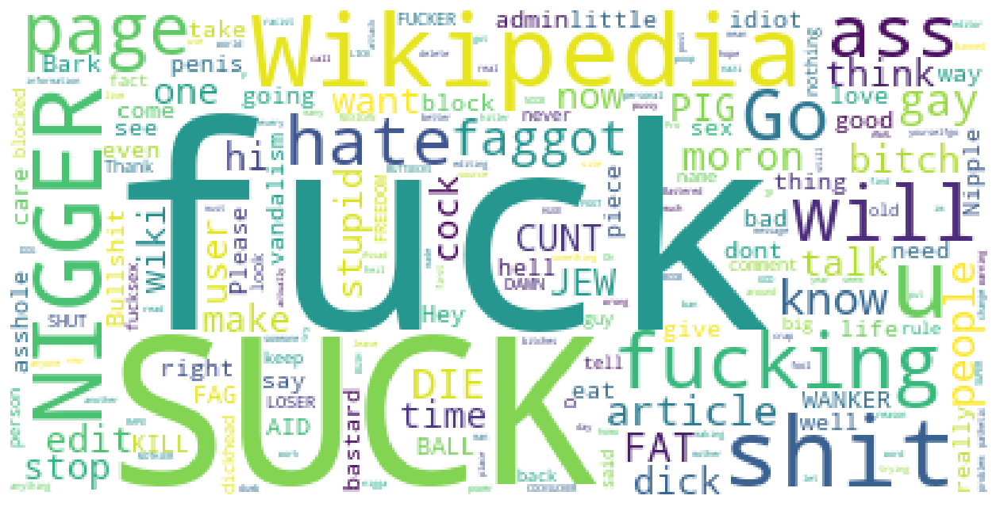

In [74]:
get_wordcloud(df[df['toxic']==1])

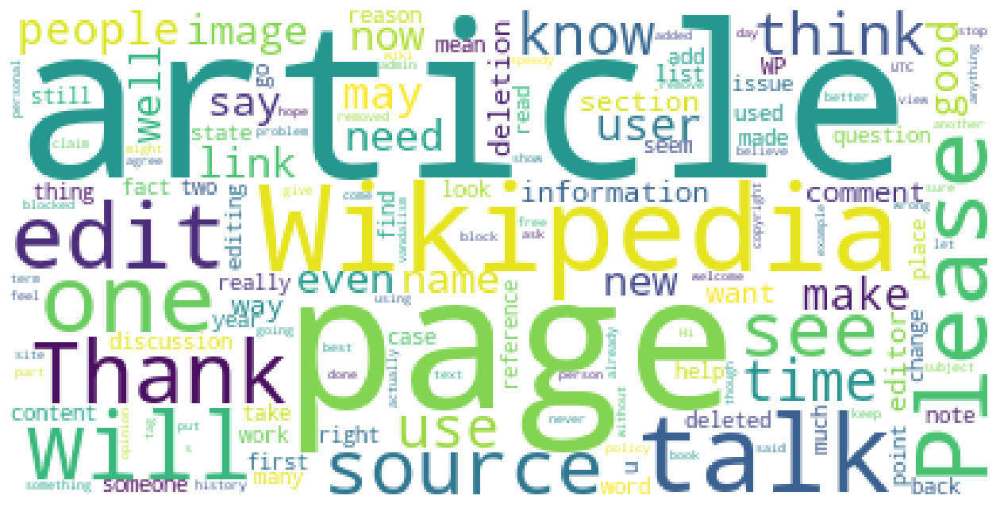

In [75]:
get_wordcloud(df[df['toxic']==0])

Само собой токсичные комментарии чаще всего содержат нецензурную лексику и прочие оскорбительные слова.

### Проверка на дизбаланс

In [76]:
df['toxic'].value_counts(normalize=True)

0    0.898388
1    0.101612
Name: toxic, dtype: float64

В целевой переменной присутствует дизбаланс классов, но не критичный

### Токсичнее ли более длинные тексты?

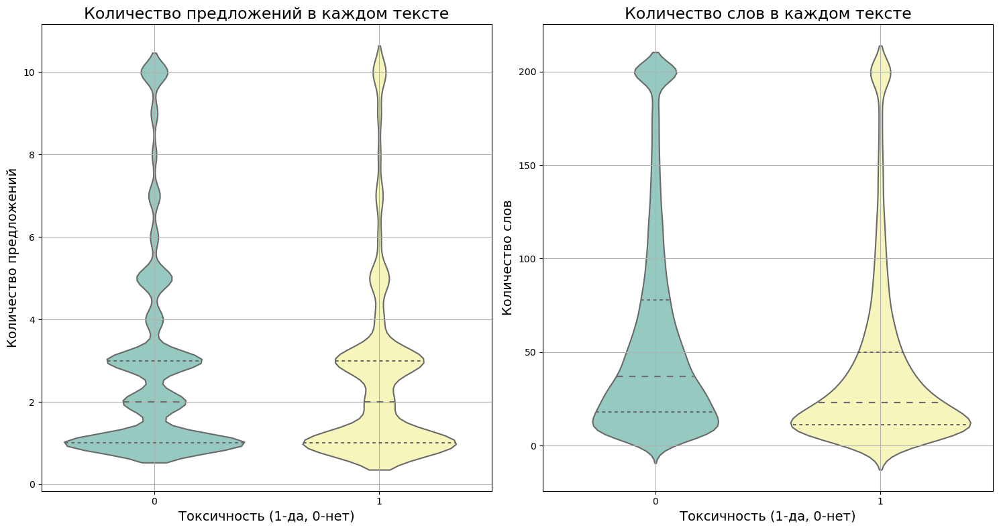

In [77]:
# Ограничиваем количество предложений и слов
df['count_sent'].clip(upper=10, inplace=True)
df['count_word'].clip(upper=200, inplace=True)

plt.figure(figsize=(15,8))

plt.subplot(121)
sns.violinplot(x='toxic', 
               y='count_sent', 
               data=df, split=True, 
               inner="quartile", 
               palette="Set3"
              )
plt.xlabel('Токсичность (1-да, 0-нет)', 
           fontsize=14)
plt.ylabel('Количество предложений', 
           fontsize=14)
plt.title('Количество предложений в каждом тексте', 
          fontsize=17)
plt.grid(True)

# График для слов
plt.subplot(122)
sns.violinplot(x='toxic', 
               y='count_word', 
               data=df, 
               split=True, 
               inner="quartile", 
               palette="Set3")
plt.xlabel('Токсичность (1-да, 0-нет)', 
           fontsize=14)
plt.ylabel('Количество слов', 
           fontsize=14)
plt.title('Количество слов в каждом тексте', 
          fontsize=17)
plt.grid(True)

plt.tight_layout()
plt.show()


### Влияет ли доля уникальных слов в тексте?

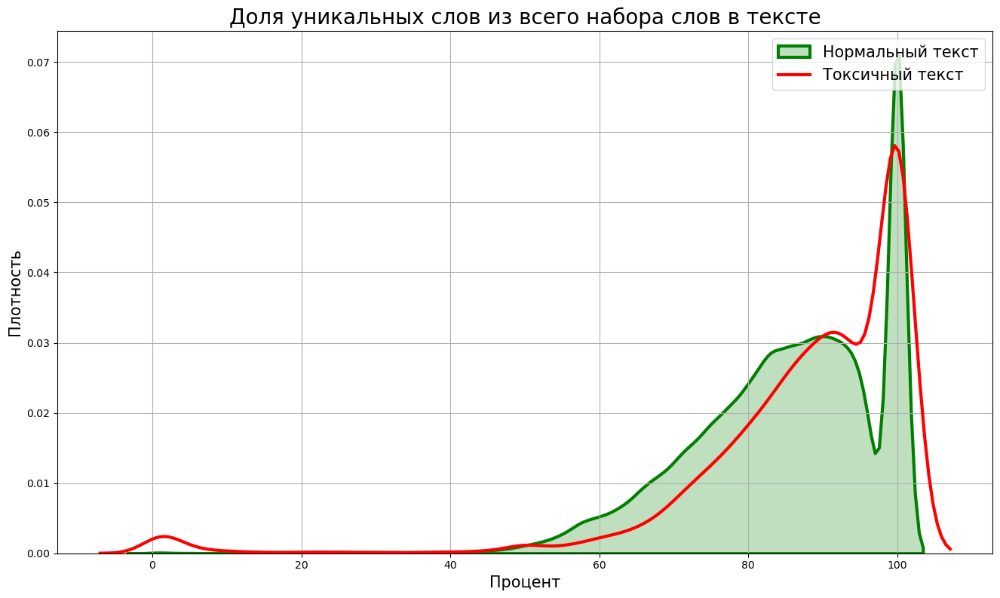

In [78]:
plt.figure(figsize=(16, 9))
plt.title(
    "Доля уникальных слов из всего набора слов в тексте", 
    fontsize=20
)
ax=sns.kdeplot(
    df[df['toxic'] == 0]['word_unique_percent'], 
    label='Нормальный текст', 
    shade=True, 
    color='g', 
    linewidth=3
)
ax=sns.kdeplot(
    df[df['toxic'] == 1]['word_unique_percent'], 
    label='Токсичный текст', 
    color='r', 
    linewidth=3
)
plt.legend(prop={'size': 15})
plt.ylabel('Плотность', 
           fontsize=15)
plt.xlabel('Процент', 
           fontsize=15)
plt.grid(True)
plt.show()


Из этих графиков можно заметить, что длина текста не играет решающую роль в определении токсичности комментариев. Скорее всего, это связано с тем, что злобные комментарии часто не ограничиваются лишь несколькими словами, а состоят из полноценных предложений с добавлением токсичных выражений.

### TF-IDF разлиных N-грамм

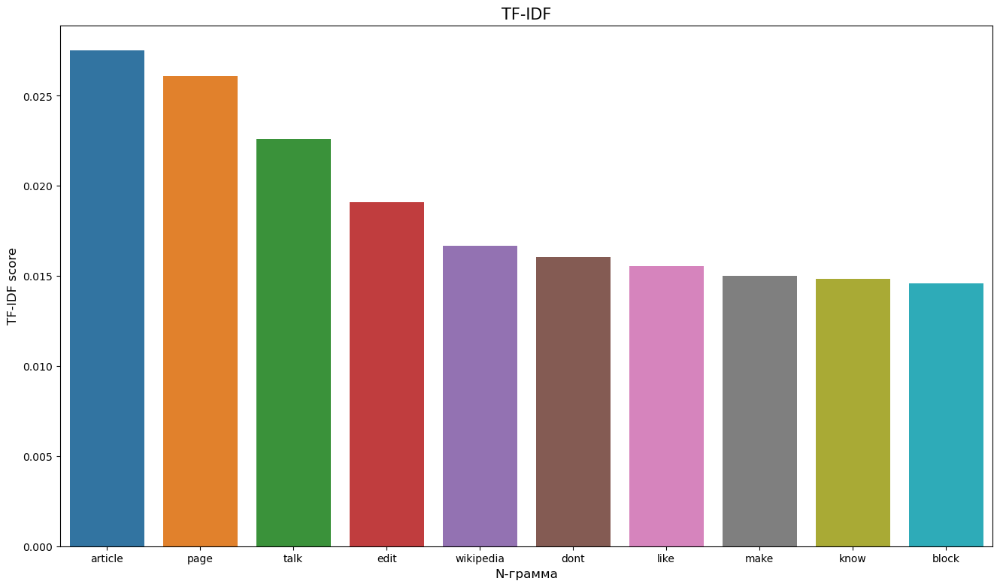

In [79]:
show_tfidf_viz(train_unigrams, features_uni)

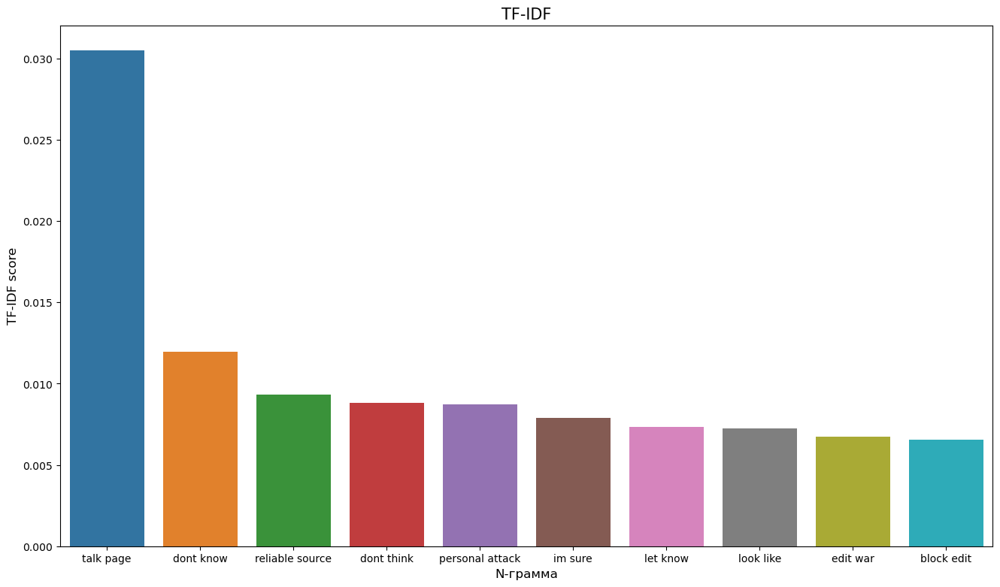

In [80]:
show_tfidf_viz(train_bigrams, features_bi)

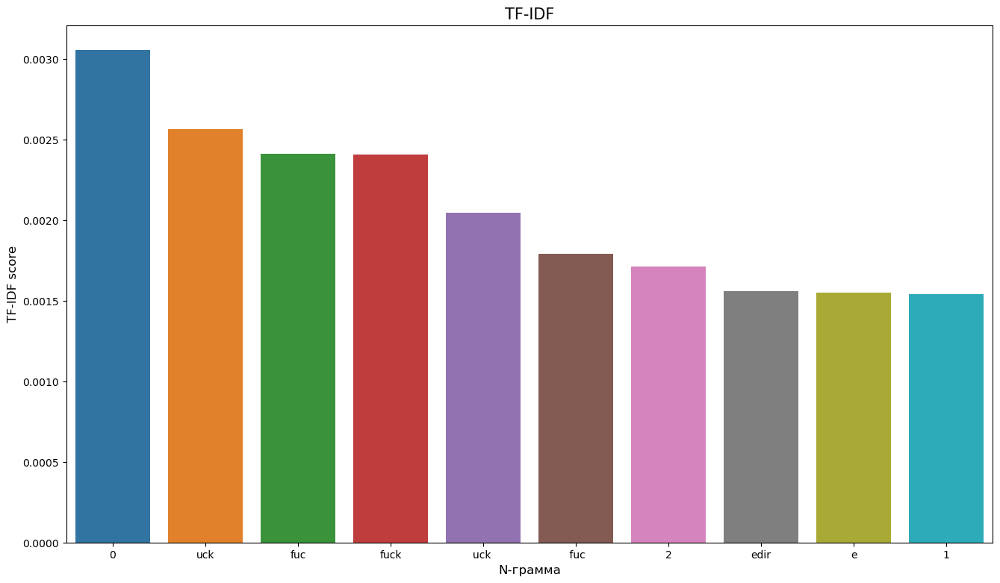

In [81]:
show_tfidf_viz(train_charngrams, features_n)

## Построение базовых моделей

In [82]:
SELECTED_COLS=['count_sent', 
               'count_word', 
               'count_unique_word',
               'count_letters', 
               'count_punctuations', 
               'count_words_upper',
               'count_words_title', 
               'count_stopwords', 
               'mean_word_len',
               'word_unique_percent', 
               'punct_percent'
              ]

In [83]:
start_time = time.time()

SELECTED_COLS=['count_sent', 
               'count_word', 
               'count_unique_word',
               'count_letters', 
               'count_punctuations', 
               'count_words_upper',
               'count_words_title', 
               'count_stopwords', 
               'mean_word_len',
               'word_unique_percent', 
               'punct_percent'
              ]
train_x = hstack(
    (train_bigrams,train_charngrams,
     train_unigrams, 
     X_train[SELECTED_COLS])
).tocsr()

valid_x = hstack(
    (valid_bigrams,
     valid_charngrams,
     valid_unigrams, 
     X_valid[SELECTED_COLS])
).tocsr()

test_x = hstack(
    (test_bigrams,
     test_charngrams,
     test_unigrams, 
     X_test[SELECTED_COLS])
).tocsr()

end_time = time.time()
working_time = round(end_time - start_time, 3)

print(f'Working time: {working_time} sec')

Working time: 2.562 sec


Построим несколько базовых моделей для выбора лучшей, которую затем постараемся улучшить с помощью гиперпараметров

### Логистическая регрессия

In [34]:
train_x_tfidf = hstack(
    (train_bigrams, train_charngrams, train_unigrams)
).tocsr()

valid_x_tfidf = hstack(
    (valid_bigrams, valid_charngrams, valid_unigrams)
).tocsr()

test_x_tfidf = hstack(
    (test_bigrams, test_charngrams, test_unigrams)
).tocsr()


In [35]:
start_time = time.time()

model_lr = LogisticRegression(solver='saga', random_state = RANDOM_STATE)
add_experiment(model_lr, train_x_tfidf, valid_x_tfidf, y_train, y_valid, 'LR')

end_time = time.time()
working_time = round(end_time - start_time, 3)

print(f'Working time: {working_time} sec')

F1 on train 78.9762% - F1 on valid 74.8911%
Training time: 34.549 sec - Predict on validation time: 0.014 sec
Working time: 34.638 sec


### Cat Boost

In [39]:
start_time = time.time()

cb = CatBoostClassifier(eval_metric='F1', 
                        thread_count=10, 
                        early_stopping_rounds=50,
                        random_state=RANDOM_STATE
                       )
add_experiment(cb, train_x, valid_x, y_train, y_valid, 'CB')

end_time = time.time()
working_time = round(end_time - start_time, 3)

print(f'Working time: {working_time} sec')


Learning rate set to 0.077113
0:	learn: 0.5033656	total: 1.61s	remaining: 26m 53s
1:	learn: 0.5189695	total: 2.38s	remaining: 19m 48s
2:	learn: 0.5160792	total: 3.1s	remaining: 17m 9s
3:	learn: 0.5046510	total: 3.81s	remaining: 15m 49s
4:	learn: 0.5147658	total: 4.56s	remaining: 15m 8s
5:	learn: 0.5203661	total: 5.47s	remaining: 15m 6s
6:	learn: 0.5156826	total: 6.21s	remaining: 14m 40s
7:	learn: 0.5126775	total: 6.93s	remaining: 14m 19s
8:	learn: 0.5296038	total: 7.66s	remaining: 14m 3s
9:	learn: 0.5343550	total: 8.43s	remaining: 13m 54s
10:	learn: 0.5412243	total: 9.19s	remaining: 13m 46s
11:	learn: 0.5494949	total: 10.1s	remaining: 13m 54s
12:	learn: 0.5533308	total: 11s	remaining: 13m 57s
13:	learn: 0.5558141	total: 11.7s	remaining: 13m 47s
14:	learn: 0.5541546	total: 12.4s	remaining: 13m 37s
15:	learn: 0.5534036	total: 13.1s	remaining: 13m 28s
16:	learn: 0.5503543	total: 14s	remaining: 13m 31s
17:	learn: 0.5519374	total: 14.9s	remaining: 13m 30s
18:	learn: 0.5514715	total: 15.6s	r

154:	learn: 0.7242709	total: 1m 57s	remaining: 10m 40s
155:	learn: 0.7249240	total: 1m 58s	remaining: 10m 39s
156:	learn: 0.7248453	total: 1m 58s	remaining: 10m 38s
157:	learn: 0.7248657	total: 1m 59s	remaining: 10m 37s
158:	learn: 0.7260705	total: 2m	remaining: 10m 36s
159:	learn: 0.7265439	total: 2m 1s	remaining: 10m 35s
160:	learn: 0.7277155	total: 2m 1s	remaining: 10m 34s
161:	learn: 0.7280597	total: 2m 2s	remaining: 10m 34s
162:	learn: 0.7287375	total: 2m 3s	remaining: 10m 32s
163:	learn: 0.7291104	total: 2m 4s	remaining: 10m 32s
164:	learn: 0.7290608	total: 2m 4s	remaining: 10m 31s
165:	learn: 0.7296684	total: 2m 5s	remaining: 10m 29s
166:	learn: 0.7295794	total: 2m 6s	remaining: 10m 28s
167:	learn: 0.7300216	total: 2m 6s	remaining: 10m 27s
168:	learn: 0.7304038	total: 2m 7s	remaining: 10m 26s
169:	learn: 0.7309601	total: 2m 8s	remaining: 10m 25s
170:	learn: 0.7315259	total: 2m 8s	remaining: 10m 24s
171:	learn: 0.7323458	total: 2m 9s	remaining: 10m 24s
172:	learn: 0.7321409	total

306:	learn: 0.7671461	total: 3m 51s	remaining: 8m 42s
307:	learn: 0.7671062	total: 3m 52s	remaining: 8m 41s
308:	learn: 0.7673389	total: 3m 53s	remaining: 8m 41s
309:	learn: 0.7672504	total: 3m 53s	remaining: 8m 40s
310:	learn: 0.7670419	total: 3m 54s	remaining: 8m 39s
311:	learn: 0.7671304	total: 3m 55s	remaining: 8m 39s
312:	learn: 0.7676841	total: 3m 56s	remaining: 8m 38s
313:	learn: 0.7681733	total: 3m 56s	remaining: 8m 37s
314:	learn: 0.7680292	total: 3m 57s	remaining: 8m 36s
315:	learn: 0.7682374	total: 3m 58s	remaining: 8m 36s
316:	learn: 0.7682216	total: 3m 59s	remaining: 8m 35s
317:	learn: 0.7685421	total: 3m 59s	remaining: 8m 34s
318:	learn: 0.7686062	total: 4m	remaining: 8m 33s
319:	learn: 0.7687585	total: 4m 1s	remaining: 8m 33s
320:	learn: 0.7689906	total: 4m 2s	remaining: 8m 32s
321:	learn: 0.7689106	total: 4m 3s	remaining: 8m 31s
322:	learn: 0.7691187	total: 4m 3s	remaining: 8m 30s
323:	learn: 0.7693508	total: 4m 4s	remaining: 8m 30s
324:	learn: 0.7694788	total: 4m 5s	re

459:	learn: 0.7896245	total: 5m 45s	remaining: 6m 45s
460:	learn: 0.7897483	total: 5m 46s	remaining: 6m 44s
461:	learn: 0.7897483	total: 5m 46s	remaining: 6m 44s
462:	learn: 0.7896245	total: 5m 47s	remaining: 6m 43s
463:	learn: 0.7898102	total: 5m 48s	remaining: 6m 42s
464:	learn: 0.7900767	total: 5m 49s	remaining: 6m 41s
465:	learn: 0.7900767	total: 5m 49s	remaining: 6m 40s
466:	learn: 0.7905716	total: 5m 50s	remaining: 6m 40s
467:	learn: 0.7904075	total: 5m 51s	remaining: 6m 39s
468:	learn: 0.7907167	total: 5m 51s	remaining: 6m 38s
469:	learn: 0.7907595	total: 5m 52s	remaining: 6m 37s
470:	learn: 0.7911088	total: 5m 53s	remaining: 6m 37s
471:	learn: 0.7916220	total: 5m 54s	remaining: 6m 36s
472:	learn: 0.7916220	total: 5m 54s	remaining: 6m 35s
473:	learn: 0.7913750	total: 5m 55s	remaining: 6m 34s
474:	learn: 0.7914154	total: 5m 56s	remaining: 6m 33s
475:	learn: 0.7914154	total: 5m 57s	remaining: 6m 33s
476:	learn: 0.7913750	total: 5m 57s	remaining: 6m 32s
477:	learn: 0.7916007	total:

613:	learn: 0.8070707	total: 7m 41s	remaining: 4m 50s
614:	learn: 0.8071504	total: 7m 42s	remaining: 4m 49s
615:	learn: 0.8072107	total: 7m 43s	remaining: 4m 48s
616:	learn: 0.8073311	total: 7m 43s	remaining: 4m 47s
617:	learn: 0.8072301	total: 7m 44s	remaining: 4m 47s
618:	learn: 0.8072496	total: 7m 45s	remaining: 4m 46s
619:	learn: 0.8073700	total: 7m 45s	remaining: 4m 45s
620:	learn: 0.8074904	total: 7m 46s	remaining: 4m 44s
621:	learn: 0.8076515	total: 7m 47s	remaining: 4m 44s
622:	learn: 0.8076515	total: 7m 48s	remaining: 4m 43s
623:	learn: 0.8079738	total: 7m 48s	remaining: 4m 42s
624:	learn: 0.8079544	total: 7m 49s	remaining: 4m 41s
625:	learn: 0.8079931	total: 7m 50s	remaining: 4m 41s
626:	learn: 0.8078922	total: 7m 51s	remaining: 4m 40s
627:	learn: 0.8080920	total: 7m 52s	remaining: 4m 39s
628:	learn: 0.8080727	total: 7m 52s	remaining: 4m 38s
629:	learn: 0.8085557	total: 7m 53s	remaining: 4m 38s
630:	learn: 0.8085772	total: 7m 54s	remaining: 4m 37s
631:	learn: 0.8089763	total:

766:	learn: 0.8190972	total: 9m 36s	remaining: 2m 55s
767:	learn: 0.8190972	total: 9m 37s	remaining: 2m 54s
768:	learn: 0.8193157	total: 9m 37s	remaining: 2m 53s
769:	learn: 0.8194340	total: 9m 38s	remaining: 2m 52s
770:	learn: 0.8196114	total: 9m 39s	remaining: 2m 52s
771:	learn: 0.8197936	total: 9m 39s	remaining: 2m 51s
772:	learn: 0.8198528	total: 9m 40s	remaining: 2m 50s
773:	learn: 0.8198347	total: 9m 41s	remaining: 2m 49s
774:	learn: 0.8197165	total: 9m 42s	remaining: 2m 49s
775:	learn: 0.8197756	total: 9m 42s	remaining: 2m 48s
776:	learn: 0.8198938	total: 9m 43s	remaining: 2m 47s
777:	learn: 0.8202714	total: 9m 44s	remaining: 2m 46s
778:	learn: 0.8202534	total: 9m 45s	remaining: 2m 46s
779:	learn: 0.8202534	total: 9m 46s	remaining: 2m 45s
780:	learn: 0.8204306	total: 9m 46s	remaining: 2m 44s
781:	learn: 0.8202765	total: 9m 47s	remaining: 2m 43s
782:	learn: 0.8202945	total: 9m 48s	remaining: 2m 43s
783:	learn: 0.8203176	total: 9m 49s	remaining: 2m 42s
784:	learn: 0.8204897	total:

917:	learn: 0.8283211	total: 11m 30s	remaining: 1m 1s
918:	learn: 0.8283211	total: 11m 31s	remaining: 1m
919:	learn: 0.8284960	total: 11m 32s	remaining: 1m
920:	learn: 0.8287876	total: 11m 32s	remaining: 59.4s
921:	learn: 0.8289042	total: 11m 33s	remaining: 58.7s
922:	learn: 0.8290037	total: 11m 34s	remaining: 57.9s
923:	learn: 0.8289454	total: 11m 34s	remaining: 57.2s
924:	learn: 0.8290037	total: 11m 35s	remaining: 56.4s
925:	learn: 0.8290620	total: 11m 36s	remaining: 55.6s
926:	learn: 0.8291372	total: 11m 37s	remaining: 54.9s
927:	learn: 0.8293532	total: 11m 37s	remaining: 54.1s
928:	learn: 0.8293532	total: 11m 38s	remaining: 53.4s
929:	learn: 0.8294527	total: 11m 39s	remaining: 52.6s
930:	learn: 0.8294358	total: 11m 40s	remaining: 51.9s
931:	learn: 0.8294940	total: 11m 40s	remaining: 51.1s
932:	learn: 0.8296856	total: 11m 41s	remaining: 50.4s
933:	learn: 0.8297438	total: 11m 42s	remaining: 49.6s
934:	learn: 0.8298264	total: 11m 43s	remaining: 48.9s
935:	learn: 0.8298264	total: 11m 4

### Дерево решений

In [40]:
%time
model_tree = DecisionTreeClassifier(random_state=RANDOM_STATE)
add_experiment(model_tree, train_x, valid_x, y_train, y_valid, 'TREE')

CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 3.81 µs
F1 on train 100.0% - F1 on valid 65.6082%
Training time: 1792.429 sec - Predict on validation time: 0.07 sec


### Метод опорных векторов

In [37]:
%time
model_svc = LinearSVC(random_state=RANDOM_STATE)
add_experiment(model_svc, train_x, valid_x, y_train, y_valid, 'LSVC')

CPU times: user 4 µs, sys: 2 µs, total: 6 µs
Wall time: 9.78 µs
F1 on train 29.3456% - F1 on valid 28.2396%
Training time: 116.472 sec - Predict on validation time: 0.012 sec


In [41]:
experiments

,Train F1 score,Valid F1 score,"Training time, sec","Predict on validation time, sec"
Модель,,,,
LR,78.9762,74.8911,34.549,0.014
LSVC,29.3456,28.2396,116.472,0.012
CB,83.3837,75.4352,753.150,0.101
TREE,100.0000,65.6082,1792.429,0.070


Исходя из представленных данных, модель CatBoost (CB) показывает наилучшее качество предсказания на валидационной выборке с F1-мерой 75.4352, что значительно выше, чем у любой другой модели. Однако стоит учесть, что CB также занимает больше времени на обучение и предсказание по сравнению с другими моделями.

Также можно сказать, что модель "TREE" показала 100% точность на обучающем наборе данных, но только около 65.6% точности на валидационном наборе данных. Это явное свидетельство переобучения.

Наш вывод говорит о том, что лучшей моделью является LR. Однако, исходя из представленных данных, LR имеет F1-меру на валидационной выборке 74.89, что ниже, чем у CatBoost. Если приоритетом является качество предсказания, тогда лучшей моделью будет CatBoost.

Если важно учитывать и время обучения, и время предсказания, тогда LR может быть лучшим выбором из-за быстрого времени обучения и предсказания, даже несмотря на то, что качество его предсказаний ниже, чем у CatBoost.

Также стоит учесть, что результаты могут быть улучшены с помощью тюнинга гиперпараметров для каждой из моделей. Стоит провести тюнинг гиперпараметров для обеих моделей (CatBoost и LR), чтобы увидеть, какое максимальное качество может быть достигнуто.

## Тюнинг модели и проверка модели

### Логистическая регрессия

In [42]:
param_dist = {
    'C': np.logspace(-4, 4, 20),
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga']
}

search = RandomizedSearchCV(model_lr, 
                            param_distributions=param_dist, 
                            scoring='f1', 
                            n_iter=10,  
                            cv=5,       
                            verbose=1,  
                            random_state=RANDOM_STATE,
                            n_jobs=-1)

search.fit(train_x_tfidf, y_train)

print('Best parameters: ', search.best_params_)

print('Best score: ', search.best_score_)



Fitting 5 folds for each of 10 candidates, totalling 50 fits


/Users/aleksandrkuzmic/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/aleksandrkuzmic/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/aleksandrkuzmic/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/aleksandrkuzmic/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/aleksandrkuzmic/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Best parameters:  {'solver': 'saga', 'penalty': 'l1', 'C': 4.281332398719396}
Best score:  0.7728912432157282


NameError: name 'best_params' is not defined

<div style="background-color: #e8ccff; padding: 10px; border-radius: 5px;"> 
Очень долго обучал и не так указал best_params, оставшуюся часть кода выполнил ниже, так как модель обучена
</div>

In [45]:
best_params = search.best_params_
best_model = LogisticRegression(**best_params, random_state=RANDOM_STATE)
best_model.fit(vstack([train_x_tfidf, valid_x_tfidf]), np.concatenate([y_train, y_valid]))

predictions = best_model.predict(test_x_tfidf)


test_score = f1_score(y_test, predictions)

print(f'Final F1 Score on the test set: {test_score}')


Final F1 Score on the test set: 0.7834593152512227


### CatBoostClassifier

Еле дождался, часа 3 обучалось на m1 max

In [85]:
features_transformer = ColumnTransformer(
    transformers=[
        ("text_preprocess", 
         TfidfVectorizer(min_df=200,  
                         max_features=10000, 
                         strip_accents='unicode', 
                         analyzer='word',
                         ngram_range=(1,1),
                         use_idf=1,
                         smooth_idf=1,
                         sublinear_tf=1,
                         stop_words = 'english'
                        ), 
         "text_preproc_plus"), 
        ("new_features_preprocess", StandardScaler(), SELECTED_COLS)])

pipeline = Pipeline([
    ('features_all_preprocess', features_transformer),
    ('model', CatBoostClassifier(
        eval_metric='F1',
        thread_count=10,
        early_stopping_rounds=50)
     )
])

param_distributions = {
    'model__learning_rate': np.linspace(0.01, 0.3, num=30),
    'model__depth': range(1, 9),
    'model__l2_leaf_reg': np.linspace(1, 10, num=10),
    'model__border_count': range(1, 256, 5),
}

randomized_search = RandomizedSearchCV(
    pipeline,
    param_distributions=param_distributions,
    scoring='f1_weighted',
    n_iter=50,  
    cv=3,  
    n_jobs=-1,  
    verbose=0,
)

randomized_search.fit(X_train, y_train)

best_model = randomized_search.best_estimator_

y_pred_test = best_model.predict(X_test)

f1_test = f1_score(y_test, y_pred_test)

print(f'F1 on test: {f1_test}')


0:	learn: 0.3987513	total: 174ms	remaining: 2m 54s
1:	learn: 0.3695909	total: 383ms	remaining: 3m 10s
2:	learn: 0.3737817	total: 533ms	remaining: 2m 57s
3:	learn: 0.4167535	total: 648ms	remaining: 2m 41s
4:	learn: 0.4652610	total: 773ms	remaining: 2m 33s
5:	learn: 0.4595195	total: 937ms	remaining: 2m 35s
6:	learn: 0.4219707	total: 1.08s	remaining: 2m 32s
7:	learn: 0.4118571	total: 1.25s	remaining: 2m 35s
8:	learn: 0.4164927	total: 1.45s	remaining: 2m 39s
9:	learn: 0.4176489	total: 1.62s	remaining: 2m 40s
10:	learn: 0.4236883	total: 1.79s	remaining: 2m 41s
11:	learn: 0.4300942	total: 1.94s	remaining: 2m 40s
12:	learn: 0.4337151	total: 2.06s	remaining: 2m 36s
13:	learn: 0.4492339	total: 2.25s	remaining: 2m 38s
14:	learn: 0.4322761	total: 2.47s	remaining: 2m 42s
15:	learn: 0.4210198	total: 2.6s	remaining: 2m 39s
16:	learn: 0.4183088	total: 2.73s	remaining: 2m 37s
17:	learn: 0.4365660	total: 2.92s	remaining: 2m 39s
18:	learn: 0.4331473	total: 3.08s	remaining: 2m 38s
19:	learn: 0.4222245	to

0:	learn: 0.3559120	total: 284ms	remaining: 4m 43s
1:	learn: 0.3559120	total: 408ms	remaining: 3m 23s
2:	learn: 0.3559120	total: 647ms	remaining: 3m 35s
3:	learn: 0.3530819	total: 804ms	remaining: 3m 20s
4:	learn: 0.3575455	total: 1.01s	remaining: 3m 21s
5:	learn: 0.3587910	total: 1.29s	remaining: 3m 33s
6:	learn: 0.3623016	total: 1.37s	remaining: 3m 14s
7:	learn: 0.4099990	total: 1.71s	remaining: 3m 32s
8:	learn: 0.4134405	total: 1.83s	remaining: 3m 21s
9:	learn: 0.4155898	total: 1.95s	remaining: 3m 13s
10:	learn: 0.4183918	total: 2.23s	remaining: 3m 20s
11:	learn: 0.3734991	total: 2.49s	remaining: 3m 25s
12:	learn: 0.3772455	total: 2.81s	remaining: 3m 33s
13:	learn: 0.3850005	total: 3.1s	remaining: 3m 38s
14:	learn: 0.3862040	total: 3.35s	remaining: 3m 39s
15:	learn: 0.3930048	total: 3.66s	remaining: 3m 45s
16:	learn: 0.4161620	total: 3.98s	remaining: 3m 50s
17:	learn: 0.4192977	total: 4.26s	remaining: 3m 52s
18:	learn: 0.4234047	total: 4.62s	remaining: 3m 58s
19:	learn: 0.4119803	to

0:	learn: 0.3837953	total: 173ms	remaining: 2m 52s
1:	learn: 0.4377691	total: 365ms	remaining: 3m 1s
2:	learn: 0.3572436	total: 510ms	remaining: 2m 49s
3:	learn: 0.3753747	total: 666ms	remaining: 2m 45s
4:	learn: 0.3785982	total: 767ms	remaining: 2m 32s
5:	learn: 0.3812673	total: 912ms	remaining: 2m 31s
6:	learn: 0.3821303	total: 1.06s	remaining: 2m 31s
7:	learn: 0.3826476	total: 1.18s	remaining: 2m 26s
8:	learn: 0.3862597	total: 1.36s	remaining: 2m 30s
9:	learn: 0.3881453	total: 1.5s	remaining: 2m 29s
10:	learn: 0.4042061	total: 1.63s	remaining: 2m 26s
11:	learn: 0.4375450	total: 1.79s	remaining: 2m 27s
12:	learn: 0.4385082	total: 2.01s	remaining: 2m 32s
13:	learn: 0.4393503	total: 2.14s	remaining: 2m 30s
14:	learn: 0.4283644	total: 2.31s	remaining: 2m 31s
15:	learn: 0.4390144	total: 2.48s	remaining: 2m 32s
16:	learn: 0.4445356	total: 2.74s	remaining: 2m 38s
17:	learn: 0.4400329	total: 2.9s	remaining: 2m 37s
18:	learn: 0.4376674	total: 3.04s	remaining: 2m 37s
19:	learn: 0.4458338	tota

0:	learn: 0.4505761	total: 218ms	remaining: 3m 37s
1:	learn: 0.3661608	total: 394ms	remaining: 3m 16s
2:	learn: 0.3986080	total: 561ms	remaining: 3m 6s
3:	learn: 0.4618174	total: 795ms	remaining: 3m 17s
4:	learn: 0.3719434	total: 976ms	remaining: 3m 14s
5:	learn: 0.4192811	total: 1.21s	remaining: 3m 21s
6:	learn: 0.3752140	total: 1.33s	remaining: 3m 8s
7:	learn: 0.3779915	total: 1.59s	remaining: 3m 17s
8:	learn: 0.4241044	total: 1.81s	remaining: 3m 19s
9:	learn: 0.4057941	total: 2.03s	remaining: 3m 21s
10:	learn: 0.4348452	total: 2.29s	remaining: 3m 25s
11:	learn: 0.4369800	total: 2.4s	remaining: 3m 18s
12:	learn: 0.4112971	total: 2.63s	remaining: 3m 20s
13:	learn: 0.4115493	total: 3.04s	remaining: 3m 34s
14:	learn: 0.4140380	total: 3.27s	remaining: 3m 34s
15:	learn: 0.4062139	total: 3.58s	remaining: 3m 39s
16:	learn: 0.4402542	total: 3.77s	remaining: 3m 37s
17:	learn: 0.4362851	total: 4.03s	remaining: 3m 39s
18:	learn: 0.4330790	total: 4.23s	remaining: 3m 38s
19:	learn: 0.4340478	tota

0:	learn: 0.3507243	total: 387ms	remaining: 6m 26s
1:	learn: 0.3703070	total: 510ms	remaining: 4m 14s
2:	learn: 0.3538361	total: 718ms	remaining: 3m 58s
3:	learn: 0.3584742	total: 921ms	remaining: 3m 49s
4:	learn: 0.3643821	total: 1.15s	remaining: 3m 48s
5:	learn: 0.3591854	total: 1.36s	remaining: 3m 45s
6:	learn: 0.3607835	total: 1.54s	remaining: 3m 38s
7:	learn: 0.3622609	total: 1.8s	remaining: 3m 43s
8:	learn: 0.3677294	total: 1.9s	remaining: 3m 29s
9:	learn: 0.3682567	total: 2.23s	remaining: 3m 40s
10:	learn: 0.3829742	total: 2.46s	remaining: 3m 41s
11:	learn: 0.3717632	total: 2.67s	remaining: 3m 39s
12:	learn: 0.3740343	total: 2.8s	remaining: 3m 32s
13:	learn: 0.3797712	total: 3.09s	remaining: 3m 37s
14:	learn: 0.3887294	total: 3.25s	remaining: 3m 33s
15:	learn: 0.3937692	total: 3.42s	remaining: 3m 30s
16:	learn: 0.3949598	total: 3.65s	remaining: 3m 31s
17:	learn: 0.4051751	total: 3.75s	remaining: 3m 24s
18:	learn: 0.4098584	total: 4.09s	remaining: 3m 31s
19:	learn: 0.4152994	tota

752:	learn: 0.6931134	total: 3m 47s	remaining: 1m 14s
753:	learn: 0.6931134	total: 3m 47s	remaining: 1m 14s
754:	learn: 0.6931134	total: 3m 48s	remaining: 1m 14s
755:	learn: 0.6929550	total: 3m 48s	remaining: 1m 13s
756:	learn: 0.6931199	total: 3m 48s	remaining: 1m 13s
757:	learn: 0.6930121	total: 3m 48s	remaining: 1m 13s
758:	learn: 0.6930056	total: 3m 49s	remaining: 1m 12s
759:	learn: 0.6930056	total: 3m 49s	remaining: 1m 12s
760:	learn: 0.6930056	total: 3m 49s	remaining: 1m 12s
761:	learn: 0.6930056	total: 3m 49s	remaining: 1m 11s
762:	learn: 0.6928471	total: 3m 50s	remaining: 1m 11s
763:	learn: 0.6928471	total: 3m 50s	remaining: 1m 11s
764:	learn: 0.6927964	total: 3m 50s	remaining: 1m 10s
765:	learn: 0.6926821	total: 3m 51s	remaining: 1m 10s
766:	learn: 0.6926821	total: 3m 51s	remaining: 1m 10s
767:	learn: 0.6926821	total: 3m 52s	remaining: 1m 10s
768:	learn: 0.6926821	total: 3m 52s	remaining: 1m 9s
769:	learn: 0.6926821	total: 3m 52s	remaining: 1m 9s
770:	learn: 0.6926821	total: 3

220:	learn: 0.7705614	total: 2m 9s	remaining: 7m 35s
221:	learn: 0.7710692	total: 2m 9s	remaining: 7m 35s
222:	learn: 0.7712983	total: 2m 10s	remaining: 7m 34s
223:	learn: 0.7717810	total: 2m 11s	remaining: 7m 33s
224:	learn: 0.7723239	total: 2m 11s	remaining: 7m 33s
225:	learn: 0.7723239	total: 2m 12s	remaining: 7m 33s
226:	learn: 0.7727451	total: 2m 13s	remaining: 7m 33s
227:	learn: 0.7728414	total: 2m 13s	remaining: 7m 32s
228:	learn: 0.7728414	total: 2m 14s	remaining: 7m 32s
229:	learn: 0.7733584	total: 2m 15s	remaining: 7m 32s
230:	learn: 0.7732266	total: 2m 16s	remaining: 7m 33s
231:	learn: 0.7737077	total: 2m 16s	remaining: 7m 32s
0:	learn: 0.4628943	total: 320ms	remaining: 5m 19s
1:	learn: 0.3585968	total: 536ms	remaining: 4m 27s
2:	learn: 0.4012222	total: 744ms	remaining: 4m 7s
3:	learn: 0.4515407	total: 938ms	remaining: 3m 53s
4:	learn: 0.4472582	total: 1.26s	remaining: 4m 10s
5:	learn: 0.4531599	total: 1.52s	remaining: 4m 11s
6:	learn: 0.4500153	total: 1.76s	remaining: 4m 10

160:	learn: 0.6586352	total: 59.6s	remaining: 5m 10s
161:	learn: 0.6596147	total: 59.9s	remaining: 5m 9s
162:	learn: 0.6595013	total: 1m	remaining: 5m 9s
163:	learn: 0.6595580	total: 1m	remaining: 5m 8s
164:	learn: 0.6600223	total: 1m	remaining: 5m 8s
165:	learn: 0.6605993	total: 1m 1s	remaining: 5m 7s
166:	learn: 0.6611769	total: 1m 1s	remaining: 5m 8s
167:	learn: 0.6609501	total: 1m 2s	remaining: 5m 8s
168:	learn: 0.6613525	total: 1m 2s	remaining: 5m 7s
169:	learn: 0.6614673	total: 1m 2s	remaining: 5m 6s
170:	learn: 0.6620985	total: 1m 3s	remaining: 5m 6s
171:	learn: 0.6629012	total: 1m 3s	remaining: 5m 5s
172:	learn: 0.6627857	total: 1m 3s	remaining: 5m 5s
173:	learn: 0.6636426	total: 1m 4s	remaining: 5m 4s
174:	learn: 0.6634714	total: 1m 4s	remaining: 5m 4s
175:	learn: 0.6637002	total: 1m 4s	remaining: 5m 4s
176:	learn: 0.6645007	total: 1m 5s	remaining: 5m 3s
177:	learn: 0.6641019	total: 1m 5s	remaining: 5m 2s
178:	learn: 0.6644444	total: 1m 5s	remaining: 5m 2s
179:	learn: 0.664730

200:	learn: 0.6932784	total: 1m 45s	remaining: 6m 58s
201:	learn: 0.6931706	total: 1m 45s	remaining: 6m 58s
202:	learn: 0.6934433	total: 1m 46s	remaining: 6m 58s
203:	learn: 0.6934433	total: 1m 46s	remaining: 6m 57s
204:	learn: 0.6935005	total: 1m 47s	remaining: 6m 57s
205:	learn: 0.6936082	total: 1m 48s	remaining: 6m 56s
206:	learn: 0.6936082	total: 1m 48s	remaining: 6m 55s
207:	learn: 0.6935510	total: 1m 49s	remaining: 6m 55s
208:	learn: 0.6937732	total: 1m 49s	remaining: 6m 54s
209:	learn: 0.6938809	total: 1m 50s	remaining: 6m 54s
210:	learn: 0.6941031	total: 1m 50s	remaining: 6m 53s
211:	learn: 0.6937732	total: 1m 51s	remaining: 6m 53s
212:	learn: 0.6938809	total: 1m 51s	remaining: 6m 52s
213:	learn: 0.6937665	total: 1m 52s	remaining: 6m 52s
214:	learn: 0.6941467	total: 1m 52s	remaining: 6m 51s
215:	learn: 0.6946276	total: 1m 53s	remaining: 6m 51s
216:	learn: 0.6944696	total: 1m 53s	remaining: 6m 50s
217:	learn: 0.6946848	total: 1m 54s	remaining: 6m 49s
218:	learn: 0.6945200	total:

415:	learn: 0.7033759	total: 2m 34s	remaining: 3m 36s
416:	learn: 0.7034245	total: 2m 34s	remaining: 3m 36s
417:	learn: 0.7036370	total: 2m 35s	remaining: 3m 36s
418:	learn: 0.7035308	total: 2m 35s	remaining: 3m 35s
419:	learn: 0.7036370	total: 2m 36s	remaining: 3m 35s
420:	learn: 0.7038008	total: 2m 36s	remaining: 3m 35s
421:	learn: 0.7039161	total: 2m 36s	remaining: 3m 34s
422:	learn: 0.7039161	total: 2m 37s	remaining: 3m 34s
423:	learn: 0.7043500	total: 2m 37s	remaining: 3m 34s
424:	learn: 0.7041192	total: 2m 37s	remaining: 3m 33s
425:	learn: 0.7044375	total: 2m 38s	remaining: 3m 33s
426:	learn: 0.7046013	total: 2m 38s	remaining: 3m 32s
427:	learn: 0.7048711	total: 2m 38s	remaining: 3m 32s
428:	learn: 0.7048617	total: 2m 39s	remaining: 3m 32s
429:	learn: 0.7048617	total: 2m 39s	remaining: 3m 31s
430:	learn: 0.7048617	total: 2m 40s	remaining: 3m 31s
431:	learn: 0.7051314	total: 2m 40s	remaining: 3m 31s
432:	learn: 0.7052373	total: 2m 40s	remaining: 3m 30s
433:	learn: 0.7051796	total:

591:	learn: 0.7238279	total: 4m 52s	remaining: 3m 21s
592:	learn: 0.7238279	total: 4m 52s	remaining: 3m 21s
593:	learn: 0.7238279	total: 4m 53s	remaining: 3m 20s
594:	learn: 0.7239303	total: 4m 53s	remaining: 3m 19s
595:	learn: 0.7237698	total: 4m 53s	remaining: 3m 19s
596:	learn: 0.7236673	total: 4m 54s	remaining: 3m 18s
597:	learn: 0.7240189	total: 4m 54s	remaining: 3m 17s
598:	learn: 0.7240770	total: 4m 54s	remaining: 3m 17s
599:	learn: 0.7240770	total: 4m 55s	remaining: 3m 16s
600:	learn: 0.7243261	total: 4m 55s	remaining: 3m 16s
601:	learn: 0.7243261	total: 4m 55s	remaining: 3m 15s
602:	learn: 0.7247935	total: 4m 56s	remaining: 3m 14s
603:	learn: 0.7246912	total: 4m 56s	remaining: 3m 14s
604:	learn: 0.7249399	total: 4m 56s	remaining: 3m 13s
605:	learn: 0.7249840	total: 4m 56s	remaining: 3m 13s
606:	learn: 0.7246191	total: 4m 57s	remaining: 3m 12s
607:	learn: 0.7246191	total: 4m 57s	remaining: 3m 11s
608:	learn: 0.7241656	total: 4m 57s	remaining: 3m 11s
609:	learn: 0.7241656	total:

834:	learn: 0.7406995	total: 6m 20s	remaining: 1m 15s
835:	learn: 0.7407996	total: 6m 21s	remaining: 1m 14s
836:	learn: 0.7407996	total: 6m 21s	remaining: 1m 14s
837:	learn: 0.7401399	total: 6m 21s	remaining: 1m 13s
838:	learn: 0.7401399	total: 6m 22s	remaining: 1m 13s
839:	learn: 0.7400811	total: 6m 22s	remaining: 1m 12s
840:	learn: 0.7401399	total: 6m 22s	remaining: 1m 12s
841:	learn: 0.7404993	total: 6m 23s	remaining: 1m 11s
842:	learn: 0.7404404	total: 6m 23s	remaining: 1m 11s
843:	learn: 0.7406406	total: 6m 23s	remaining: 1m 10s
844:	learn: 0.7407407	total: 6m 24s	remaining: 1m 10s
845:	learn: 0.7406819	total: 6m 24s	remaining: 1m 10s
846:	learn: 0.7409409	total: 6m 24s	remaining: 1m 9s
847:	learn: 0.7410821	total: 6m 25s	remaining: 1m 9s
848:	learn: 0.7410821	total: 6m 25s	remaining: 1m 8s
849:	learn: 0.7412410	total: 6m 25s	remaining: 1m 8s
850:	learn: 0.7411410	total: 6m 26s	remaining: 1m 7s
851:	learn: 0.7411410	total: 6m 26s	remaining: 1m 7s
852:	learn: 0.7412410	total: 6m 26

25:	learn: 0.5135056	total: 13.1s	remaining: 8m 8s
26:	learn: 0.5205692	total: 13.5s	remaining: 8m 7s
27:	learn: 0.5275932	total: 14.1s	remaining: 8m 8s
28:	learn: 0.5356185	total: 14.7s	remaining: 8m 11s
29:	learn: 0.5352490	total: 15.2s	remaining: 8m 11s
30:	learn: 0.5347522	total: 15.7s	remaining: 8m 11s
31:	learn: 0.5371735	total: 16s	remaining: 8m 4s
32:	learn: 0.5360529	total: 16.6s	remaining: 8m 6s
33:	learn: 0.5421434	total: 17.2s	remaining: 8m 7s
34:	learn: 0.5472003	total: 17.6s	remaining: 8m 5s
35:	learn: 0.5499668	total: 18s	remaining: 8m 2s
36:	learn: 0.5500189	total: 18.5s	remaining: 8m 1s
37:	learn: 0.5524924	total: 19.1s	remaining: 8m 2s
38:	learn: 0.5535849	total: 19.6s	remaining: 8m 2s
39:	learn: 0.5562877	total: 20.3s	remaining: 8m 6s
40:	learn: 0.5579690	total: 20.8s	remaining: 8m 5s
41:	learn: 0.5592711	total: 21.3s	remaining: 8m 6s
42:	learn: 0.5588871	total: 21.9s	remaining: 8m 7s
43:	learn: 0.5617029	total: 22.5s	remaining: 8m 8s
44:	learn: 0.5668909	total: 23s	

239:	learn: 0.6967551	total: 1m 22s	remaining: 4m 21s
240:	learn: 0.6972341	total: 1m 23s	remaining: 4m 21s
241:	learn: 0.6974562	total: 1m 23s	remaining: 4m 21s
242:	learn: 0.6972417	total: 1m 23s	remaining: 4m 20s
243:	learn: 0.6971918	total: 1m 23s	remaining: 4m 20s
244:	learn: 0.6971918	total: 1m 24s	remaining: 4m 19s
245:	learn: 0.6970845	total: 1m 24s	remaining: 4m 19s
246:	learn: 0.6971843	total: 1m 25s	remaining: 4m 19s
247:	learn: 0.6971843	total: 1m 25s	remaining: 4m 19s
248:	learn: 0.6973987	total: 1m 25s	remaining: 4m 18s
249:	learn: 0.6974486	total: 1m 26s	remaining: 4m 18s
250:	learn: 0.6979921	total: 1m 26s	remaining: 4m 17s
251:	learn: 0.6978772	total: 1m 26s	remaining: 4m 17s
252:	learn: 0.6979921	total: 1m 26s	remaining: 4m 16s
253:	learn: 0.6979921	total: 1m 27s	remaining: 4m 16s
254:	learn: 0.6983213	total: 1m 27s	remaining: 4m 15s
255:	learn: 0.6980495	total: 1m 27s	remaining: 4m 15s
256:	learn: 0.6982716	total: 1m 28s	remaining: 4m 14s
257:	learn: 0.6983787	total:

143:	learn: 0.6562581	total: 48s	remaining: 4m 45s
144:	learn: 0.6562581	total: 48.3s	remaining: 4m 44s
145:	learn: 0.6578222	total: 48.6s	remaining: 4m 44s
146:	learn: 0.6580556	total: 48.9s	remaining: 4m 43s
147:	learn: 0.6580556	total: 49.1s	remaining: 4m 42s
148:	learn: 0.6592102	total: 49.4s	remaining: 4m 42s
149:	learn: 0.6600757	total: 49.6s	remaining: 4m 41s
150:	learn: 0.6603060	total: 49.9s	remaining: 4m 40s
151:	learn: 0.6605930	total: 50.2s	remaining: 4m 39s
152:	learn: 0.6613416	total: 50.5s	remaining: 4m 39s
153:	learn: 0.6618594	total: 50.9s	remaining: 4m 39s
154:	learn: 0.6616296	total: 51.1s	remaining: 4m 38s
155:	learn: 0.6621471	total: 51.4s	remaining: 4m 37s
156:	learn: 0.6628924	total: 51.6s	remaining: 4m 36s
157:	learn: 0.6630071	total: 51.9s	remaining: 4m 36s
158:	learn: 0.6637525	total: 52.1s	remaining: 4m 35s
159:	learn: 0.6635802	total: 52.5s	remaining: 4m 35s
160:	learn: 0.6642686	total: 52.8s	remaining: 4m 35s
161:	learn: 0.6647260	total: 53.1s	remaining: 4m

486:	learn: 0.7190757	total: 2m 59s	remaining: 3m 9s
487:	learn: 0.7191792	total: 2m 59s	remaining: 3m 8s
488:	learn: 0.7192827	total: 3m	remaining: 3m 8s
489:	learn: 0.7193861	total: 3m	remaining: 3m 7s
490:	learn: 0.7195930	total: 3m 1s	remaining: 3m 7s
491:	learn: 0.7195930	total: 3m 1s	remaining: 3m 7s
492:	learn: 0.7199031	total: 3m 1s	remaining: 3m 7s
493:	learn: 0.7199612	total: 3m 2s	remaining: 3m 6s
494:	learn: 0.7199612	total: 3m 2s	remaining: 3m 6s
495:	learn: 0.7198450	total: 3m 3s	remaining: 3m 5s
496:	learn: 0.7198450	total: 3m 3s	remaining: 3m 5s
497:	learn: 0.7200065	total: 3m 3s	remaining: 3m 5s
498:	learn: 0.7200065	total: 3m 4s	remaining: 3m 4s
499:	learn: 0.7201679	total: 3m 4s	remaining: 3m 4s
500:	learn: 0.7201679	total: 3m 4s	remaining: 3m 4s
501:	learn: 0.7202261	total: 3m 5s	remaining: 3m 3s
502:	learn: 0.7202261	total: 3m 5s	remaining: 3m 3s
503:	learn: 0.7205942	total: 3m 5s	remaining: 3m 2s
504:	learn: 0.7206974	total: 3m 6s	remaining: 3m 2s
505:	learn: 0.72

937:	learn: 0.7460532	total: 5m 40s	remaining: 22.5s
938:	learn: 0.7460532	total: 5m 40s	remaining: 22.1s
939:	learn: 0.7460532	total: 5m 41s	remaining: 21.8s
940:	learn: 0.7460532	total: 5m 41s	remaining: 21.4s
941:	learn: 0.7465102	total: 5m 41s	remaining: 21s
942:	learn: 0.7465102	total: 5m 42s	remaining: 20.7s
943:	learn: 0.7466096	total: 5m 42s	remaining: 20.3s
944:	learn: 0.7466498	total: 5m 42s	remaining: 19.9s
945:	learn: 0.7466498	total: 5m 43s	remaining: 19.6s
946:	learn: 0.7467491	total: 5m 43s	remaining: 19.2s
947:	learn: 0.7468294	total: 5m 43s	remaining: 18.9s
948:	learn: 0.7469287	total: 5m 44s	remaining: 18.5s
949:	learn: 0.7471273	total: 5m 44s	remaining: 18.1s
950:	learn: 0.7471273	total: 5m 44s	remaining: 17.8s
951:	learn: 0.7471273	total: 5m 45s	remaining: 17.4s
952:	learn: 0.7474251	total: 5m 45s	remaining: 17s
953:	learn: 0.7473259	total: 5m 45s	remaining: 16.7s
954:	learn: 0.7473851	total: 5m 45s	remaining: 16.3s
955:	learn: 0.7474844	total: 5m 46s	remaining: 15.

26:	learn: 0.6569418	total: 13.1s	remaining: 7m 53s
27:	learn: 0.6604516	total: 13.5s	remaining: 7m 49s
28:	learn: 0.6620619	total: 13.8s	remaining: 7m 41s
29:	learn: 0.6626331	total: 14.2s	remaining: 7m 38s
30:	learn: 0.6643422	total: 14.7s	remaining: 7m 40s
31:	learn: 0.6642869	total: 15s	remaining: 7m 34s
32:	learn: 0.6655916	total: 15.4s	remaining: 7m 30s
33:	learn: 0.6665537	total: 15.8s	remaining: 7m 27s
34:	learn: 0.6697627	total: 16.1s	remaining: 7m 23s
35:	learn: 0.6724501	total: 16.5s	remaining: 7m 21s
36:	learn: 0.6743971	total: 16.9s	remaining: 7m 18s
37:	learn: 0.6762336	total: 17.2s	remaining: 7m 14s
38:	learn: 0.6772407	total: 17.6s	remaining: 7m 12s
39:	learn: 0.6779604	total: 17.9s	remaining: 7m 9s
40:	learn: 0.6787930	total: 18.3s	remaining: 7m 7s
41:	learn: 0.6798995	total: 18.6s	remaining: 7m 5s
42:	learn: 0.6801708	total: 19.1s	remaining: 7m 4s
43:	learn: 0.6810395	total: 19.4s	remaining: 7m 2s
44:	learn: 0.6817537	total: 19.8s	remaining: 7m
45:	learn: 0.6831749	to

232:	learn: 0.7737077	total: 2m 17s	remaining: 7m 32s
233:	learn: 0.7739962	total: 2m 17s	remaining: 7m 31s
234:	learn: 0.7743453	total: 2m 18s	remaining: 7m 30s
235:	learn: 0.7747649	total: 2m 19s	remaining: 7m 30s
236:	learn: 0.7749922	total: 2m 19s	remaining: 7m 29s
237:	learn: 0.7749315	total: 2m 20s	remaining: 7m 28s
238:	learn: 0.7753407	total: 2m 20s	remaining: 7m 28s
239:	learn: 0.7753407	total: 2m 21s	remaining: 7m 27s
240:	learn: 0.7752193	total: 2m 22s	remaining: 7m 27s
241:	learn: 0.7753759	total: 2m 22s	remaining: 7m 26s
242:	learn: 0.7759512	total: 2m 23s	remaining: 7m 26s
243:	learn: 0.7762386	total: 2m 23s	remaining: 7m 25s
244:	learn: 0.7773780	total: 2m 24s	remaining: 7m 25s
245:	learn: 0.7770910	total: 2m 25s	remaining: 7m 24s
246:	learn: 0.7770212	total: 2m 25s	remaining: 7m 23s
247:	learn: 0.7771867	total: 2m 26s	remaining: 7m 22s
248:	learn: 0.7776300	total: 2m 26s	remaining: 7m 22s
249:	learn: 0.7787763	total: 2m 27s	remaining: 7m 21s
250:	learn: 0.7788371	total:

234:	learn: 0.7389462	total: 2m 7s	remaining: 6m 56s
235:	learn: 0.7389044	total: 2m 8s	remaining: 6m 56s
236:	learn: 0.7389044	total: 2m 9s	remaining: 6m 55s
237:	learn: 0.7389462	total: 2m 9s	remaining: 6m 55s
238:	learn: 0.7389879	total: 2m 10s	remaining: 6m 54s
239:	learn: 0.7391304	total: 2m 10s	remaining: 6m 53s
240:	learn: 0.7392312	total: 2m 11s	remaining: 6m 52s
241:	learn: 0.7392312	total: 2m 11s	remaining: 6m 52s
242:	learn: 0.7395159	total: 2m 12s	remaining: 6m 52s
243:	learn: 0.7402380	total: 2m 12s	remaining: 6m 51s
244:	learn: 0.7402380	total: 2m 13s	remaining: 6m 50s
245:	learn: 0.7403800	total: 2m 13s	remaining: 6m 50s
246:	learn: 0.7405988	total: 2m 14s	remaining: 6m 49s
247:	learn: 0.7404391	total: 2m 14s	remaining: 6m 48s
248:	learn: 0.7408412	total: 2m 15s	remaining: 6m 48s
249:	learn: 0.7410600	total: 2m 16s	remaining: 6m 48s
250:	learn: 0.7409004	total: 2m 16s	remaining: 6m 47s
251:	learn: 0.7413201	total: 2m 17s	remaining: 6m 46s
252:	learn: 0.7416806	total: 2m 

230:	learn: 0.7738385	total: 2m 15s	remaining: 7m 31s
231:	learn: 0.7742493	total: 2m 16s	remaining: 7m 30s
232:	learn: 0.7745029	total: 2m 16s	remaining: 7m 30s
233:	learn: 0.7752376	total: 2m 17s	remaining: 7m 30s
234:	learn: 0.7755615	total: 2m 18s	remaining: 7m 29s
235:	learn: 0.7761288	total: 2m 18s	remaining: 7m 28s
236:	learn: 0.7766701	total: 2m 19s	remaining: 7m 27s
237:	learn: 0.7774029	total: 2m 19s	remaining: 7m 27s
238:	learn: 0.7771061	total: 2m 20s	remaining: 7m 26s
239:	learn: 0.7769490	total: 2m 20s	remaining: 7m 25s
240:	learn: 0.7769750	total: 2m 21s	remaining: 7m 24s
241:	learn: 0.7775073	total: 2m 21s	remaining: 7m 23s
242:	learn: 0.7776033	total: 2m 22s	remaining: 7m 23s
243:	learn: 0.7779523	total: 2m 22s	remaining: 7m 22s
244:	learn: 0.7785445	total: 2m 23s	remaining: 7m 22s
245:	learn: 0.7793184	total: 2m 24s	remaining: 7m 21s
246:	learn: 0.7796929	total: 2m 24s	remaining: 7m 21s
247:	learn: 0.7803274	total: 2m 25s	remaining: 7m 20s
248:	learn: 0.7805527	total:

232:	learn: 0.6777375	total: 1m 34s	remaining: 5m 9s
233:	learn: 0.6773976	total: 1m 34s	remaining: 5m 9s
234:	learn: 0.6774547	total: 1m 34s	remaining: 5m 8s
235:	learn: 0.6775662	total: 1m 35s	remaining: 5m 7s
236:	learn: 0.6777347	total: 1m 35s	remaining: 5m 7s
237:	learn: 0.6777347	total: 1m 35s	remaining: 5m 6s
238:	learn: 0.6778461	total: 1m 36s	remaining: 5m 6s
239:	learn: 0.6781803	total: 1m 36s	remaining: 5m 5s
240:	learn: 0.6783458	total: 1m 36s	remaining: 5m 5s
241:	learn: 0.6786736	total: 1m 37s	remaining: 5m 5s
242:	learn: 0.6789500	total: 1m 37s	remaining: 5m 4s
243:	learn: 0.6789500	total: 1m 38s	remaining: 5m 4s
244:	learn: 0.6793912	total: 1m 38s	remaining: 5m 4s
245:	learn: 0.6793912	total: 1m 39s	remaining: 5m 3s
246:	learn: 0.6798386	total: 1m 39s	remaining: 5m 3s
247:	learn: 0.6804540	total: 1m 39s	remaining: 5m 2s
248:	learn: 0.6805077	total: 1m 40s	remaining: 5m 2s
249:	learn: 0.6805077	total: 1m 40s	remaining: 5m 1s
250:	learn: 0.6807867	total: 1m 41s	remaining:

232:	learn: 0.6809009	total: 1m 41s	remaining: 5m 33s
233:	learn: 0.6807335	total: 1m 41s	remaining: 5m 32s
234:	learn: 0.6809009	total: 1m 41s	remaining: 5m 31s
235:	learn: 0.6806765	total: 1m 42s	remaining: 5m 31s
236:	learn: 0.6810114	total: 1m 42s	remaining: 5m 30s
237:	learn: 0.6812322	total: 1m 42s	remaining: 5m 29s
238:	learn: 0.6814493	total: 1m 43s	remaining: 5m 28s
239:	learn: 0.6814493	total: 1m 43s	remaining: 5m 27s
240:	learn: 0.6812819	total: 1m 44s	remaining: 5m 27s
241:	learn: 0.6818334	total: 1m 44s	remaining: 5m 26s
242:	learn: 0.6822211	total: 1m 44s	remaining: 5m 26s
243:	learn: 0.6822742	total: 1m 45s	remaining: 5m 25s
244:	learn: 0.6827759	total: 1m 45s	remaining: 5m 24s
245:	learn: 0.6826087	total: 1m 45s	remaining: 5m 24s
246:	learn: 0.6831021	total: 1m 46s	remaining: 5m 24s
247:	learn: 0.6834935	total: 1m 46s	remaining: 5m 23s
248:	learn: 0.6836522	total: 1m 46s	remaining: 5m 22s
249:	learn: 0.6837621	total: 1m 47s	remaining: 5m 22s
250:	learn: 0.6838149	total:

464:	learn: 0.6296984	total: 1m 45s	remaining: 2m 1s
465:	learn: 0.6299965	total: 1m 45s	remaining: 2m
466:	learn: 0.6301176	total: 1m 45s	remaining: 2m
467:	learn: 0.6308440	total: 1m 45s	remaining: 2m
468:	learn: 0.6304905	total: 1m 46s	remaining: 2m
469:	learn: 0.6304905	total: 1m 46s	remaining: 2m
470:	learn: 0.6310954	total: 1m 46s	remaining: 1m 59s
471:	learn: 0.6312163	total: 1m 46s	remaining: 1m 59s
472:	learn: 0.6310954	total: 1m 47s	remaining: 1m 59s
473:	learn: 0.6308535	total: 1m 47s	remaining: 1m 59s
474:	learn: 0.6309187	total: 1m 47s	remaining: 1m 59s
475:	learn: 0.6309839	total: 1m 47s	remaining: 1m 58s
476:	learn: 0.6312163	total: 1m 48s	remaining: 1m 58s
477:	learn: 0.6313372	total: 1m 48s	remaining: 1m 58s
478:	learn: 0.6312163	total: 1m 48s	remaining: 1m 58s
479:	learn: 0.6312163	total: 1m 49s	remaining: 1m 58s
480:	learn: 0.6312257	total: 1m 49s	remaining: 1m 57s
481:	learn: 0.6313466	total: 1m 49s	remaining: 1m 57s
482:	learn: 0.6316440	total: 1m 49s	remaining: 1m

701:	learn: 0.6534997	total: 2m 2s	remaining: 51.9s
702:	learn: 0.6534997	total: 2m 2s	remaining: 51.7s
703:	learn: 0.6532663	total: 2m 2s	remaining: 51.5s
704:	learn: 0.6532663	total: 2m 2s	remaining: 51.3s
705:	learn: 0.6532663	total: 2m 2s	remaining: 51.1s
706:	learn: 0.6532663	total: 2m 2s	remaining: 50.9s
707:	learn: 0.6531496	total: 2m 2s	remaining: 50.7s
708:	learn: 0.6532698	total: 2m 3s	remaining: 50.5s
709:	learn: 0.6528030	total: 2m 3s	remaining: 50.3s
710:	learn: 0.6532132	total: 2m 3s	remaining: 50.2s
711:	learn: 0.6533299	total: 2m 3s	remaining: 50s
712:	learn: 0.6533299	total: 2m 3s	remaining: 49.8s
713:	learn: 0.6533299	total: 2m 3s	remaining: 49.6s
714:	learn: 0.6533299	total: 2m 3s	remaining: 49.4s
715:	learn: 0.6536797	total: 2m 4s	remaining: 49.2s
716:	learn: 0.6537962	total: 2m 4s	remaining: 49s
717:	learn: 0.6537962	total: 2m 4s	remaining: 48.8s
718:	learn: 0.6537962	total: 2m 4s	remaining: 48.6s
719:	learn: 0.6539127	total: 2m 4s	remaining: 48.4s
720:	learn: 0.65

291:	learn: 0.6886173	total: 1m 31s	remaining: 3m 41s
292:	learn: 0.6886173	total: 1m 31s	remaining: 3m 41s
293:	learn: 0.6888353	total: 1m 32s	remaining: 3m 41s
294:	learn: 0.6885082	total: 1m 32s	remaining: 3m 41s
295:	learn: 0.6885082	total: 1m 32s	remaining: 3m 40s
296:	learn: 0.6893228	total: 1m 33s	remaining: 3m 40s
297:	learn: 0.6888760	total: 1m 33s	remaining: 3m 40s
298:	learn: 0.6891566	total: 1m 33s	remaining: 3m 39s
299:	learn: 0.6894833	total: 1m 34s	remaining: 3m 39s
300:	learn: 0.6895922	total: 1m 34s	remaining: 3m 39s
301:	learn: 0.6895922	total: 1m 34s	remaining: 3m 39s
302:	learn: 0.6899186	total: 1m 35s	remaining: 3m 38s
303:	learn: 0.6900274	total: 1m 35s	remaining: 3m 38s
304:	learn: 0.6900274	total: 1m 35s	remaining: 3m 38s
305:	learn: 0.6904683	total: 1m 36s	remaining: 3m 38s
306:	learn: 0.6904683	total: 1m 36s	remaining: 3m 37s
307:	learn: 0.6905770	total: 1m 36s	remaining: 3m 37s
308:	learn: 0.6904683	total: 1m 37s	remaining: 3m 36s
309:	learn: 0.6904683	total:

689:	learn: 0.8117755	total: 4m 16s	remaining: 1m 55s
690:	learn: 0.8119280	total: 4m 17s	remaining: 1m 54s
691:	learn: 0.8120805	total: 4m 17s	remaining: 1m 54s
692:	learn: 0.8123809	total: 4m 17s	remaining: 1m 54s
693:	learn: 0.8124714	total: 4m 18s	remaining: 1m 53s
694:	learn: 0.8126858	total: 4m 18s	remaining: 1m 53s
695:	learn: 0.8126858	total: 4m 18s	remaining: 1m 53s
696:	learn: 0.8126858	total: 4m 19s	remaining: 1m 52s
697:	learn: 0.8130478	total: 4m 19s	remaining: 1m 52s
698:	learn: 0.8133191	total: 4m 19s	remaining: 1m 51s
699:	learn: 0.8134095	total: 4m 20s	remaining: 1m 51s
700:	learn: 0.8135335	total: 4m 20s	remaining: 1m 51s
701:	learn: 0.8135335	total: 4m 20s	remaining: 1m 50s
702:	learn: 0.8135955	total: 4m 21s	remaining: 1m 50s
703:	learn: 0.8135955	total: 4m 21s	remaining: 1m 49s
704:	learn: 0.8137195	total: 4m 21s	remaining: 1m 49s
705:	learn: 0.8137195	total: 4m 22s	remaining: 1m 49s
706:	learn: 0.8139854	total: 4m 22s	remaining: 1m 48s
707:	learn: 0.8141943	total:

539:	learn: 0.7096407	total: 3m	remaining: 2m 33s
540:	learn: 0.7097456	total: 3m	remaining: 2m 33s
541:	learn: 0.7097456	total: 3m 1s	remaining: 2m 33s
542:	learn: 0.7100024	total: 3m 1s	remaining: 2m 32s
543:	learn: 0.7100024	total: 3m 1s	remaining: 2m 32s
544:	learn: 0.7098976	total: 3m 1s	remaining: 2m 31s
545:	learn: 0.7098976	total: 3m 2s	remaining: 2m 31s
546:	learn: 0.7099553	total: 3m 2s	remaining: 2m 31s
547:	learn: 0.7099553	total: 3m 2s	remaining: 2m 30s
548:	learn: 0.7099553	total: 3m 3s	remaining: 2m 30s
549:	learn: 0.7100601	tootal: 5m 9s	remaining: 5m 15s
495:	learn: 0.8154748	total: 5m 10s	remaining: 5m 15s
496:	learn: 0.8155029	total: 5m 10s	remaining: 5m 14s
497:	learn: 0.8156271	total: 5m 11s	remaining: 5m 13s
498:	learn: 0.8155650	total: 5m 12s	remaining: 5m 13s
499:	learn: 0.8156893	total: 5m 12s	remaining: 5m 12s
500:	learn: 0.8162644	total: 5m 13s	remaining: 5m 12s
501:	learn: 0.8165626	total: 5m 13s	remaining: 5m 11s
502:	learn: 0.8166806	total: 5m 14s	remainin

884:	learn: 0.8675072	total: 5m 35s	remaining: 43.5s
885:	learn: 0.8675072	total: 5m 35s	remaining: 43.2s
886:	learn: 0.8674237	total: 5m 35s	remaining: 42.8s
887:	learn: 0.8676742	total: 5m 36s	remaining: 42.4s
888:	learn: 0.8679245	total: 5m 36s	remaining: 42s
889:	learn: 0.8678411	total: 5m 37s	remaining: 41.7s
890:	learn: 0.8676742	total: 5m 37s	remaining: 41.3s
891:	learn: 0.8678411	total: 5m 37s	remaining: 40.9s
892:	learn: 0.8677771	total: 5m 38s	remaining: 40.5s
893:	learn: 0.8681302	total: 5m 38s	remaining: 40.1s
894:	learn: 0.8681302	total: 5m 39s	remaining: 39.8s
895:	learn: 0.8681302	total: 5m 39s	remaining: 39.4s
896:	learn: 0.8683164	total: 5m 39s	remaining: 39s
897:	learn: 0.8684191	total: 5m 40s	remaining: 38.6s
898:	learn: 0.8683358	total: 5m 40s	remaining: 38.3s
899:	learn: 0.8687330	total: 5m 41s	remaining: 37.9s
900:	learn: 0.8691492	total: 5m 41s	remaining: 37.5s
901:	learn: 0.8691492	total: 5m 41s	remaining: 37.1s
902:	learn: 0.8691492	total: 5m 42s	remaining: 36.

431:	learn: 0.7176643	total: 5m 23s	remaining: 7m 5s
432:	learn: 0.7177689	total: 5m 23s	remaining: 7m 4s
433:	learn: 0.7175597	total: 5m 24s	remaining: 7m 3s
434:	learn: 0.7180240	total: 5m 25s	remaining: 7m 2s
435:	learn: 0.7181870	total: 5m 25s	remaining: 7m 1s
436:	learn: 0.7182915	total: 5m 26s	remaining: 7m
437:	learn: 0.7182915	total: 5m 27s	remaining: 6m 59s
438:	learn: 0.7181870	total: 5m 27s	remaining: 6m 58s
439:	learn: 0.7182915	total: 5m 28s	remaining: 6m 57s
440:	learn: 0.7182915	total: 5m 29s	remaining: 6m 57s
441:	learn: 0.7182915	total: 5m 29s	remaining: 6m 56s
442:	learn: 0.7182329	total: 5m 30s	remaining: 6m 55s
443:	learn: 0.7184419	total: 5m 31s	remaining: 6m 54s
444:	learn: 0.7185004	total: 5m 31s	remaining: 6m 53s
445:	learn: 0.7185004	total: 5m 32s	remaining: 6m 52s
446:	learn: 0.7186634	total: 5m 32s	remaining: 6m 51s
447:	learn: 0.7188264	total: 5m 33s	remaining: 6m 51s
448:	learn: 0.7191396	total: 5m 34s	remaining: 6m 50s
449:	learn: 0.7190352	total: 5m 34s	r

457:	learn: 0.7796293	total: 3m 45s	remaining: 4m 27s
458:	learn: 0.7798194	total: 3m 46s	remaining: 4m 26s
459:	learn: 0.7798879	total: 3m 46s	remaining: 4m 26s
460:	learn: 0.7800778	total: 3m 47s	remaining: 4m 25s
461:	learn: 0.7799486	total: 3m 48s	remaining: 4m 25s
462:	learn: 0.7800093	total: 3m 48s	remaining: 4m 25s
463:	learn: 0.7801043	total: 3m 49s	remaining: 4m 24s
464:	learn: 0.7806663	total: 3m 49s	remaining: 4m 24s
465:	learn: 0.7808560	total: 3m 50s	remaining: 4m 23s
466:	learn: 0.7810458	total: 3m 50s	remaining: 4m 23s
467:	learn: 0.7812014	total: 3m 51s	remaining: 4m 22s
468:	learn: 0.7812014	total: 3m 51s	remaining: 4m 22s
469:	learn: 0.7816754	total: 3m 52s	remaining: 4m 22s
470:	learn: 0.7823045	total: 3m 52s	remaining: 4m 21s
471:	learn: 0.7826493	total: 3m 53s	remaining: 4m 20s
472:	learn: 0.7828993	total: 3m 53s	remaining: 4m 20s
473:	learn: 0.7829397	total: 3m 54s	remaining: 4m 20s
474:	learn: 0.7831288	total: 3m 55s	remaining: 4m 19s
475:	learn: 0.7831288	total:

935:	learn: 0.7314295	total: 4m 48s	remaining: 19.7s
936:	learn: 0.7314295	total: 4m 48s	remaining: 19.4s
937:	learn: 0.7314295	total: 4m 49s	remaining: 19.1s
938:	learn: 0.7315312	total: 4m 49s	remaining: 18.8s
939:	learn: 0.7316330	total: 4m 49s	remaining: 18.5s
940:	learn: 0.7314726	total: 4m 50s	remaining: 18.2s
941:	learn: 0.7314139	total: 4m 50s	remaining: 17.9s
942:	learn: 0.7315312	total: 4m 50s	remaining: 17.6s
943:	learn: 0.7315312	total: 4m 51s	remaining: 17.3s
944:	learn: 0.7317777	total: 4m 51s	remaining: 17s
945:	learn: 0.7318794	total: 4m 52s	remaining: 16.7s
946:	learn: 0.7318794	total: 4m 52s	remaining: 16.4s
947:	learn: 0.7319224	total: 4m 52s	remaining: 16.1s
948:	learn: 0.7320398	total: 4m 53s	remaining: 15.8s
949:	learn: 0.7321414	total: 4m 53s	remaining: 15.5s
950:	learn: 0.7320555	total: 4m 54s	remaining: 15.2s
951:	learn: 0.7319538	total: 4m 54s	remaining: 14.8s
952:	learn: 0.7321572	total: 4m 54s	remaining: 14.5s
953:	learn: 0.7321572	total: 4m 55s	remaining: 1

179:	learn: 0.7219433	total: 2m 42s	remaining: 12m 19s
180:	learn: 0.7220468	total: 2m 43s	remaining: 12m 17s
181:	learn: 0.7221503	total: 2m 43s	remaining: 12m 16s
182:	learn: 0.7221503	total: 2m 44s	remaining: 12m 15s
183:	learn: 0.7227843	total: 2m 45s	remaining: 12m 14s
184:	learn: 0.7228740	total: 2m 46s	remaining: 12m 13s
185:	learn: 0.7232425	total: 2m 47s	remaining: 12m 12s
186:	learn: 0.7230807	total: 2m 48s	remaining: 12m 12s
187:	learn: 0.7232872	total: 2m 49s	remaining: 12m 10s
188:	learn: 0.7232872	total: 2m 49s	remaining: 12m 9s
189:	learn: 0.7235970	total: 2m 50s	remaining: 12m 8s
190:	learn: 0.7242160	total: 2m 51s	remaining: 12m 7s
191:	learn: 0.7248485	total: 2m 52s	remaining: 12m 7s
192:	learn: 0.7246869	total: 2m 53s	remaining: 12m 5s
193:	learn: 0.7248929	total: 2m 54s	remaining: 12m 4s
194:	learn: 0.7250101	total: 2m 55s	remaining: 12m 3s
195:	learn: 0.7252019	total: 2m 56s	remaining: 12m 3s
196:	learn: 0.7255250	total: 2m 57s	remaining: 12m 2s
197:	learn: 0.72583

247:	learn: 0.6714612	total: 1m 10s	remaining: 3m 34s
248:	learn: 0.6712920	total: 1m 10s	remaining: 3m 33s
249:	learn: 0.6714600	total: 1m 11s	remaining: 3m 33s
250:	learn: 0.6717970	total: 1m 11s	remaining: 3m 33s
251:	learn: 0.6719080	total: 1m 11s	remaining: 3m 32s
252:	learn: 0.6716822	total: 1m 12s	remaining: 3m 32s
253:	learn: 0.6720189	total: 1m 12s	remaining: 3m 31s
254:	learn: 0.6721311	total: 1m 12s	remaining: 3m 31s
255:	learn: 0.6722433	total: 1m 12s	remaining: 3m 30s
256:	learn: 0.6722433	total: 1m 12s	remaining: 3m 30s
257:	learn: 0.6722448	total: 1m 13s	remaining: 3m 30s
258:	learn: 0.6723570	total: 1m 13s	remaining: 3m 29s
259:	learn: 0.6724123	total: 1m 13s	remaining: 3m 29s
260:	learn: 0.6724123	total: 1m 13s	remaining: 3m 29s
261:	learn: 0.6724123	total: 1m 14s	remaining: 3m 28s
262:	learn: 0.6723002	total: 1m 14s	remaining: 3m 28s
263:	learn: 0.6728609	total: 1m 14s	remaining: 3m 28s
264:	learn: 0.6735366	total: 1m 15s	remaining: 3m 28s
265:	learn: 0.6735366	total:

683:	learn: 0.7424749	total: 5m 4s	remaining: 2m 20s
684:	learn: 0.7424749	total: 5m 4s	remaining: 2m 20s
685:	learn: 0.7428753	total: 5m 5s	remaining: 2m 19s
686:	learn: 0.7429754	total: 5m 5s	remaining: 2m 19s
687:	learn: 0.7431755	total: 5m 6s	remaining: 2m 18s
688:	learn: 0.7430755	total: 5m 6s	remaining: 2m 18s
689:	learn: 0.7430755	total: 5m 6s	remaining: 2m 17s
690:	learn: 0.7430937	total: 5m 7s	remaining: 2m 17s
691:	learn: 0.7429345	total: 5m 7s	remaining: 2m 16s
692:	learn: 0.7429345	total: 5m 8s	remaining: 2m 16s
693:	learn: 0.7428344	total: 5m 8s	remaining: 2m 16s
694:	learn: 0.7429936	total: 5m 8s	remaining: 2m 15s
695:	learn: 0.7431938	total: 5m 9s	remaining: 2m 15s
696:	learn: 0.7433347	total: 5m 9s	remaining: 2m 14s
697:	learn: 0.7433938	total: 5m 10s	remaining: 2m 14s
698:	learn: 0.7434938	total: 5m 10s	remaining: 2m 13s
699:	learn: 0.7434938	total: 5m 10s	remaining: 2m 13s
700:	learn: 0.7434938	total: 5m 11s	remaining: 2m 12s
701:	learn: 0.7435938	total: 5m 11s	remain

684:	learn: 0.7375864	total: 7m 12s	remaining: 3m 18s
685:	learn: 0.7374849	total: 7m 13s	remaining: 3m 18s
686:	learn: 0.7374849	total: 7m 13s	remaining: 3m 17s
687:	learn: 0.7374849	total: 7m 14s	remaining: 3m 17s
688:	learn: 0.7373835	total: 7m 14s	remaining: 3m 16s
689:	learn: 0.7377049	total: 7m 15s	remaining: 3m 15s
690:	learn: 0.7377049	total: 7m 16s	remaining: 3m 15s
691:	learn: 0.7377049	total: 7m 16s	remaining: 3m 14s
692:	learn: 0.7378063	total: 7m 17s	remaining: 3m 13s
693:	learn: 0.7379327	total: 7m 17s	remaining: 3m 13s
694:	learn: 0.7381947	total: 7m 18s	remaining: 3m 12s
695:	learn: 0.7382960	total: 7m 18s	remaining: 3m 11s
696:	learn: 0.7380341	total: 7m 19s	remaining: 3m 11s
697:	learn: 0.7382367	total: 7m 20s	remaining: 3m 10s
698:	learn: 0.7382367	total: 7m 20s	remaining: 3m 9s
699:	learn: 0.7383380	total: 7m 21s	remaining: 3m 9s
700:	learn: 0.7383380	total: 7m 21s	remaining: 3m 8s
701:	learn: 0.7382787	total: 7m 22s	remaining: 3m 7s
702:	learn: 0.7382787	total: 7m 

681:	learn: 0.7967292	total: 7m 39s	remaining: 3m 34s
682:	learn: 0.7969148	total: 7m 39s	remaining: 3m 33s
683:	learn: 0.7970076	total: 7m 40s	remaining: 3m 32s
684:	learn: 0.7969148	total: 7m 40s	remaining: 3m 31s
685:	learn: 0.7969148	total: 7m 40s	remaining: 3m 30s
686:	learn: 0.7969148	total: 7m 41s	remaining: 3m 30s
687:	learn: 0.7968533	total: 7m 41s	remaining: 3m 29s
688:	learn: 0.7969148	total: 7m 42s	remaining: 3m 28s
689:	learn: 0.7968846	total: 7m 42s	remaining: 3m 27s
690:	learn: 0.7970702	total: 7m 42s	remaining: 3m 26s
691:	learn: 0.7973171	total: 7m 43s	remaining: 3m 26s
692:	learn: 0.7975952	total: 7m 43s	remaining: 3m 25s
693:	learn: 0.7975025	total: 7m 43s	remaining: 3m 24s
694:	learn: 0.7975640	total: 7m 44s	remaining: 3m 23s
695:	learn: 0.7976255	total: 7m 44s	remaining: 3m 22s
696:	learn: 0.7976255	total: 7m 45s	remaining: 3m 22s
697:	learn: 0.7977182	total: 7m 45s	remaining: 3m 21s
698:	learn: 0.7977493	total: 7m 45s	remaining: 3m 20s
699:	learn: 0.7977493	total:

681:	learn: 0.7363520	total: 8m 41s	remaining: 4m 3s
682:	learn: 0.7364534	total: 8m 42s	remaining: 4m 2s
683:	learn: 0.7365971	total: 8m 42s	remaining: 4m 1s
684:	learn: 0.7364957	total: 8m 43s	remaining: 4m
685:	learn: 0.7364957	total: 8m 43s	remaining: 3m 59s
686:	learn: 0.7364957	total: 8m 44s	remaining: 3m 58s
687:	learn: 0.7366562	total: 8m 44s	remaining: 3m 58s
688:	learn: 0.7368168	total: 8m 45s	remaining: 3m 57s
689:	learn: 0.7366985	total: 8m 46s	remaining: 3m 56s
690:	learn: 0.7366985	total: 8m 46s	remaining: 3m 55s
691:	learn: 0.7371039	total: 8m 47s	remaining: 3m 54s
692:	learn: 0.7371461	total: 8m 47s	remaining: 3m 53s
693:	learn: 0.7372474	total: 8m 48s	remaining: 3m 52s
694:	learn: 0.7372895	total: 8m 49s	remaining: 3m 52s
695:	learn: 0.7372895	total: 8m 49s	remaining: 3m 51s
696:	learn: 0.7372895	total: 8m 50s	remaining: 3m 50s
697:	learn: 0.7377706	total: 8m 50s	remaining: 3m 49s
698:	learn: 0.7377706	total: 8m 51s	remaining: 3m 48s
699:	learn: 0.7378127	total: 8m 51s

687:	learn: 0.7446741	total: 4m 39s	remaining: 2m 6s
688:	learn: 0.7446741	total: 4m 39s	remaining: 2m 6s
689:	learn: 0.7452133	total: 4m 40s	remaining: 2m 5s
690:	learn: 0.7452133	total: 4m 40s	remaining: 2m 5s
691:	learn: 0.7452133	total: 4m 41s	remaining: 2m 5s
692:	learn: 0.7452133	total: 4m 41s	remaining: 2m 4s
693:	learn: 0.7455715	total: 4m 41s	remaining: 2m 4s
694:	learn: 0.7454719	total: 4m 42s	remaining: 2m 3s
695:	learn: 0.7455123	total: 4m 42s	remaining: 2m 3s
696:	learn: 0.7456119	total: 4m 43s	remaining: 2m 3s
697:	learn: 0.7456119	total: 4m 43s	remaining: 2m 2s
698:	learn: 0.7455123	total: 4m 43s	remaining: 2m 2s
699:	learn: 0.7455123	total: 4m 44s	remaining: 2m 1s
700:	learn: 0.7455123	total: 4m 44s	remaining: 2m 1s
701:	learn: 0.7455527	total: 4m 45s	remaining: 2m 1s
702:	learn: 0.7456523	total: 4m 45s	remaining: 2m
703:	learn: 0.7457519	total: 4m 46s	remaining: 2m
704:	learn: 0.7458112	total: 4m 46s	remaining: 1m 59s
705:	learn: 0.7463492	total: 4m 47s	remaining: 1m 5

690:	learn: 0.7446589	total: 5m 46s	remaining: 2m 34s
691:	learn: 0.7446589	total: 5m 46s	remaining: 2m 34s
692:	learn: 0.7446589	total: 5m 47s	remaining: 2m 33s
693:	learn: 0.7446589	total: 5m 47s	remaining: 2m 33s
694:	learn: 0.7449579	total: 5m 48s	remaining: 2m 32s
695:	learn: 0.7454560	total: 5m 49s	remaining: 2m 32s
696:	learn: 0.7454964	total: 5m 49s	remaining: 2m 32s
697:	learn: 0.7454964	total: 5m 50s	remaining: 2m 31s
698:	learn: 0.7454964	total: 5m 50s	remaining: 2m 31s
699:	learn: 0.7454964	total: 5m 51s	remaining: 2m 30s
700:	learn: 0.7454964	total: 5m 51s	remaining: 2m 30s
701:	learn: 0.7456955	total: 5m 52s	remaining: 2m 29s
702:	learn: 0.7457546	total: 5m 52s	remaining: 2m 29s
703:	learn: 0.7458542	total: 5m 53s	remaining: 2m 28s
704:	learn: 0.7460129	total: 5m 54s	remaining: 2m 28s
705:	learn: 0.7460129	total: 5m 54s	remaining: 2m 27s
706:	learn: 0.7460129	total: 5m 54s	remaining: 2m 27s
707:	learn: 0.7461123	total: 5m 55s	remaining: 2m 26s
708:	learn: 0.7462118	total:

677:	learn: 0.7393959	total: 7m 50s	remaining: 3m 43s
678:	learn: 0.7394378	total: 7m 51s	remaining: 3m 42s
679:	learn: 0.7395390	total: 7m 52s	remaining: 3m 42s
680:	learn: 0.7394553	total: 7m 52s	remaining: 3m 41s
681:	learn: 0.7394553	total: 7m 53s	remaining: 3m 40s
682:	learn: 0.7396578	total: 7m 53s	remaining: 3m 39s
683:	learn: 0.7399615	total: 7m 54s	remaining: 3m 39s
684:	learn: 0.7400626	total: 7m 54s	remaining: 3m 38s
685:	learn: 0.7401221	total: 7m 55s	remaining: 3m 37s
686:	learn: 0.7402650	total: 7m 56s	remaining: 3m 36s
687:	learn: 0.7402650	total: 7m 56s	remaining: 3m 36s
688:	learn: 0.7401638	total: 7m 57s	remaining: 3m 35s
689:	learn: 0.7402650	total: 7m 57s	remaining: 3m 34s
690:	learn: 0.7404672	total: 7m 58s	remaining: 3m 33s
691:	learn: 0.7407705	total: 7m 58s	remaining: 3m 33s
692:	learn: 0.7409726	total: 7m 59s	remaining: 3m 32s
693:	learn: 0.7410557	total: 7m 59s	remaining: 3m 31s
694:	learn: 0.7411567	total: 8m	remaining: 3m 30s
695:	learn: 0.7411567	total: 8m	

147:	learn: 0.6992414	total: 45s	remaining: 4m 19s
148:	learn: 0.6999185	total: 45.3s	remaining: 4m 18s
149:	learn: 0.6999185	total: 45.6s	remaining: 4m 18s
150:	learn: 0.7001304	total: 45.8s	remaining: 4m 17s
151:	learn: 0.7004481	total: 46.2s	remaining: 4m 17s
152:	learn: 0.7006432	total: 46.4s	remaining: 4m 16s
153:	learn: 0.7007977	total: 46.9s	remaining: 4m 17s
154:	learn: 0.7009034	total: 47.1s	remaining: 4m 17s
155:	learn: 0.7013177	total: 47.4s	remaining: 4m 16s
156:	learn: 0.7013663	total: 47.9s	remaining: 4m 17s
157:	learn: 0.7008950	total: 48.2s	remaining: 4m 16s
158:	learn: 0.7007893	total: 48.6s	remaining: 4m 17s
159:	learn: 0.7010980	total: 48.8s	remaining: 4m 16s
160:	learn: 0.7016345	total: 49.3s	remaining: 4m 16s
161:	learn: 0.7023732	total: 49.6s	remaining: 4m 16s
162:	learn: 0.7023732	total: 50s	remaining: 4m 16s
163:	learn: 0.7029003	total: 50.2s	remaining: 4m 15s
164:	learn: 0.7029003	total: 50.5s	remaining: 4m 15s
165:	learn: 0.7033217	total: 50.9s	remaining: 4m 1

860:	learn: 0.7759571	total: 4m 19s	remaining: 41.9s
861:	learn: 0.7760522	total: 4m 19s	remaining: 41.6s
862:	learn: 0.7760522	total: 4m 20s	remaining: 41.3s
863:	learn: 0.7760522	total: 4m 20s	remaining: 41s
864:	learn: 0.7760522	total: 4m 20s	remaining: 40.7s
865:	learn: 0.7761472	total: 4m 20s	remaining: 40.4s
866:	learn: 0.7762075	total: 4m 21s	remaining: 40.1s
867:	learn: 0.7761820	total: 4m 21s	remaining: 39.8s
868:	learn: 0.7761820	total: 4m 21s	remaining: 39.5s
869:	learn: 0.7766478	total: 4m 22s	remaining: 39.2s
870:	learn: 0.7766478	total: 4m 22s	remaining: 38.9s
871:	learn: 0.7766478	total: 4m 22s	remaining: 38.6s
872:	learn: 0.7766478	total: 4m 22s	remaining: 38.3s
873:	learn: 0.7766478	total: 4m 23s	remaining: 38s
874:	learn: 0.7767774	total: 4m 23s	remaining: 37.7s
875:	learn: 0.7766478	total: 4m 23s	remaining: 37.4s
876:	learn: 0.7764322	total: 4m 24s	remaining: 37s
877:	learn: 0.7765619	total: 4m 24s	remaining: 36.7s
878:	learn: 0.7770879	total: 4m 24s	remaining: 36.5s

979:	learn: 0.6546614	total: 3m 24s	remaining: 4.18s
980:	learn: 0.6546614	total: 3m 24s	remaining: 3.97s
981:	learn: 0.6547773	total: 3m 25s	remaining: 3.76s
982:	learn: 0.6547773	total: 3m 25s	remaining: 3.55s
983:	learn: 0.6551249	total: 3m 25s	remaining: 3.34s
984:	learn: 0.6554723	total: 3m 25s	remaining: 3.13s
985:	learn: 0.6555881	total: 3m 26s	remaining: 2.92s
986:	learn: 0.6556445	total: 3m 26s	remaining: 2.72s
987:	learn: 0.6558196	total: 3m 26s	remaining: 2.51s
988:	learn: 0.6559917	total: 3m 26s	remaining: 2.3s
989:	learn: 0.6550090	total: 3m 27s	remaining: 2.09s
990:	learn: 0.6554159	total: 3m 27s	remaining: 1.88s
991:	learn: 0.6554159	total: 3m 27s	remaining: 1.67s
992:	learn: 0.6553594	total: 3m 27s	remaining: 1.46s
993:	learn: 0.6554159	total: 3m 27s	remaining: 1.25s
994:	learn: 0.6554159	total: 3m 28s	remaining: 1.05s
995:	learn: 0.6554723	total: 3m 28s	remaining: 837ms
996:	learn: 0.6554723	total: 3m 28s	remaining: 628ms
997:	learn: 0.6554723	total: 3m 28s	remaining: 

187:	learn: 0.6561476	total: 47.7s	remaining: 3m 25s
188:	learn: 0.6562635	total: 47.8s	remaining: 3m 25s
189:	learn: 0.6560317	total: 48.1s	remaining: 3m 24s
190:	learn: 0.6563820	total: 48.4s	remaining: 3m 25s
191:	learn: 0.6563820	total: 48.6s	remaining: 3m 24s
192:	learn: 0.6571330	total: 48.9s	remaining: 3m 24s
193:	learn: 0.6570173	total: 49.1s	remaining: 3m 24s
194:	learn: 0.6574776	total: 49.4s	remaining: 3m 23s
195:	learn: 0.6575366	total: 49.7s	remaining: 3m 23s
196:	learn: 0.6576522	total: 49.8s	remaining: 3m 23s
197:	learn: 0.6579401	total: 50.2s	remaining: 3m 23s
198:	learn: 0.6589227	total: 50.3s	remaining: 3m 22s
199:	learn: 0.6584610	total: 50.7s	remaining: 3m 22s
200:	learn: 0.6589814	total: 50.9s	remaining: 3m 22s
201:	learn: 0.6593841	total: 51.2s	remaining: 3m 22s
202:	learn: 0.6597300	total: 51.4s	remaining: 3m 21s
203:	learn: 0.6600757	total: 51.8s	remaining: 3m 22s
204:	learn: 0.6605977	total: 52.1s	remaining: 3m 22s
205:	learn: 0.6609442	total: 52.3s	remaining: 

654:	learn: 0.7092129	total: 2m 59s	remaining: 1m 34s
655:	learn: 0.7093661	total: 3m	remaining: 1m 34s
656:	learn: 0.7094241	total: 3m	remaining: 1m 34s
657:	learn: 0.7094241	total: 3m	remaining: 1m 33s
658:	learn: 0.7096352	total: 3m	remaining: 1m 33s
659:	learn: 0.7096352	total: 3m 1s	remaining: 1m 33s
660:	learn: 0.7096352	total: 3m 1s	remaining: 1m 33s
661:	learn: 0.7096352	total: 3m 1s	remaining: 1m 32s
662:	learn: 0.7096352	total: 3m 1s	remaining: 1m 32s
663:	learn: 0.7099992	total: 3m 2s	remaining: 1m 32s
664:	learn: 0.7099992	total: 3m 2s	remaining: 1m 31s
665:	learn: 0.7099992	total: 3m 2s	remaining: 1m 31s
666:	learn: 0.7102681	total: 3m 2s	remaining: 1m 31s
667:	learn: 0.7106898	total: 3m 3s	remaining: 1m 31s
668:	learn: 0.7106317	total: 3m 3s	remaining: 1m 30s
669:	learn: 0.7104683	total: 3m 3s	remaining: 1m 30s
670:	learn: 0.7104575	total: 3m 3s	remaining: 1m 30s
671:	learn: 0.7102941	total: 3m 4s	remaining: 1m 29s
672:	learn: 0.7101887	total: 3m 4s	remaining: 1m 29s
673:

824:	learn: 0.7167330	total: 3m 45s	remaining: 47.8s
825:	learn: 0.7167330	total: 3m 45s	remaining: 47.6s
826:	learn: 0.7167912	total: 3m 46s	remaining: 47.3s
827:	learn: 0.7167912	total: 3m 46s	remaining: 47s
828:	learn: 0.7166870	total: 3m 46s	remaining: 46.7s
829:	learn: 0.7166288	total: 3m 46s	remaining: 46.5s
830:	learn: 0.7166288	total: 3m 47s	remaining: 46.2s
831:	learn: 0.7167330	total: 3m 47s	remaining: 45.9s
832:	learn: 0.7167330	total: 3m 47s	remaining: 45.6s
833:	learn: 0.7167790	total: 3m 47s	remaining: 45.4s
834:	learn: 0.7167790	total: 3m 48s	remaining: 45.1s
835:	learn: 0.7166288	total: 3m 48s	remaining: 44.8s
836:	learn: 0.7166870	total: 3m 48s	remaining: 44.5s
837:	learn: 0.7166748	total: 3m 48s	remaining: 44.2s
838:	learn: 0.7167330	total: 3m 49s	remaining: 44s
839:	learn: 0.7168249	total: 3m 49s	remaining: 43.7s
840:	learn: 0.7169873	total: 3m 49s	remaining: 43.4s
841:	learn: 0.7169873	total: 3m 49s	remaining: 43.1s
842:	learn: 0.7170455	total: 3m 50s	remaining: 42.

15:	learn: 0.3650075	total: 3.16s	remaining: 3m 14s
16:	learn: 0.3650075	total: 3.25s	remaining: 3m 8s
17:	learn: 0.3662972	total: 3.47s	remaining: 3m 9s
18:	learn: 0.3651837	total: 3.73s	remaining: 3m 12s
19:	learn: 0.3657118	total: 3.97s	remaining: 3m 14s
20:	learn: 0.3657118	total: 4.15s	remaining: 3m 13s
21:	learn: 0.3657118	total: 4.35s	remaining: 3m 13s
22:	learn: 0.3657512	total: 4.49s	remaining: 3m 10s
23:	learn: 0.3657118	total: 4.75s	remaining: 3m 13s
24:	learn: 0.3685229	total: 4.87s	remaining: 3m 10s
25:	learn: 0.3683475	totearn: 0.5964432	total: 20.8s	remaining: 3m 38s
87:	learn: 0.5965360	total: 21s	remaining: 3m 37s
88:	learn: 0.5975043	total: 21.2s	remaining: 3m 36s
89:	learn: 0.5979419	total: 21.4s	remaining: 3m 36s
90:	learn: 0.5979607	total: 21.8s	remaining: 3m 37s
91:	learn: 0.6013262	total: 22s	remaining: 3m 37s
92:	learn: 0.6017072	total: 22.3s	remaining: 3m 37s
93:	learn: 0.6030853	total: 22.6s	remaining: 3m 37s
94:	learn: 0.6039891	total: 22.8s	remaining: 3m 37s

660:	learn: 0.7059593	total: 2m 53s	remaining: 1m 29s
661:	learn: 0.7059593	total: 2m 53s	remaining: 1m 28s
662:	learn: 0.7059593	total: 2m 54s	remaining: 1m 28s
663:	learn: 0.7060074	total: 2m 54s	remaining: 1m 28s
664:	learn: 0.7062188	total: 2m 54s	remaining: 1m 28s
665:	learn: 0.7061131	total: 2m 55s	remaining: 1m 27s
666:	learn: 0.7062188	total: 2m 55s	remaining: 1m 27s
667:	learn: 0.7062766	total: 2m 55s	remaining: 1m 27s
668:	learn: 0.7062766	total: 2m 55s	remaining: 1m 27s
669:	learn: 0.7061611	total: 2m 56s	remaining: 1m 26s
670:	learn: 0.7063823	total: 2m 56s	remaining: 1m 26s
671:	learn: 0.7063343	total: 2m 56s	remaining: 1m 26s
672:	learn: 0.7063343	total: 2m 57s	remaining: 1m 26s
673:	learn: 0.7062285	total: 2m 57s	remaining: 1m 25s
674:	learn: 0.7063343	total: 2m 57s	remaining: 1m 25s
675:	learn: 0.7064978	total: 2m 58s	remaining: 1m 25s
676:	learn: 0.7063920	total: 2m 58s	remaining: 1m 25s
677:	learn: 0.7066035	total: 2m 58s	remaining: 1m 24s
678:	learn: 0.7066035	total:

820:	learn: 0.7131468	total: 3m 42s	remaining: 48.5s
821:	learn: 0.7131468	total: 3m 42s	remaining: 48.2s
822:	learn: 0.7133561	total: 3m 42s	remaining: 47.9s
823:	learn: 0.7134027	total: 3m 43s	remaining: 47.7s
824:	learn: 0.7135654	total: 3m 43s	remaining: 47.4s
825:	learn: 0.7135654	total: 3m 43s	remaining: 47.1s
826:	learn: 0.7135074	total: 3m 44s	remaining: 46.9s
827:	learn: 0.7140302	total: 3m 44s	remaining: 46.6s
828:	learn: 0.7139257	total: 3m 44s	remaining: 46.3s
829:	learn: 0.7139257	total: 3m 44s	remaining: 46.1s
830:	learn: 0.7139837	total: 3m 45s	remaining: 45.8s
831:	learn: 0.7141928	total: 3m 45s	remaining: 45.5s
832:	learn: 0.7143089	total: 3m 45s	remaining: 45.3s
833:	learn: 0.7143089	total: 3m 46s	remaining: 45s
834:	learn: 0.7145644	total: 3m 46s	remaining: 44.7s
835:	learn: 0.7148777	total: 3m 46s	remaining: 44.5s
836:	learn: 0.7148777	total: 3m 46s	remaining: 44.2s
837:	learn: 0.7148777	total: 3m 47s	remaining: 43.9s
838:	learn: 0.7150865	total: 3m 47s	remaining: 4

887:	learn: 0.7176995	total: 3m 58s	remaining: 30.1s
888:	learn: 0.7175956	total: 3m 58s	remaining: 29.8s
889:	learn: 0.7178033	total: 3m 59s	remaining: 29.6s
890:	learn: 0.7175956	total: 3m 59s	remaining: 29.3s
891:	learn: 0.7174917	total: 4m	remaining: 29.1s
892:	learn: 0.7174917	total: 4m	remaining: 28.8s
893:	learn: 0.7174917	total: 4m	remaining: 28.5s
894:	learn: 0.7174917	total: 4m 1s	remaining: 28.3s
895:	learn: 0.7177328	total: 4m 1s	remaining: 28s
896:	learn: 0.7177328	total: 4m 1s	remaining: 27.7s
897:	learn: 0.7178366	total: 4m 1s	remaining: 27.5s
898:	learn: 0.7177328	total: 4m 2s	remaining: 27.2s
899:	learn: 0.7177909	total: 4m 2s	remaining: 26.9s
900:	learn: 0.7178947	total: 4m 2s	remaining: 26.7s
901:	learn: 0.7179985	total: 4m 2s	remaining: 26.4s
902:	learn: 0.7180567	total: 4m 3s	remaining: 26.1s
903:	learn: 0.7179529	total: 4m 3s	remaining: 25.9s
904:	learn: 0.7182642	total: 4m 3s	remaining: 25.6s
905:	learn: 0.7182642	total: 4m 4s	remaining: 25.3s
906:	learn: 0.71825

98:	learn: 0.6586290	total: 21.5s	remaining: 3m 15s
99:	learn: 0.6593236	total: 21.7s	remaining: 3m 14s
100:	learn: 0.6592650	total: 21.8s	remaining: 3m 14s
101:	learn: 0.6596111	total: 22s	remaining: 3m 13s
102:	learn: 0.6594409	total: 22.2s	remaining: 3m 13s
103:	learn: 0.6598452	total: 22.4s	remaining: 3m 13s
104:	learn: 0.6598452	total: 22.6s	remaining: 3m 12s
105:	learn: 0.6599622	total: 22.9s	remaining: 3m 12s
106:	learn: 0.6602492	total: 23.1s	remaining: 3m 12s
107:	learn: 0.6618594	total: 23.2s	remaining: 3m 11s
108:	learn: 0.6615754	total: 23.4s	remaining: 3m 11s
109:	learn: 0.6617521	total: 23.6s	remaining: 3m 10s
110:	learn: 0.6619839	total: 23.8s	remaining: 3m 10s
111:	learn: 0.6625021	total: 24s	remaining: 3m 10s
112:	learn: 0.6637622	total: 24.3s	remaining: 3m 10s
113:	learn: 0.6637622	total: 24.4s	remaining: 3m 9s
114:	learn: 0.6637622	total: 24.7s	remaining: 3m 9s
115:	learn: 0.6636519	total: 24.9s	remaining: 3m 9s
116:	learn: 0.6632531	total: 25.1s	remaining: 3m 9s
117

252:	learn: 0.4717114	total: 48.6s	remaining: 2m 23s
253:	learn: 0.4718650	total: 48.8s	remaining: 2m 23s
254:	learn: 0.4764576	total: 49s	remaining: 2m 23s
255:	learn: 0.4767628	total: 49.1s	remaining: 2m 22s
256:	learn: 0.4769154	total: 49.2s	remaining: 2m 22s
257:	learn: 0.4763050	total: 49.4s	remaining: 2m 22s
258:	learn: 0.4763050	total: 49.6s	remaining: 2m 21s
259:	learn: 0.4762573	total: 49.7s	remaining: 2m 21s
260:	learn: 0.4774297	total: 49.9s	remaining: 2m 21s
261:	learn: 0.4775821	total: 50.1s	remaining: 2m 21s
262:	learn: 0.4775343	total: 50.3s	remain159:	learn: 0.6307297	total: 39.7s	remaining: 3m 28s
160:	learn: 0.6308047	total: 40s	remaining: 3m 28s
161:	learn: 0.6318959	total: 40.1s	remaining: 3m 27s
162:	learn: 0.6324363	total: 40.4s	remaining: 3m 27s
163:	learn: 0.6334129	total: 40.7s	remaining: 3m 27s
164:	learn: 0.6334778	total: 40.9s	remaining: 3m 27s
165:	learn: 0.6340817	total: 41.2s	remaining: 3m 27s
166:	learn: 0.6349347	total: 41.5s	remaining: 3m 27s
167:	lear

299:	learn: 0.6676897	total: 1m 20s	remaining: 3m 8s
300:	learn: 0.6679737	total: 1m 20s	remaining: 3m 8s
301:	learn: 0.6684278	total: 1m 21s	remaining: 3m 7s
302:	learn: 0.6681439	total: 1m 21s	remaining: 3m 7s
303:	learn: 0.6680300	total: 1m 21s	remaining: 3m 7s
304:	learn: 0.6683704	total: 1m 21s	remaining: 3m 6s
305:	learn: 0.6683704	total: 1m 22s	remaining: 3m 6s
306:	learn: 0.6683700	total: 1m 22s	remaining: 3m 6s
307:	learn: 0.6685967	total: 1m 22s	remaining: 3m 6s
308:	learn: 0.6684264	total: 1m 23s	remaining: 3m 5s
309:	learn: 0.6688798	total: 1m 23s	remaining: 3m 5s
310:	learn: 0.6695031	total: 1m 23s	remaining: 3m 5s
311:	learn: 0.6694461	total: 1m 23s	remaining: 3m 5s
312:	learn: 0.6695031	total: 1m 24s	remaining: 3m 4s
313:	learn: 0.6701250	total: 1m 24s	remaining: 3m 4s
314:	learn: 0.6701820	total: 1m 24s	remaining: 3m 4s
315:	learn: 0.6704642	total: 1m 25s	remaining: 3m 4s
316:	learn: 0.6698980	total: 1m 25s	remaining: 3m 3s
317:	learn: 0.6708022	total: 1m 25s	remaining:

323:	learn: 0.6988525	total: 1m 18s	remaining: 2m 44s
324:	learn: 0.6990657	total: 1m 18s	remaining: 2m 43s
325:	learn: 0.6986728	total: 1m 19s	remaining: 2m 43s
326:	learn: 0.6992629	total: 1m 19s	remaining: 2m 43s
327:	learn: 0.6993694	total: 1m 19s	remaining: 2m 42s
328:	learn: 0.6993694	total: 1m 19s	remaining: 2m 42s
329:	learn: 0.6993694	total: 1m 19s	remaining: 2m 42s
330:	learn: 0.6994759	total: 1m 20s	remaining: 2m 41s
331:	learn: 0.6995251	total: 1m 20s	remaining: 2m 41s
332:	learn: 0.6996316	total: 1m 20s	remaining: 2m 41s
333:	learn: 0.6996316	total: 1m 20s	remaining: 2m 40s
334:	learn: 0.6996316	total: 1m 20s	remaining: 2m 40s
335:	learn: 0.6996889	total: 1m 21s	remaining: 2m 40s
336:	learn: 0.7000082	total: 1m 21s	remaining: 2m 40s
337:	learn: 0.7000082	total: 1m 21s	remaining: 2m 39s
338:	learn: 0.7003764	total: 1m 21s	remaining: 2m 39s
339:	learn: 0.7005807	total: 1m 22s	remaining: 2m 39s
340:	learn: 0.7004744	total: 1m 22s	remaining: 2m 38s
341:	learn: 0.7002127	total:

8:	learn: 0.3611382	total: 1.58s	remaining: 2m 54s
9:	learn: 0.3613154	total: 1.68s	remaining: 2m 46s
10:	learn: 0.3611382	total: 1.81s	remaining: 2m 43s
11:	learn: 0.3594410	total: 1.94s	remaining: 2m 39s
12:	learn: 0.3613154	total: 2.15s	remaining: 2m 43s
13:	learn: 0.3599740	total: 2.3s	remaining: 2m 41s
14:	learn: 0.3614927	total: 2.43s	remaining: 2m 39s
15:	learn: 0.3614927	total: 2.6s	remaining: 2m 40s
16:	learn: 0.3601516	total: 2.75s	remaining: 2m 38s
17:	learn: 0.3619851	total: 2.9s	remaining: 2m 38s
18:	learn: 0.3614927	total: 3.14s	remaining: 2m 41s
1maining: 15m 41s
15:	learn: 0.4615074	total: 15.3s	remaining: 15m 42s
16:	learn: 0.4606048	total: 16.5s	remaining: 15m 51s
17:	learn: 0.4621603	total: 17.3s	remaining: 15m 41s
18:	learn: 0.4621450	total: 18.3s	remaining: 15m 43s
19:	learn: 0.4632472	total: 19.3s	remaining: 15m 44s
20:	learn: 0.4652757	total: 20.1s	remaining: 15m 36s
21:	learn: 0.4658335	total: 21s	remaining: 15m 34s
22:	learn: 0.4681279	total: 21.9s	remaining: 1

911:	learn: 0.6516230	total: 3m 15s	remaining: 18.8s
912:	learn: 0.6516230	total: 3m 15s	remaining: 18.6s
913:	learn: 0.6519778	total: 3m 15s	remaining: 18.4s
914:	learn: 0.6519816	total: 3m 15s	remaining: 18.2s
915:	learn: 0.6520382	total: 3m 15s	remaining: 18s
916:	learn: 0.6520382	total: 3m 16s	remaining: 17.8s
917:	learn: 0.6520382	total: 3m 16s	remaining: 17.5s
918:	learn: 0.6522116	total: 3m 16s	remaining: 17.3s
919:	learn: 0.6520947	total: 3m 16s	remaining: 17.1s
920:	learn: 0.6520947	total: 3m 17s	remaining: 16.9s
921:	learn: 0.6520947	total: 3m 17s	remaining: 16.7s
922:	learn: 0.6521475	total: 3m 17s	remaining: 16.5s
923:	learn: 0.6521475	total: 3m 17s	remaining: 16.3s
924:	learn: 0.6522116	total: 3m 18s	remaining: 16.1s
925:	learn: 0.6527958	total: 3m 18s	remaining: 15.8s
926:	learn: 0.6527958	total: 3m 18s	remaining: 15.6s
927:	learn: 0.6527958	total: 3m 18s	remaining: 15.4s
928:	learn: 0.6527393	total: 3m 18s	remaining: 15.2s
929:	learn: 0.6530895	total: 3m 18s	remaining: 1

921:	learn: 0.7137976	total: 4m 36s	remaining: 23.4s
922:	learn: 0.7136929	total: 4m 36s	remaining: 23.1s
923:	learn: 0.7136929	total: 4m 36s	remaining: 22.8s
924:	learn: 0.7136929	total: 4m 36s	remaining: 22.5s
925:	learn: 0.7138442	total: 4m 37s	remaining: 22.2s
926:	learn: 0.7139488	total: 4m 37s	remaining: 21.9s
927:	learn: 0.7140534	total: 4m 37s	remaining: 21.6s
928:	learn: 0.7140534	total: 4m 38s	remaining: 21.3s
929:	learn: 0.7141114	total: 4m 38s	remaining: 20.9s
930:	learn: 0.7141114	total: 4m 38s	remaining: 20.7s
931:	learn: 0.7141114	total: 4m 38s	remaining: 20.3s
932:	learn: 0.7141114	total: 4m 39s	remaining: 20s
933:	learn: 0.7142160	total: 4m 39s	remaining: 19.7s
934:	learn: 0.7143206	total: 4m 39s	remaining: 19.4s
935:	learn: 0.7145296	total: 4m 39s	remaining: 19.1s
936:	learn: 0.7145180	total: 4m 39s	remaining: 18.8s
937:	learn: 0.7145180	total: 4m 40s	remaining: 18.5s
938:	learn: 0.7145180	total: 4m 40s	remaining: 18.2s
939:	learn: 0.7147850	total: 4m 40s	remaining: 1

903:	learn: 0.7784236	total: 4m 32s	remaining: 28.9s
904:	learn: 0.7784236	total: 4m 32s	remaining: 28.6s
905:	learn: 0.7785183	total: 4m 32s	remaining: 28.3s
906:	learn: 0.7788625	total: 4m 33s	remaining: 28s
907:	learn: 0.7788625	total: 4m 33s	remaining: 27.7s
908:	learn: 0.7787679	total: 4m 33s	remaining: 27.4s
909:	learn: 0.7790256	total: 4m 33s	remaining: 27.1s
910:	learn: 0.7790860	total: 4m 34s	remaining: 26.8s
911:	learn: 0.7791202	total: 4m 34s	remaining: 26.5s
912:	learn: 0.7791202	total: 4m 34s	remaining: 26.2s
913:	learn: 0.7796873	total: 4m 35s	remaining: 25.9s
914:	learn: 0.7797476	total: 4m 35s	remaining: 25.6s
915:	learn: 0.7796269	total: 4m 35s	remaining: 25.3s
916:	learn: 0.7799365	total: 4m 35s	remaining: 25s
917:	learn: 0.7799365	total: 4m 36s	remaining: 24.7s
918:	learn: 0.7800913	total: 4m 36s	remaining: 24.4s
919:	learn: 0.7801858	total: 4m 36s	remaining: 24.1s
920:	learn: 0.7801858	total: 4m 37s	remaining: 23.8s
921:	learn: 0.7802802	total: 4m 37s	remaining: 23.

388:	learn: 0.5288777	total: 1m 14s	remaining: 1m 56s
389:	learn: 0.5285935	total: 1m 14s	remaining: 1m 56s
390:	learn: 0.5298716	total: 1m 14s	remaining: 1m 55s
391:	learn: 0.5301042	total: 1m 14s	remaining: 1m 55s
392:	learn: 0.5301042	total: 1m 14s	remaining: 1m 55s
393:	learn: 0.5299624	total: 1m 14s	remaining: 1m 55s
394:	learn: 0.5299624	total: 1m 15s	remaining: 1m 55s
395:	learn: 0.5299624	total: 1m 15s	remaining: 1m 54s
396:	learn: 0.5299624	total: 1m 15s	remaining: 1m 54s
397:	learn: 0.5299624	total: 1m 15s	remaining: 1m 54s
398:	learn: 0.5299624	total: 1m 15s	remaining: 1m 54s
399:	learn: 0.5299624	total: 1m 16s	remaining: 1m 54s
400:	learn: 0.5305296	total: 1m 16s	remaining: 1m 53s
401:	learn: 0.5310963	total: 1m 16s	remaining: 1m 53s
402:	learn: 0.5310963	total: 1m 16s	remaining: 1m 53s
403:	learn: 0.5312379	total: 1m 16s	remaining: 1m 53s
404:	learn: 0.5318554	total: 1m 16s	remaining: 1m 52s
405:	learn: 0.5319456	total: 1m 17s	remaining: 1m 52s
406:	learn: 0.5339236	total:

88:	learn: 0.6924931	total: 38.4s	remaining: 6m 32s
89:	learn: 0.6928702	total: 38.9s	remaining: 6m 33s
90:	learn: 0.6936368	total: 39.2s	remaining: 6m 31s
91:	learn: 0.6936301	total: 39.5s	remaining: 6m 29s
92:	learn: 0.6945989	total: 39.9s	remaining: 6m 29s
93:	learn: 0.6953637	total: 40.3s	remaining: 6m 28s
94:	learn: 0.6955152	total: 40.6s	remaining: 6m 26s
95:	learn: 0.6959403	total: 41s	remaining: 6m 25s
96:	learn: 0.6956161	total: 41.3s	remaining: 6m 24s
97:	learn: 0.6964448	total: 41.7s	remaining: 6m 24s
98:	learn: 0.6968768	total: 42.1s	remaining: 6m 23s
99:	learn: 0.6975166	total: 42.6s	remaining: 6m 23s
100:	learn: 0.6980055	total: 43s	remaining: 6m 22s
101:	learn: 0.6983365	total: 43.4s	remaining: 6m 22s
102:	learn: 0.6995783	total: 43.9s	remaining: 6m 22s
103:	learn: 0.7003222	total: 44.4s	remaining: 6m 22s
104:	learn: 0.7008999	total: 44.8s	remaining: 6m 21s
105:	learn: 0.7013287	total: 45.3s	remaining: 6m 21s
106:	learn: 0.7018644	total: 45.6s	remaining: 6m 20s
107:	lear

398:	learn: 0.7024024	total: 1m 34s	remaining: 2m 21s
399:	learn: 0.7024024	total: 1m 34s	remaining: 2m 21s
400:	learn: 0.7027027	total: 1m 34s	remaining: 2m 21s
401:	learn: 0.7025482	total: 1m 34s	remaining: 2m 21s
402:	learn: 0.7025482	total: 1m 35s	remaining: 2m 21s
403:	learn: 0.7025968	total: 1m 35s	remaining: 2m 20s
404:	learn: 0.7025968	total: 1m 35s	remaining: 2m 20s
405:	learn: 0.7025968	total: 1m 35s	remaining: 2m 20s
406:	learn: 0.7025968	total: 1m 36s	remaining: 2m 20s
407:	learn: 0.7025968	total: 1m 36s	remaining: 2m 19s
408:	learn: 0.7025968	total: 1m 36s	remaining: 2m 19s
409:	learn: 0.7027601	total: 1m 36s	remaining: 2m 19s
410:	learn: 0.7027601	total: 1m 37s	remaining: 2m 19s
411:	learn: 0.7027601	total: 1m 37s	remaining: 2m 18s
412:	learn: 0.7027601	total: 1m 37s	remaining: 2m 18s
413:	learn: 0.7029719	total: 1m 37s	remaining: 2m 18s
414:	learn: 0.7029719	total: 1m 38s	remaining: 2m 18s
415:	learn: 0.7035102	total: 1m 38s	remaining: 2m 18s
416:	learn: 0.7035102	total:

140:	learn: 0.4433296	total: 29.1s	remaining: 2m 57s
141:	learn: 0.4440123	total: 29.3s	remaining: 2m 57s
142:	learn: 0.4441715	total: 29.6s	remaining: 2m 57s
143:	learn: 0.4444899	total: 29.9s	remaining: 2m 57s
144:	learn: 0.4446491	total: 30.1s	remaining: 2m 57s
145:	learn: 0.4449673	total: 30.3s	remaining: 2m 57s
146:	learn: 0.4450128	total: 30.6s	remaining: 2m 57s
147:	learn: 0.4481879	total: 30.8s	remaining: 2m 57s
148:	learn: 0.4494542	total: 31.1s	remaining: 2m 57s
149:	learn: 0.4499286	total: 31.2s	remaining: 2m 57s
150:	learn: 0.4525651	total: 31.4s	remaining: 2m 56s
151:	learn: 0.4528801	total: 31.8s	remaining: 2m 57s
152:	learn: 0.4527226	total: 32s	remaining: 2m 57s
153:	learn: 0.4530375	total: 32.2s	remaining: 2m 57s
154:	learn: 0.4538242	total: 32.5s	remaining: 2m 57s
155:	learn: 0.4571371	total: 32.8s	remaining: 2m 57s
156:	learn: 0.4572936	total: 33s	remaining: 2m 57s
157:	learn: 0.4572936	total: 33.3s	remaining: 2m 57s
158:	learn: 0.4629686	total: 33.5s	remaining: 2m 5

854:	learn: 0.6450488	total: 3m 4s	remaining: 31.3s
855:	learn: 0.6453468	total: 3m 4s	remaining: 31.1s
856:	learn: 0.6456446	total: 3m 4s	remaining: 30.9s
857:	learn: 0.6457626	total: 3m 5s	remaining: 30.6s
858:	learn: 0.6458751	total: 3m 5s	remaining: 30.4s
859:	learn: 0.6458188	total: 3m 5s	remaining: 30.2s
860:	learn: 0.6458188	total: 3m 5s	remaining: 30s
861:	learn: 0.6457008	total: 3m 6s	remaining: 29.8s
862:	learn: 0.6457008	total: 3m 6s	remaining: 29.6s
863:	learn: 0.6458188	total: 3m 6s	remaining: 29.4s
864:	learn: 0.6460547	total: 3m 6s	remaining: 29.2s
865:	learn: 0.6460547	total: 3m 7s	remaining: 29s
866:	learn: 0.6461726	total: 3m 7s	remaining: 28.7s
867:	learn: 0.6461726	total: 3m 7s	remaining: 28.5s
868:	learn: 0.6461726	total: 3m 7s	remaining: 28.3s
869:	learn: 0.6461726	total: 3m 8s	remaining: 28.1s
870:	learn: 0.6462905	total: 3m 8s	remaining: 27.9s
871:	learn: 0.6465877	total: 3m 8s	remaining: 27.7s
872:	learn: 0.6468233	total: 3m 8s	remaining: 27.5s
873:	learn: 0.64

302:	learn: 0.7201166	total: 2m 11s	remaining: 5m 2s
303:	learn: 0.7201166	total: 2m 11s	remaining: 5m 2s
304:	learn: 0.7204275	total: 2m 12s	remaining: 5m 1s
305:	learn: 0.7204275	total: 2m 12s	remaining: 5m 1s
306:	learn: 0.7207966	total: 2m 13s	remaining: 5m
307:	learn: 0.7207966	total: 2m 13s	remaining: 5m
308:	learn: 0.7208549	total: 2m 14s	remaining: 4m 59s
309:	learn: 0.7208549	total: 2m 14s	remaining: 4m 59s
310:	learn: 0.7210620	total: 2m 14s	remaining: 4m 58s
311:	learn: 0.7212106	total: 2m 15s	remaining: 4m 58s
312:	learn: 0.7216245	total: 2m 15s	remaining: 4m 57s
313:	learn: 0.7215210	total: 2m 16s	remaining: 4m 57s
314:	learn: 0.7215210	total: 2m 16s	remaining: 4m 57s
315:	learn: 0.7215661	total: 2m 16s	remaining: 4m 56s
316:	learn: 0.7215661	total: 2m 17s	remaining: 4m 55s
317:	learn: 0.7217729	total: 2m 17s	remaining: 4m 55s
318:	learn: 0.7218179	total: 2m 18s	remaining: 4m 55s
319:	learn: 0.7219212	total: 2m 18s	remaining: 4m 55s
320:	learn: 0.7227027	total: 2m 19s	rema

215:	learn: 0.6198117	total: 3m 13s	remaining: 11m 40s
216:	learn: 0.6199355	total: 3m 13s	remaining: 11m 39s
217:	learn: 0.6206773	total: 3m 14s	remaining: 11m 39s
218:	learn: 0.6212393	total: 3m 15s	remaining: 11m 38s
219:	learn: 0.6217329	total: 3m 16s	remaining: 11m 37s
220:	learn: 0.6217886	total: 3m 17s	remaining: 11m 36s
221:	learn: 0.6217329	total: 3m 18s	remaining: 11m 35s
222:	learn: 0.6217329	total: 3m 19s	remaining: 11m 34s
223:	learn: 0.6218006	total: 3m 20s	remaining: 11m 34s
224:	learn: 0.6218006	total: 3m 21s	remaining: 11mg: 7m 18s
47:	learn: 0.6348255	total: 22.1s	remaining: 7m 18s
48:	learn: 0.6382493	total: 22.5s	remaining: 7m 17s
49:	learn: 0.6405126	total: 23s	remaining: 7m 16s
50:	learn: 0.6420684	total: 23.5s	remaining: 7m 18s
51:	learn: 0.6424253	total: 23.9s	remaining: 7m 16s
52:	learn: 0.6422067	total: 24.3s	remaining: 7m 14s
53:	learn: 0.6430508	total: 24.8s	remaining: 7m 14s
54:	learn: 0.6447506	total: 25.2s	remaining: 7m 12s
55:	learn: 0.6459930	total: 25.

226:	learn: 0.7130038	total: 1m 37s	remaining: 5m 32s
227:	learn: 0.7129924	total: 1m 38s	remaining: 5m 32s
228:	learn: 0.7129924	total: 1m 38s	remaining: 5m 31s
229:	learn: 0.7129924	total: 1m 38s	remaining: 5m 31s
230:	learn: 0.7129924	total: 1m 39s	remaining: 5m 30s
231:	learn: 0.7133072	total: 1m 39s	remaining: 5m 30s
232:	learn: 0.7134121	total: 1m 40s	remaining: 5m 30s
233:	learn: 0.7134121	total: 1m 40s	remaining: 5m 29s
234:	learn: 0.7134121	total: 1m 40s	remaining: 5m 28s
235:	learn: 0.7136801	total: 1m 41s	remaining: 5m 27s
236:	learn: 0.7136801	total: 1m 41s	remaining: 5m 27s
237:	learn: 0.7136334	total: 1m 41s	remaining: 5m 26s
238:	learn: 0.7137383	total: 1m 42s	remaining: 5m 25s
239:	learn: 0.7137383	total: 1m 42s	remaining: 5m 25s
240:	learn: 0.7145884	total: 1m 42s	remaining: 5m 24s
241:	learn: 0.7145884	total: 1m 43s	remaining: 5m 23s
242:	learn: 0.7148791	total: 1m 43s	remaining: 5m 23s
243:	learn: 0.7153558	total: 1m 43s	remaining: 5m 22s
244:	learn: 0.7153558	total:

149:	learn: 0.7204858	total: 1m 11s	remaining: 6m 45s
150:	learn: 0.7206930	total: 1m 11s	remaining: 6m 44s
151:	learn: 0.7207966	total: 1m 12s	remaining: 6m 43s
152:	learn: 0.7211072	total: 1m 12s	remaining: 6m 42s
153:	learn: 0.7215927	total: 1m 13s	remaining: 6m 41s
154:	learn: 0.7216512	total: 1m 13s	remaining: 6m 39s
155:	learn: 0.7214893	total: 1m 13s	remaining: 6m 39s
156:	learn: 0.7218581	total: 1m 14s	remaining: 6m 37s
157:	learn: 0.7219031	total: 1m 14s	remaining: 6m 36s
158:	learn: 0.7220333	total: 1m 14s	remaining: 6m 36s
159:	learn: 0.7222267	total: 1m 15s	remaining: 6m 35s
160:	learn: 0.7225097	total: 1m 15s	remaining: 6m 33s
161:	learn: 0.7226714	total: 1m 15s	remaining: 6m 33s
162:	learn: 0.7225233	total: 1m 16s	remaining: 6m 31s
163:	learn: 0.7227162	total: 1m 16s	remaining: 6m 30s
164:	learn: 0.7232013	total: 1m 17s	remaining: 6m 29s
165:	learn: 0.7241741	total: 1m 17s	remaining: 6m 28s
166:	learn: 0.7243357	total: 1m 17s	remaining: 6m 27s
167:	learn: 0.7247032	total:

381:	learn: 0.6570273	total: 5m 39s	remaining: 9m 9s
382:	learn: 0.6574895	total: 5m 40s	remaining: 9m 8s
383:	learn: 0.6576615	total: 5m 41s	remaining: 9m 7s
384:	learn: 0.6579513	total: 5m 42s	remaining: 9m 7s
385:	learn: 0.6582975	total: 5m 43s	remaining: 9m 6s
386:	learn: 0.6581277	total: 5m 44s	remaining: 9m 5s
387:	learn: 0.6581865	total: 5m 45s	remaining: 9m 4s
388:	learn: 0.6587649	total: 5m 46s	remaining: 9m 3s
389:	learn: 0.6589953	total: 5m 47s	remaining: 9m 2s
390:	learn: 0.6589387	total: 5m 48s	remaining: 9m 2s
391:	learn: 0.6589973	total: 5m 49s	remaining: 9m 1s
392:	learn: 0.6589973	total: 5m 50s	remaining: 9m
393:	learn: 0.6592841	total: 5m 51s	remaining: 8m 59s
394:	learn: 0.6591690	total: 5m 52s	remaining: 8m 59s
395:	learn: 0.6590558	total: 5m 53s	remaining: 8m 58s
396:	learn: 0.6596311	total: 5m 53s	remaining: 8m 57s
397:	learn: 0.6597461	total: 5m 54s	remaining: 8m 56s
398:	learn: 0.6597461	total: 5m 55s	remaining: 8m 55s
399:	learn: 0.6600343	total: 5m 56s	remaini

618:	learn: 0.8226799	total: 4m 16s	remaining: 2m 37s
619:	learn: 0.8230378	total: 4m 16s	remaining: 2m 37s
620:	learn: 0.8231272	total: 4m 17s	remaining: 2m 36s
621:	learn: 0.8229752	total: 4m 17s	remaining: 2m 36s
622:	learn: 0.8232434	total: 4m 18s	remaining: 2m 36s
623:	learn: 0.8233060	total: 4m 18s	remaining: 2m 35s
624:	learn: 0.8230915	total: 4m 19s	remaining: 2m 35s
625:	learn: 0.8232078	total: 4m 19s	remaining: 2m 35s
626:	learn: 0.8235651	total: 4m 19s	remaining: 2m 34s
627:	learn: 0.8241008	total: 4m 20s	remaining: 2m 34s
628:	learn: 0.8241275	total: 4m 20s	remaining: 2m 33s
629:	learn: 0.8243059	total: 4m 21s	remaining: 2m 33s
630:	learn: 0.8242167	total: 4m 21s	remaining: 2m 32s
631:	learn: 0.8242792	total: 4m 21s	remaining: 2m 32s
632:	learn: 0.8245201	total: 4m 22s	remaining: 2m 32s
633:	learn: 0.8245468	total: 4m 22s	remaining: 2m 31s
634:	learn: 0.8245201	total: 4m 23s	remaining: 2m 31s
635:	learn: 0.8246985	total: 4m 23s	remaining: 2m 30s
636:	learn: 0.8246985	total:

822:	learn: 0.8494318	total: 5m 40s	remaining: 1m 13s
823:	learn: 0.8495178	total: 5m 41s	remaining: 1m 12s
824:	learn: 0.8499028	total: 5m 41s	remaining: 1m 12s
825:	learn: 0.8502242	total: 5m 42s	remaining: 1m 12s
826:	learn: 0.8499664	total: 5m 42s	remaining: 1m 11s
827:	learn: 0.8501383	total: 5m 42s	remaining: 1m 11s
828:	learn: 0.8502242	total: 5m 43s	remaining: 1m 10s
829:	learn: 0.8503961	total: 5m 43s	remaining: 1m 10s
830:	learn: 0.8502466	total: 5m 44s	remaining: 1m 9s
831:	learn: 0.8502466	total: 5m 44s	remaining: 1m 9s
832:	learn: 0.8503325	total: 5m 44s	remaining: 1m 9s
833:	learn: 0.8504184	total: 5m 45s	remaining: 1m 8s
834:	learn: 0.8505455	total: 5m 45s	remaining: 1m 8s
835:	learn: 0.8506314	total: 5m 45s	remaining: 1m 7s
836:	learn: 0.8503101	total: 5m 46s	remaining: 1m 7s
837:	learn: 0.8505678	total: 5m 46s	remaining: 1m 6s
838:	learn: 0.8507173	total: 5m 46s	remaining: 1m 6s
839:	learn: 0.8510607	total: 5m 47s	remaining: 1m 6s
840:	learn: 0.8513816	total: 5m 47s	re

144:	learn: 0.6622698	total: 51.2s	remaining: 5m 1s
145:	learn: 0.6620430	total: 51.7s	remaining: 5m 2s
146:	learn: 0.6628454	total: 52s	remaining: 5m 1s
147:	learn: 0.6630751	total: 52.3s	remaining: 5m 1s
148:	learn: 0.6633046	total: 52.5s	remaining: 5m
149:	learn: 0.6636480	total: 53s	remaining: 5m
150:	learn: 0.6636480	total: 53.4s	remaining: 4m 59s
151:	learn: 0.6647892	total: 53.7s	remaining: 4m 59s
152:	learn: 0.6649608	total: 54s	remaining: 4m 58s
153:	learn: 0.6645618	total: 54.3s	remaining: 4m 58s
154:	learn: 0.6651317	total: 54.6s	remaining: 4m 57s
155:	learn: 0.6650188	total: 55s	remaining: 4m 57s
156:	learn: 0.6650758	total: 55.3s	remaining: 4m 56s
157:	learn: 0.6655875	total: 55.7s	remaining: 4m 56s
158:	learn: 0.6659286	total: 56s	remaining: 4m 56s
159:	learn: 0.6656447	total: 56.4s	remaining: 4m 56s
160:	learn: 0.6659857	total: 56.7s	remaining: 4m 55s
161:	learn: 0.6658721	total: 57s	remaining: 4m 54s
162:	learn: 0.6659857	total: 57.5s	remaining: 4m 55s
163:	learn: 0.666

574:	learn: 0.7224421	total: 3m 9s	remaining: 2m 19s
575:	learn: 0.7227379	total: 3m 9s	remaining: 2m 19s
576:	learn: 0.7226348	total: 3m 9s	remaining: 2m 18s
577:	learn: 0.7226348	total: 3m 9s	remaining: 2m 18s
578:	learn: 0.7224869	total: 3m 10s	remaining: 2m 18s
579:	learn: 0.7224869	total: 3m 10s	remaining: 2m 17s
580:	learn: 0.7228410	total: 3m 10s	remaining: 2m 17s
581:	learn: 0.7229441	total: 3m 10s	remaining: 2m 17s
582:	learn: 0.7226931	total: 3m 11s	remaining: 2m 16s
583:	learn: 0.7230024	total: 3m 11s	remaining: 2m 16s
584:	learn: 0.7230024	total: 3m 11s	remaining: 2m 15s
585:	learn: 0.7228993	total: 3m 11s	remaining: 2m 15s
586:	learn: 0.7231502	total: 3m 11s	remaining: 2m 15s
587:	learn: 0.7231502	total: 3m 12s	remaining: 2m 14s
588:	learn: 0.7229441	total: 3m 12s	remaining: 2m 14s
589:	learn: 0.7234592	total: 3m 12s	remaining: 2m 13s
590:	learn: 0.7235038	total: 3m 12s	remaining: 2m 13s
591:	learn: 0.7231948	total: 3m 13s	remaining: 2m 13s
592:	learn: 0.7232532	total: 3m 

760:	learn: 0.7364044	total: 3m 58s	remaining: 1m 15s
761:	learn: 0.7364044	total: 3m 59s	remaining: 1m 14s
762:	learn: 0.7365643	total: 3m 59s	remaining: 1m 14s
763:	learn: 0.7366232	total: 3m 59s	remaining: 1m 14s
764:	learn: 0.7364211	total: 3m 59s	remaining: 1m 13s
765:	learn: 0.7367411	total: 4m	remaining: 1m 13s
766:	learn: 0.7366232	total: 4m	remaining: 1m 13s
767:	learn: 0.7366232	total: 4m	remaining: 1m 12s
768:	learn: 0.7366653	total: 4m 1s	remaining: 1m 12s
769:	learn: 0.7368842	total: 4m 1s	remaining: 1m 12s
770:	learn: 0.7368253	total: 4m 1s	remaining: 1m 11s
771:	learn: 0.7368253	total: 4m 1s	remaining: 1m 11s
772:	learn: 0.7367664	total: 4m 2s	remaining: 1m 11s
773:	learn: 0.7367664	total: 4m 2s	remaining: 1m 10s
774:	learn: 0.7368253	total: 4m 2s	remaining: 1m 10s
775:	learn: 0.7370273	total: 4m 2s	remaining: 1m 10s
776:	learn: 0.7369683	total: 4m 3s	remaining: 1m 9s
777:	learn: 0.7369683	total: 4m 3s	remaining: 1m 9s
778:	learn: 0.7370273	total: 4m 3s	remaining: 1m 9s


8:	learn: 0.4706947	total: 2.71s	remaining: 4m 57s
9:	learn: 0.5001967	total: 2.92s	remaining: 4m 49s
10:	learn: 0.4979833	total: 3.23s	remaining: 4m 50s
11:	learn: 0.4983238	total: 3.49s	remaining: 4m 47s
12:	learn: 0.4994104	total: 3.79s	remaining: 4m 47s
13:	learn: 0.4971417	total: 4.06s	remaining: 4m 46s
14:	learn: 0.4987197	total: 4.33s	remaining: 4m 44s
15:	learn: 0.5019701	total: 4.69s	remaining: 4m 48s
16:	learn: 0.5139687	total: 5s	remaining: 4m 48s
17:	learn: 0.5227911	total: 5.32s	remaining: 4m 50s
18:	learn: 0.5190083	total: 5.56s	remaining: 4m 46s
19:	learn: 0.5166569	total: 5.89s	remaining: 4m 48s
20:	learn: 0.5270074	total: 6.21s	remaining: 4m 49s
21:	learn: 0.5207078	total: 6.56s	remaining: 4m 51s
22:	learn: 0.5228111	total: 6.85s	remaining: 4m 51s
23:	learn: 0.5343951	total: 7s	remaining: 4m 44s
24:	learn: 0.5362347	total: 7.22s	remaining: 4m 41s
25:	learn: 0.5408144	total: 7.71s	remaining: 4m 48s
26:	learn: 0.5490643	total: 8.1s	remaining: 4m 51s
27:	learn: 0.5475828	

324:	learn: 0.6582824	total: 54.3s	remaining: 1m 52s
325:	learn: 0.6582845	total: 54.5s	remaining: 1m 52s
326:	learn: 0.6582845	total: 54.7s	remaining: 1m 52s
327:	learn: 0.6582845	total: 55s	remaining: 1m 52s
328:	learn: 0.6582845	total: 55.2s	remaining: 1m 52s
329:	learn: 0.6582845	total: 55.4s	remaining: 1m 52s
330:	learn: 0.6584022	total: 55.6s	remaining: 1m 52s
331:	learn: 0.6584589	total: 55.8s	remaining: 1m 52s
332:	learn: 0.6584589	total: 56s	remaining: 1m 52s
333:	learn: 0.6577655	total: 56.2s	remaining: 1m 52s
334:	learn: 0.6579967	total: 56.5s	remaining: 1m 52s
335:	learn: 0.6577655	total: 56.7s	remaining: 1m 52s
336:	learn: 0.6578811	total: 56.9s	remaining: 1m 51s
337:	learn: 0.6578811	total: 57.1s	remaining: 1m 51s
338:	learn: 0.6577655	total: 57.3s	remaining: 1m 51s
339:	learn: 0.6581145	total: 57.5s	remaining: 1m 51s
340:	learn: 0.6581145	total: 57.7s	remaining: 1m 51s
341:	learn: 0.6581145	total: 57.9s	remaining: 1m 51s
342:	learn: 0.6582300	total: 58.1s	remaining: 1m 5

566:	learn: 0.6771826	total: 1m 43s	remaining: 1m 19s
567:	learn: 0.6772942	total: 1m 44s	remaining: 1m 19s
568:	learn: 0.6772942	total: 1m 44s	remaining: 1m 18s
569:	learn: 0.6772942	total: 1m 44s	remaining: 1m 18s
570:	learn: 0.6773513	total: 1m 44s	remaining: 1m 18s
571:	learn: 0.6771282	total: 1m 44s	remaining: 1m 18s
572:	learn: 0.6773486	total: 1m 44s	remaining: 1m 18s
573:	learn: 0.6771255	total: 1m 45s	remaining: 1m 18s
574:	learn: 0.6772371	total: 1m 45s	remaining: 1m 17s
575:	learn: 0.6776233	total: 1m 45s	remaining: 1m 17s
576:	learn: 0.6776233	total: 1m 45s	remaining: 1m 17s
577:	learn: 0.6776233	total: 1m 45s	remaining: 1m 17s
578:	learn: 0.6776748	total: 1m 46s	remaining: 1m 17s
579:	learn: 0.6780061	total: 1m 46s	remaining: 1m 16s
580:	learn: 0.6780061	total: 1m 46s	remaining: 1m 16s
581:	learn: 0.6778377	total: 1m 46s	remaining: 1m 16s
582:	learn: 0.6778377	total: 1m 46s	remaining: 1m 16s
583:	learn: 0.6777263	total: 1m 47s	remaining: 1m 16s
584:	learn: 0.6777235	total:

676:	learn: 0.6850571	total: 1m 50s	remaining: 52.9s
677:	learn: 0.6850571	total: 1m 50s	remaining: 52.7s
678:	learn: 0.6852191	total: 1m 51s	remaining: 52.6s
679:	learn: 0.6852716	total: 1m 51s	remaining: 52.5s
680:	learn: 0.6853811	total: 1m 51s	remaining: 52.3s
681:	learn: 0.6853811	total: 1m 51s	remaining: 52.2s
682:	learn: 0.6853811	total: 1m 52s	remaining: 52s
683:	learn: 0.6853811	total: 1m 52s	remaining: 51.9s
684:	learn: 0.6853811	total: 1m 52s	remaining: 51.7s
685:	learn: 0.6853811	total: 1m 52s	remaining: 51.6s
686:	learn: 0.6854335	total: 1m 52s	remaining: 51.4s
687:	learn: 0.6854335	total: 1m 53s	remaining: 51.3s
688:	learn: 0.6854335	total: 1m 53s	remaining: 51.1s
689:	learn: 0.6854335	total: 1m 53s	remaining: 51s
690:	learn: 0.6855430	total: 1m 53s	remaining: 50.8s
691:	learn: 0.6854906	total: 1m 53s	remaining: 50.6s
692:	learn: 0.6853811	total: 1m 54s	remaining: 50.5s
693:	learn: 0.6852716	total: 1m 54s	remaining: 50.3s
694:	learn: 0.6851574	total: 1m 54s	remaining: 50.

756:	learn: 0.6845313	total: 2m 22s	remaining: 45.8s
757:	learn: 0.6850229	total: 2m 22s	remaining: 45.6s
758:	learn: 0.6851327	total: 2m 22s	remaining: 45.4s
759:	learn: 0.6851327	total: 2m 23s	remaining: 45.2s
760:	learn: 0.6851327	total: 2m 23s	remaining: 45.1s
761:	learn: 0.6852423	total: 2m 23s	remaining: 44.9s
762:	learn: 0.6854617	total: 2m 23s	remaining: 44.7s
763:	learn: 0.6854045	total: 2m 23s	remaining: 44.5s
764:	learn: 0.6852377	total: 2m 24s	remaining: 44.3s
765:	learn: 0.6851852	total: 2m 24s	remaining: 44.1s
766:	learn: 0.6851852	tota
953:	learn: 0.6910145	total: 2m 41s	remaining: 7.78s
954:	learn: 0.6910145	total: 2m 41s	remaining: 7.61s
955:	learn: 0.6911801	total: 2m 41s	remaining: 7.44s
956:	learn: 0.6912885	total: 2m 41s	remaining: 7.27s
957:	learn: 0.6912885	total: 2m 42s	remaining: 7.1s
958:	learn: 0.6913969	total: 2m 42s	remaining: 6.94s
959:	learn: 0.6913969	total: 2m 42s	remaining: 6.76s
960:	learn: 0.6913969	total: 2m 42s	remaining: 6.6s
961:	learn: 0.6913969

400:	learn: 0.7371790	total: 2m 49s	remaining: 4m 12s
401:	learn: 0.7376420	total: 2m 49s	remaining: 4m 12s
402:	learn: 0.7376420	total: 2m 49s	remaining: 4m 11s
403:	learn: 0.7382647	total: 2m 50s	remaining: 4m 11s
404:	learn: 0.7382647	total: 2m 50s	remaining: 4m 11s
405:	learn: 0.7380038	total: 2m 51s	remaining: 4m 10s
406:	learn: 0.7380038	total: 2m 51s	remaining: 4m 10s
407:	learn: 0.7378439	total: 2m 52s	remaining: 4m 9s
408:	learn: 0.7379029	total: 2m 52s	remaining: 4m 9s
409:	learn: 0.7379029	total: 2m 52s	remaining: 4m 8s
410:	learn: 0.7378020	total: 2m 53s	remaining: 4m 8s
411:	learn: 0.7380038	total: 2m 53s	remaining: 4m 7s
412:	learn: 0.7384665	total: 2m 54s	remaining: 4m 7s
413:	learn: 0.7389533	total: 2m 54s	remaining: 4m 6s
414:	learn: 0.7390123	total: 2m 54s	remaining: 4m 6s
415:	learn: 0.7390540	total: 2m 55s	remaining: 4m 6s
416:	learn: 0.7391547	total: 2m 55s	remaining: 4m 5s
417:	learn: 0.7390540	total: 2m 56s	remaining: 4m 5s
418:	learn: 0.7392555	total: 2m 56s	rem

512:	learn: 0.7526933	total: 3m 31s	remaining: 3m 20s
513:	learn: 0.7526933	total: 3m 31s	remaining: 3m 20s
514:	learn: 0.7527921	total: 3m 31s	remaining: 3m 19s
515:	learn: 0.7530287	total: 3m 32s	remaining: 3m 19s
516:	learn: 0.7533845	total: 3m 32s	remaining: 3m 18s
517:	learn: 0.7534832	total: 3m 33s	remaining: 3m 18s
518:	learn: 0.7536415	total: 3m 33s	remaining: 3m 17s
519:	learn: 0.7538388	total: 3m 33s	remaining: 3m 17s
520:	learn: 0.7538778	total: 3m 34s	remaining: 3m 16s
521:	learn: 0.7539764	total: 3m 34s	remaining: 3m 16s
522:	learn: 0.7539764	total: 3m 34s	remaining: 3m 16s
523:	learn: 0.7540750	total: 3m 35s	remaining: 3m 15s
524:	learn: 0.7540750	total: 3m 35s	remaining: 3m 15s
525:	learn: 0.7544304	total: 3m 36s	remaining: 3m 14s
526:	learn: 0.7547856	total: 3m 36s	remaining: 3m 14s
527:	learn: 0.7546871	total: 3m 36s	remaining: 3m 13s
528:	learn: 0.7547856	total: 3m 37s	remaining: 3m 13s
529:	learn: 0.7546483	total: 3m 37s	remaining: 3m 12s
530:	learn: 0.7545498	total:

832:	learn: 0.6873075	total: 2m 35s	remaining: 31.2s
833:	learn: 0.6873075	total: 2m 35s	remaining: 31s
834:	learn: 0.6873075	total: 2m 36s	remaining: 30.8s
835:	learn: 0.6873075	total: 2m 36s	remaining: 30.7s
836:	learn: 0.6873075	total: 2m 36s	remaining: 30.5s
837:	learn: 0.6874740	total: 2m 36s	remaining: 30.3s
838:	learn: 0.6873647	total: 2m 36s	remaining: 30.1s
839:	learn: 0.6873647	total: 2m 36s	remaining: 29.9s
840:	learn: 0.6873647	total: 2m 37s	remaining: 29.7s
841:	learn: 0.6873647	total: 2m 37s	remaining: 29.5s
842:	learn: 0.6873647	total: 2m 37s	remaining: 29.3s
843:	learn: 0.6873647	total: 2m 37s	remaining: 29.1s
844:	learn: 0.6873647	total: 2m 37s	remaining: 28.9s
845:	learn: 0.6875832	total: 2m 38s	remaining: 28.8s
846:	learn: 0.6876404	total: 2m 38s	remaining: 28.6s
847:	learn: 0.6876404	total: 2m 38s	remaining: 28.4s
848:	learn: 0.6876404	total: 2m 38s	remaining: 28.2s
849:	learn: 0.6876404	total: 2m 38s	remaining: 28s
850:	learn: 0.6876404	total: 2m 38s	remaining: 27.

643:	learn: 0.7694357	total: 4m 17s	remaining: 2m 22s
644:	learn: 0.7698214	total: 4m 17s	remaining: 2m 21s
645:	learn: 0.7701104	total: 4m 17s	remaining: 2m 21s
646:	learn: 0.7701104	total: 4m 18s	remaining: 2m 20s
647:	learn: 0.7702068	total: 4m 18s	remaining: 2m 20s
648:	learn: 0.7703031	total: 4m 18s	remaining: 2m 20s
649:	learn: 0.7703031	total: 4m 19s	remaining: 2m 19s
650:	learn: 0.7703031	total: 4m 19s	remaining: 2m 19s
651:	learn: 0.7703031	total: 4m 19s	remaining: 2m 18s
652:	learn: 0.7705560	total: 4m 20s	remaining: 2m 18s
653:	learn: 80	total: 1m 30s	remaining: 1m 46s
459:	learn: 0.3965880	total: 1m 30s	remaining: 1m 46s
460:	learn: 0.3965880	total: 1m 30s	remaining: 1m 46s
461:	learn: 0.3965880	total: 1m 31s	remaining: 1m 46s
462:	learn: 0.3865475	total: 1m 31s	remaining: 1m 45s
463:	learn: 0.3865475	total: 1m 31s	remaining: 1m 45s
464:	learn: 0.3865475	total: 1m 31s	remaining: 1m 45s
465:	learn: 0.3865475	total: 1m 31s	remaining: 1m 45s
466:	learn: 0.3865475	total: 1m 32s

754:	learn: 0.7812500	total: 4m 54s	remaining: 1m 35s
755:	learn: 0.7811893	total: 4m 54s	remaining: 1m 35s
756:	learn: 0.7812840	total: 4m 55s	remaining: 1m 34s
757:	learn: 0.7813447	total: 4m 55s	remaining: 1m 34s
758:	learn: 0.7813447	total: 4m 56s	remaining: 1m 34s
759:	learn: 0.7813447	total: 4m 56s	remaining: 1m 33s
760:	learn: 0.7813447	total: 4m 56s	remaining: 1m 33s
761:	learn: 0.7813447	total: 4m 57s	remaining: 1m 32s
762:	learn: 0.7812500	total: 4m 57s	remaining: 1m 32s
763:	learn: 0.7815342	total: 4m 58s	remaining: 1m 32s
764:	learn: 0.7815074	total: 4m 58s	remaining: 1m 31s
765:	learn: 0.7821359	total: 4m 58s	remaining: 1m 31s
766:	learn: 0.7820413	total: 4m 59s	remaining: 1m 30s
767:	learn: 0.7821021	total: 4m 59s	remaining: 1m 30s
768:	learn: 0.7818182	total: 5m	remaining: 1m 30s
769:	learn: 0.7820075	total: 5m	remaining: 1m 29s
770:	learn: 0.7821628	total: 5m 1s	remaining: 1m 29s
771:	learn: 0.7823790	total: 5m 1s	remaining: 1m 29s
772:	learn: 0.7823790	total: 5m 1s	rem

223:	learn: 0.3638523	total: 47s	remaining: 2m 42s
224:	learn: 0.3638523	total: 47.2s	remaining: 2m 42s
225:	learn: 0.3640289	total: 47.4s	remaining: 2m 42s
226:	learn: 0.3640289	total: 47.7s	remaining: 2m 42s
227:	learn: 0.3656169	total: 48s	remaining: 2m 42s
228:	learn: 0.3791893	total: 48.1s	remaining: 2m 42s
229:	learn: 0.3656169	total: 48.3s	remaining: 2m 41s
230:	learn: 0.3656169	total: 48.6s	remaining: 2m 41s
231:	learn: 0.3656169	total: 48.8s	remaining: 2m 41s
232:	learn: 0.3656169	total: 49s	remaining: 2m 41s
233:	learn: 0.3656169	total: 49.2s	remaining: 2m 41s
234:	learn: 0.3663217	total: 49.3s	remaining: 2m 40s
235:	learn: 0.3668499	total: 49.7s	remaining: 2m 40s
236:	learn: 0.3668499	total: 49.8s	remaining: 2m 40s
237:	learn: 0.3670259	total: 50s	remaining: 2m 40s
238:	learn: 0.3670259	total: 50.2s	remaining: 2m 39s
239:	learn: 0.3668499	total: 50.4s	remaining: 2m 39s
240:	learn: 0.3670259	total: 50.6s	remaining: 2m 39s
241:	learn: 0.3670259	total: 50.8s	remaining: 2m 39s
2

467:	learn: 0.3929594	total: 1m 33s	remaining: 1m 46s
468:	learn: 0.3922775	total: 1m 34s	remaining: 1m 46s
469:	learn: 0.3922775	total: 1m 34s	remaining: 1m 46s
470:	learn: 0.3922775	total: 1m 34s	remaining: 1m 46s
471:	learn: 0.3922775	total: 1m 34s	remaining: 1m 45s
472:	learn: 0.4003799	total: 1m 34s	remaining: 1m 45s
473:	learn: 0.4005487	total: 1m 35s	remaining: 1m 45s
474:	learn: 0.4005487	total: 1m 35s	remaining: 1m 45s
475:	learn: 0.4005487	total: 1m 35s	remaining: 1m 45s
476:	learn: 0.4011389	total: 1m 35s	remaining: 1m 44s
477:	learn: 0.4013075	total: 1m 35s	remaining: 1m 44s
478:	learn: 0.4014760	total: 1m 35s	remaining: 1m 44s
479:	learn: 0.4014760	total: 1m 36s	remaining: 1m 44s
480:	learn: 0.4015607	total: 1m 36s	remaining: 1m 43s
481:	learn: 0.4015607	total: 1m 36s	remaining: 1m 43s
482:	learn: 0.4017292	total: 1m 36s	remaining: 1m 43s
483:	learn: 0.4022346	total: 1m 36s	remaining: 1m 43s
484:	learn: 0.4022346	total: 1m 37s	remaining: 1m 43s
485:	learn: 0.4022346	total:

786:	learn: 0.7360077	total: 4m 5s	remaining: 1m 6s
787:	learn: 0.7362101	total: 4m 6s	remaining: 1m 6s
788:	learn: 0.7361511	total: 4m 6s	remaining: 1m 5s
789:	learn: 0.7361511	total: 4m 6s	remaining: 1m 5s
790:	learn: 0.7361511	total: 4m 6s	remaining: 1m 5s
791:	learn: 0.7363534	total: 4m 7s	remaining: 1m 4s
792:	learn: 0.7361511	total: 4m 7s	remaining: 1m 4s
793:	learn: 0.7361511	total: 4m 7s	remaining: 1m 4s
794:	learn: 0.7362523	total: 4m 7s	remaining: 1m 3s
795:	learn: 0.7362523	total: 4m 8s	remaining: 1m 3s
796:	learn: 0.7365303	total: 4m 8s	remaining: 1m 3s
797:	learn: 0.7364713	total: 4m 8s	remaining: 1m 2s
798:	learn: 0.7363702	total: 4m 8s	remaining: 1m 2s
799:	learn: 0.7364124	total: 4m 9s	remaining: 1m 2s
800:	learn: 0.7362101	total: 4m 9s	remaining: 1m 1s
801:	learn: 0.7369348	total: 4m 9s	remaining: 1m 1s
802:	learn: 0.7369348	total: 4m 9s	remaining: 1m 1s
803:	learn: 0.7370527	total: 4m 9s	remaining: 1m
804:	learn: 0.7369938	total: 4m 10s	remaining: 1m
805:	learn: 0.736

432:	learn: 0.7236449	total: 2m 13s	remaining: 2m 54s
433:	learn: 0.7236449	total: 2m 13s	remaining: 2m 54s
434:	learn: 0.7234249	total: 2m 13s	remaining: 2m 53s
435:	learn: 0.7234696	total: 2m 14s	remaining: 2m 53s
436:	learn: 0.7236311	total: 2m 14s	remaining: 2m 53s
437:	learn: 0.7235726	total: 2m 14s	remaining: 2m 52s
438:	learn: 0.7239403	total: 2m 15s	remaining: 2m 52s
439:	learn: 0.7241017	total: 2m 15s	remaining: 2m 52s
440:	learn: 0.7241017	total: 2m 15s	remaining: 2m 51s
441:	learn: 0.7239848	total: 2m 15s	remaining: 2m 51s
442:	learn: 0.7240878	total: 2m 16s	remaining: 2m 51s
443:	learn: 0.7241908	total: 2m 16s	remaining: 2m 50s
444:	learn: 0.7243522	total: 2m 16s	remaining: 2m 50s
445:	learn: 0.7244107	total: 2m 17s	remaining: 2m 50s
446:	learn: 0.7246611	total: 2m 17s	remaining: 2m 49s
447:	learn: 0.7246611	total: 2m 17s	remaining: 2m 49s
448:	learn: 0.7249395	total: 2m 18s	remaining: 2m 49s
449:	learn: 0.7249395	total: 2m 18s	remaining: 2m 49s
450:	learn: 0.7248365	total:

617:	learn: 0.7640820	total: 4m 29s	remaining: 2m 46s
618:	learn: 0.7642762	total: 4m 30s	remaining: 2m 46s
619:	learn: 0.7648214	total: 4m 30s	remaining: 2m 45s
620:	learn: 0.7649183	total: 4m 31s	remaining: 2m 45s
621:	learn: 0.7648814	total: 4m 31s	remaining: 2m 45s
622:	learn: 0.7648814	total: 4m 32s	remaining: 2m 44s
623:	learn: 0.7648814	total: 4m 32s	remaining: 2m 44s
624:	learn: 0.7653662	total: 4m 33s	remaining: 2m 43s
625:	learn: 0.7652693	total: 4m 33s	remaining: 2m 43s
626:	learn: 0.7654263	total: 4m 34s	remaining: 2m 43s
627:	learn: 0.7654263	total: 4m 34s	remaining: 2m 42s
628:	learn: 0.7654263	total: 4m 35s	remaining: 2m 42s
629:	learn: 0.7654263	total: 4m 35s	remaining: 2m 41s
630:	learn: 0.7655833	total: 4m 35s	remaining: 2m 41s
631:	learn: 0.7657771	total: 4m 36s	remaining: 2m 40s
632:	learn: 0.7657771	total: 4m 36s	remaining: 2m 40s
633:	learn: 0.7657771	total: 4m 37s	remaining: 2m 40s
634:	learn: 0.7660676	total: 4m 37s	remaining: 2m 39s
635:	learn: 0.7661645	total:

619:	learn: 0.7635735	total: 4m 21s	remaining: 2m 40s
620:	learn: 0.7634392	total: 4m 21s	remaining: 2m 39s
621:	learn: 0.7634392	total: 4m 22s	remaining: 2m 39s
622:	learn: 0.7634392	total: 4m 22s	remaining: 2m 38s
623:	learn: 0.7634392	total: 4m 22s	remaining: 2m 38s
624:	learn: 0.7637307	total: 4m 23s	remaining: 2m 38s
625:	learn: 0.7635592	total: 4m 23s	remaining: 2m 37s
626:	learn: 0.7638507	total: 4m 24s	remaining: 2m 37s
627:	learn: 0.7641420	total: 4m 24s	remaining: 2m 36s
628:	learn: 0.7642391	total: 4m 25s	remaining: 2m 36s
629:	learn: 0.7641420	total: 4m 25s	remaining: 2m 35s
630:	learn: 0.7642992	total: 4m 25s	remaining: 2m 35s
631:	learn: 0.7642992	total: 4m 26s	remaining: 2m 35s
632:	learn: 0.7644933	total: 4m 26s	remaining: 2m 34s
633:	learn: 0.7649046	total: 4m 27s	remaining: 2m 34s
634:	learn: 0.7652324	total: 4m 27s	remaining: 2m 33s
635:	learn: 0.7652324	total: 4m 27s	remaining: 2m 33s
636:	learn: 0.7654631	total: 4m 28s	remaining: 2m 32s
637:	learn: 0.7653662	total:

628:	learn: 0.8204621	total: 4m 24s	remaining: 2m 35s
629:	learn: 0.8205518	total: 4m 24s	remaining: 2m 35s
630:	learn: 0.8210350	total: 4m 25s	remaining: 2m 34s
631:	learn: 0.8211870	total: 4m 25s	remaining: 2m 34s
632:	learn: 0.8212766	total: 4m 25s	remaining: 2m 34s
633:	learn: 0.8215181	total: 4m 26s	remaining: 2m 33s
634:	learn: 0.8216972	total: 4m 26s	remaining: 2m 33s
635:	learn: 0.8219657	total: 4m 27s	remaining: 2m 32s
636:	learn: 0.8223235	total: 4m 27s	remaining: 2m 32s
637:	learn: 0.8223235	total: 4m 27s	remaining: 2m 31s
638:	learn: 0.8222340	total: 4m 28s	remaining: 2m 31s
639:	learn: 0.8223235	total: 4m 28s	remaining: 2m 31s
640:	learn: 0.8224753	total: 4m 29s	remaining: 2m 30s
641:	learn: 0.8228060	total: 4m 29s	remaining: 2m 30s
642:	learn: 0.8228953	total: 4m 29s	remaining: 2m 29s
643:	learn: 0.8231365	total: 4m 30s	remaining: 2m 29s
644:	learn: 0.8234669	total: 4m 30s	remaining: 2m 29s
645:	learn: 0.8234312	total: 4m 31s	remaining: 2m 28s
646:	learn: 0.8235205	total:

909:	learn: 0.8663812	total: 6m 12s	remaining: 36.9s
910:	learn: 0.8667798	total: 6m 13s	remaining: 36.4s
911:	learn: 0.8666962	total: 6m 13s	remaining: 36s
912:	learn: 0.8672814	total: 6m 13s	remaining: 35.6s
913:	learn: 0.8674486	total: 6m 14s	remaining: 35.2s
914:	learn: 0.8675125	total: 6m 14s	remaining: 34.8s
915:	learn: 0.8675961	total: 6m 14s	remaining: 34.4s
916:	learn: 0.8677631	total: 6m 15s	remaining: 33.9s
917:	learn: 0.8677436	total: 6m 15s	remaining: 33.5s
918:	learn: 0.8678271	total: 6m 15s	remaining: 33.1s
919:	learn: 0.8678271	total: 6m 15s	remaining: 32.7s
920:	learn: 0.8679106	total: 6m 16s	remaining: 32.3s
921:	learn: 0.8680581	total: 6m 16s	remaining: 31.9s
922:	learn: 0.8683085	total: 6m 16s	remaining: 31.4s
923:	learn: 0.8685394	total: 6m 17s	remaining: 31s
924:	learn: 0.8686035	total: 6m 17s	remaining: 30.6s
925:	learn: 0.8689370	total: 6m 18s	remaining: 30.2s
926:	learn: 0.8690204	total: 6m 18s	remaining: 29.8s
927:	learn: 0.8694178	total: 6m 18s	remaining: 29.

602:	learn: 0.7274778	total: 3m 10s	remaining: 2m 5s
603:	learn: 0.7273753	total: 3m 11s	remaining: 2m 5s
604:	learn: 0.7273753	total: 3m 11s	remaining: 2m 5s
605:	learn: 0.7276829	total: 3m 12s	remaining: 2m 5s
606:	learn: 0.7277854	total: 3m 12s	remaining: 2m 4s
607:	learn: 0.7279903	total: 3m 13s	remaining: 2m 4s
608:	learn: 0.7278145	total: 3m 13s	remaining: 2m 4s
609:	learn: 0.7278145	total: 3m 13s	remaining: 2m 3s
610:	learn: 0.7278731	total: 3m 14s	remaining: 2m 3s
611:	learn: 0.7277706	total: 3m 14s	remaining: 2m 3s
612:	learn: 0.7278145	total: 3m 14s	remaining: 2m 3s
613:	learn: 0.7278145	total: 3m 15s	remaining: 2m 2s
614:	learn: 0.7279169	total: 3m 15s	remaining: 2m 2s
615:	learn: 0.7280779	total: 3m 15s	remaining: 2m 2s
616:	learn: 0.7284875	total: 3m 16s	remaining: 2m 1s
617:	learn: 0.7284875	total: 3m 16s	remaining: 2m 1s
618:	learn: 0.7285898	total: 3m 17s	remaining: 2m 1s
619:	learn: 0.7286485	total: 3m 17s	remaining: 2m
620:	learn: 0.7285461	total: 3m 17s	remaining: 2m

902:	learn: 0.7433572	total: 5m 6s	remaining: 32.9s
903:	learn: 0.7431981	total: 5m 6s	remaining: 32.6s
904:	learn: 0.7431981	total: 5m 7s	remaining: 32.2s
905:	learn: 0.7432981	total: 5m 7s	remaining: 31.9s
906:	learn: 0.7433980	total: 5m 7s	remaining: 31.6s
907:	learn: 0.7434572	total: 5m 8s	remaining: 31.2s
908:	learn: 0.7434572	total: 5m 8s	remaining: 30.9s
909:	learn: 0.7434572	total: 5m 9s	remaining: 30.6s
910:	learn: 0.7438937	total: 5m 9s	remaining: 30.2s
911:	learn: 0.7439936	total: 5m 9s	remaining: 29.9s
912:	learn: 0.7438937	total: 5m 10s	remaining: 29.6s
913:	learn: 0.7439529	total: 5m 10s	remaining: 29.2s
914:	learn: 0.7439529	total: 5m 10s	remaining: 28.9s
915:	learn: 0.7441120	total: 5m 11s	remaining: 28.5s
916:	learn: 0.7446521	total: 5m 11s	remaining: 28.2s
917:	learn: 0.7446521	total: 5m 12s	remaining: 27.9s
918:	learn: 0.7446521	total: 5m 12s	remaining: 27.6s
919:	learn: 0.7446521	total: 5m 13s	remaining: 27.2s
920:	learn: 0.7445523	total: 5m 13s	remaining: 26.9s
921

452:	learn: 0.7456258	total: 2m 20s	remaining: 2m 49s
453:	learn: 0.7453682	total: 2m 20s	remaining: 2m 48s
454:	learn: 0.7455453	total: 2m 20s	remaining: 2m 48s
455:	learn: 0.7457037	total: 2m 21s	remaining: 2m 48s
456:	learn: 0.7458432	total: 2m 21s	remaining: 2m 48s
457:	learn: 0.7460820	total: 2m 21s	remaining: 2m 47s
458:	learn: 0.7459827	total: 2m 22s	remaining: 2m 47s
459:	learn: 0.7463395	total: 2m 22s	remaining: 2m 47s
460:	learn: 0.7463395	total: 2m 22s	remaining: 2m 46s
461:	learn: 0.7465569	total: 2m 23s	remaining: 2m 46s
462:	learn: 0.7464789	total: 2m 23s	remaining: 2m 46s
463:	learn: 0.7464198	total: 2m 23s	remaining: 2m 46s
464:	learn: 0.7465970	total: 2m 24s	remaining: 2m 45s
465:	learn: 0.7464978	total: 2m 24s	remaining: 2m 45s
466:	learn: 0.7465379	total: 2m 24s	remaining: 2m 44s
467:	learn: 0.7465970	total: 2m 24s	remaining: 2m 44s
468:	learn: 0.7465569	total: 2m 25s	remaining: 2m 44s
469:	learn: 0.7463585	total: 2m 25s	remaining: 2m 43s
470:	learn: 0.7467363	total:

574:	learn: 0.7369854	total: 3m 12s	remaining: 2m 22s
575:	learn: 0.7370275	total: 3m 12s	remaining: 2m 21s
576:	learn: 0.7372888	total: 3m 12s	remaining: 2m 21s
577:	learn: 0.7373309	total: 3m 13s	remaining: 2m 21s
578:	learn: 0.7375921	total: 3m 13s	remaining: 2m 20s
579:	learn: 0.7375921	total: 3m 14s	remaining: 2m 20s
580:	learn: 0.7377351	total: 3m 14s	remaining: 2m 20s
581:	learn: 0.7376761	total: 3m 14s	remaining: 2m 19s
582:	learn: 0.7375750	total: 3m 15s	remaining: 2m 19s
583:	learn: 0.7376761	total: 3m 15s	remaining: 2m 19s
584:	learn: 0.7377771	total: 3m 16s	remaining: 2m 19s
585:	learn: 0.7377771	total: 3m 16s	remaining: 2m 18s
586:	learn: 0.7378781	total: 3m 16s	remaining: 2m 18s
587:	learn: 0.7378781	total: 3m 17s	remaining: 2m 18s
588:	learn: 0.7380800	total: 3m 17s	remaining: 2m 17s
589:	learn: 0.7383828	total: 3m 18s	remaining: 2m 17s
590:	learn: 0.7383828	total: 3m 18s	remaining: 2m 17s
591:	learn: 0.7383828	total: 3m 18s	remaining: 2m 16s
592:	learn: 0.7388036	total:

760:	learn: 0.7536232	total: 4m 16s	remaining: 1m 20s
761:	learn: 0.7535245	total: 4m 17s	remaining: 1m 20s
762:	learn: 0.7536232	total: 4m 17s	remaining: 1m 20s
763:	learn: 0.7537816	total: 4m 18s	remaining: 1m 19s
764:	learn: 0.7537816	total: 4m 18s	remaining: 1m 19s
765:	learn: 0.7541762	total: 4m 18s	remaining: 1m 19s
766:	learn: 0.7543735	total: 4m 19s	remaining: 1m 18s
767:	learn: 0.7544332	total: 4m 19s	remaining: 1m 18s
768:	learn: 0.7540776	total: 4m 19s	remaining: 1m 18s
769:	learn: 0.7541762	total: 4m 20s	remaining: 1m 17s
770:	learn: 0.7542749	total: 4m 20s	remaining: 1m 17s
771:	learn: 0.7543735	total: 4m 20s	remaining: 1m 17s
772:	learn: 0.7544721	total: 4m 21s	remaining: 1m 16s
773:	learn: 0.7546692	total: 4m 21s	remaining: 1m 16s
774:	learn: 0.7546692	total: 4m 21s	remaining: 1m 16s
775:	learn: 0.7546692	total: 4m 22s	remaining: 1m 15s
776:	learn: 0.7548663	total: 4m 22s	remaining: 1m 15s
777:	learn: 0.7551230	total: 4m 23s	remaining: 1m 15s
778:	learn: 0.7552215	total:

297:	learn: 0.5232231	total: 45.7s	remaining: 1m 47s
298:	learn: 0.5232231	total: 46s	remaining: 1m 47s
299:	learn: 0.5255107	total: 46.1s	remaining: 1m 47s
300:	learn: 0.5259388	total: 46.3s	remaining: 1m 47s
301:	learn: 0.5259388	total: 46.4s	remaining: 1m 47s
302:	learn: 0.5262241	total: 46.6s	remaining: 1m 47s
303:	learn: 0.5262241	total: 46.7s	remaining: 1m 46s
304:	learn: 0.5263667	total: 46.9s	remaining: 1m 46s
305:	learn: 0.5266518	total: 47s	remaining: 1m 46s
306:	learn: 0.5270793	total: 47.1s	remaining: 1m 46s
307:	learn: 0.5303878	total: 47.3s	remaining: 1m 46s
308:	learn: 0.5318944	total: 47.4s	remaining: 1m 45s
309:	learn: 0.5320358	total: 47.5s	remaining: 1m 45s
310:	learn: 0.5320358	total: 47.6s	remaining: 1m 45s
311:	learn: 0.5320358	total: 47.8s	remaining: 1m 45s
312:	learn: 0.5320358	total: 47.9s	remaining: 1m 45s
313:	learn: 0.5313283	total: 48s	remaining: 1m 44s
314:	learn: 0.5313674	total: 48.1s	remaining: 1m 44s
315:	learn: 0.5319333	total: 48.2s	remaining: 1m 44s

849:	learn: 0.4507042	total: 2m 56s	remaining: 31.2s
850:	learn: 0.4507042	total: 2m 57s	remaining: 31s
851:	learn: 0.4507042	total: 2m 57s	remaining: 30.8s
852:	learn: 0.4507042	total: 2m 57s	remaining: 30.6s
853:	learn: 0.4507042	total: 2m 57s	remaining: 30.3s
854:	learn: 0.4507042	total: 2m 57s	remaining: 30.1s
855:	learn: 0.4519682	total: 2m 57s	remaining: 29.9s
856:	learn: 0.4519682	total: 2m 57s	remaining: 29.7s
857:	learn: 0.4519682	total: 2m 57s	remaining: 29.5s
858:	learn: 0.4519682	total: 2m 58s	remaining: 29.2s
859:	learn: 0.4522838	total: 2m 58s	remaining: 29s
860:	learn: 0.4522838	total: 2m 58s	remaining: 28.8s
861:	learn: 0.4522838	total: 2m 58s	remaining: 28.6s
862:	learn: 0.4522838	total: 2m 58s	remaining: 28.4s
863:	learn: 0.4522838	total: 2m 58s	remaining: 28.2s
864:	learn: 0.4522838	total: 2m 59s	remaining: 27.9s
865:	learn: 0.4522838	total: 2m 59s	remaining: 27.7s
866:	learn: 0.4522838	total: 2m 59s	remaining: 27.5s
867:	learn: 0.4522838	total: 2m 59s	remaining: 27.

853:	learn: 0.6379583	total: 2m 44s	remaining: 28s
854:	learn: 0.6378872	total: 2m 44s	remaining: 27.8s
855:	learn: 0.6381896	total: 2m 44s	remaining: 27.7s
856:	learn: 0.6383725	total: 2m 44s	remaining: 27.5s
857:	learn: 0.6377752	total: 2m 45s	remaining: 27.3s
858:	learn: 0.6380142	total: 2m 45s	remaining: 27.1s
859:	learn: 0.6378947	total: 2m 45s	remaining: 26.9s
860:	learn: 0.6380142	total: 2m 45s	remaining: 26.8s
861:	learn: 0.6378947	total: 2m 45s	remaining: 26.6s
862:	learn: 0.6377752	total: 2m 46s	remaining: 26.4s
863:	learn: 0.6377752	total: 2m 46s	remaining: 26.2s
864:	learn: 0.6378947	total: 2m 46s	remaining: 26s
865:	learn: 0.6377828	total: 2m 46s	remaining: 25.8s
866:	learn: 0.6379023	total: 2m 47s	remaining: 25.6s
867:	learn: 0.6380217	total: 2m 47s	remaining: 25.4s
868:	learn: 0.6380217	total: 2m 47s	remaining: 25.3s
869:	learn: 0.6379658	total: 2m 47s	remaining: 25.1s
870:	learn: 0.6379658	total: 2m 48s	remaining: 24.9s
871:	learn: 0.6382046	total: 2m 48s	remaining: 24.

364:	learn: 0.5495299	total: 1m 12s	remaining: 2m 5s
365:	learn: 0.5496676	total: 1m 12s	remaining: 2m 5s
366:	learn: 0.5496676	total: 1m 12s	remaining: 2m 5s
367:	learn: 0.5508868	total: 1m 13s	remaining: 2m 5s
368:	learn: 0.5508539	total: 1m 13s	remaining: 2m 5s
369:	learn: 0.5509914	total: 1m 13s	remaining: 2m 5s
370:	learn: 0.5509914	total: 1m 13s	remaining: 2m 4s
371:	learn: 0.5509914	total: 1m 13s	remaining: 2m 4s
372:	learn: 0.5531149	total: 1m 14s	remaining: 2m 4s
373:	learn: 0.5535258	total: 1m 14s	remaining: 2m 4s
374:	learn: 0.5561538	total: 1m 14s	remaining: 2m 4s
375:	learn: 0.5562901	total: 1m 14s	remaining: 2m 4s
376:	learn: 0.5562901	total: 1m 15s	remaining: 2m 4s
377:	learn: 0.5565628	total: 1m 15s	remaining: 2m 4s
378:	learn: 0.5603692	total: 1m 15s	remaining: 2m 3s
379:	learn: 0.5605048	total: 1m 15s	remaining: 2m 3s
380:	learn: 0.5608057	total: 1m 15s	remaining: 2m 3s
381:	learn: 0.5612120	total: 1m 16s	remaining: 2m 3s
382:	learn: 0.5610766	total: 1m 16s	remaining:

795:	learn: 0.6300035	total: 2m 42s	remaining: 41.5s
796:	learn: 0.6298822	total: 2m 42s	remaining: 41.4s
797:	learn: 0.6298822	total: 2m 42s	remaining: 41.1s
798:	learn: 0.6297609	total: 2m 42s	remaining: 40.9s
799:	learn: 0.6298822	total: 2m 42s	remaining: 40.7s
800:	learn: 0.6298822	total: 2m 42s	remaining: 40.5s
801:	learn: 0.6297051	total: 2m 43s	remaining: 40.3s
802:	learn: 0.6297051	total: 2m 43s	remaining: 40s
803:	learn: 0.6302461	total: 2m 43s	remaining: 39.8s
804:	learn: 0.6303771	total: 2m 43s	remaining: 39.6s
805:	learn: 0.6302558	total: 2m 43s	remaining: 39.4s
806:	learn: 0.6302558	total: 2m 44s	remaining: 39.2s
807:	learn: 0.6300133	total: 2m 44s	remaining: 39s
808:	learn: 0.6300133	total: 2m 44s	remaining: 38.8s
809:	learn: 0.6303771	total: 2m 44s	remaining: 38.6s
810:	learn: 0.6303771	total: 2m 44s	remaining: 38.4s
811:	learn: 0.6303213	total: 2m 44s	remaining: 38.2s
812:	learn: 0.6304425	total: 2m 45s	remaining: 38s
813:	learn: 0.6304425	total: 2m 45s	remaining: 37.8s

137:	learn: 0.6712375	total: 1m 33s	remaining: 9m 43s
138:	learn: 0.6714032	total: 1m 34s	remaining: 9m 43s
139:	learn: 0.6716279	total: 1m 34s	remaining: 9m 41s
140:	learn: 0.6723016	total: 1m 35s	remaining: 9m 41s
141:	learn: 0.6725813	total: 1m 36s	remaining: 9m 41s
142:	learn: 0.6733108	total: 1m 36s	remaining: 9m 41s
143:	learn: 0.6734780	total: 1m 37s	remaining: 9m 39s
144:	learn: 0.6739277	total: 1m 38s	remaining: 9m 38s
145:	learn: 0.6738690	total: 1m 38s	remaining: 9m 38s
146:	learn: 0.6741497	total: 1m 39s	remaining: 9m 37s
147:	learn: 0.6747090	total: 1m 40s	remaining: 9m 36s
148:	learn: 0.6752677	total: 1m 40s	remaining: 9m 35s
149:	learn: 0.6752677	total: 1m 41s	remaining: 9m 34s
150:	learn: 0.6755458	total: 1m 41s	remaining: 9m 33s
151:	learn: 0.6757668	total: 1m 42s	remaining: 9m 32s
152:	learn: 0.6766043	total: 1m 43s	remaining: 9m 31s
153:	learn: 0.6766588	total: 1m 43s	remaining: 9m 30s
154:	learn: 0.6768246	total: 1m 44s	remaining: 9m 29s
155:	learn: 0.6767651	total:

585:	learn: 0.7332155	total: 6m 41s	remaining: 4m 43s
586:	learn: 0.7338846	total: 6m 42s	remaining: 4m 43s
587:	learn: 0.7338846	total: 6m 43s	remaining: 4m 42s
588:	learn: 0.7339862	total: 6m 44s	remaining: 4m 42s
589:	learn: 0.7339862	total: 6m 45s	remaining: 4m 41s
590:	learn: 0.7344352	total: 6m 45s	remaining: 4m 40s
831:	learn: 0.7781745	total: 4m 40s	remaining: 56.6s
832:	learn: 0.7781745	total: 4m 40s	remaining: 56.3s
833:	learn: 0.7781745	total: 4m 41s	remaining: 56s
834:	learn: 0.7783641	total: 4m 41s	remaining: 55.6s
835:	learn: 0.7783641	total: 4m 41s	remaining: 55.3s
836:	learn: 0.7781745	total: 4m 42s	remaining: 54.9s
837:	learn: 0.7781745	total: 4m 42s	remaining: 54.6s
838:	learn: 0.7782693	total: 4m 42s	remaining: 54.3s
839:	learn: 0.7783985	total: 4m 43s	remaining: 54s
840:	learn: 0.7782693	total: 4m 43s	remaining: 53.6s
841:	learn: 0.7781745	total: 4m 43s	remaining: 53.3s
842:	learn: 0.7784245	total: 4m 44s	remaining: 52.9s
843:	learn: 0.7785193	total: 4m 44s	remainin

367:	learn: 0.7778297	total: 4m 8s	remaining: 7m 6s
368:	learn: 0.7780203	total: 4m 8s	remaining: 7m 5s
369:	learn: 0.7783750	total: 4m 9s	remaining: 7m 4s
370:	learn: 0.7784702	total: 4m 10s	remaining: 7m 4s
371:	learn: 0.7791277	total: 4m 10s	remaining: 7m 3s
372:	learn: 0.7791277	total: 4m 11s	remaining: 7m 2s
373:	learn: 0.7796030	total: 4m 12s	remaining: 7m 2s
374:	learn: 0.7796030	total: 4m 13s	remaining: 7m 1s
375:	learn: 0.7799486	total: 4m 13s	remaining: 7m 1s
376:	learn: 0.7801385	total: 4m 14s	remaining: 7m
377:	learn: 0.7806472	total: 4m 14s	remaining: 6m 59s
378:	learn: 0.7806472	total: 4m 15s	remaining: 6m 58s
379:	learn: 0.7805523	total: 4m 16s	remaining: 6m 58s
380:	learn: 0.7804574	total: 4m 16s	remaining: 6m 57s
381:	learn: 0.7808027	total: 4m 17s	remaining: 6m 56s
382:	learn: 0.7808027	total: 4m 18s	remaining: 6m 55s
383:	learn: 0.7813642	total: 4m 18s	remaining: 6m 55s
384:	learn: 0.7813642	total: 4m 19s	remaining: 6m 54s
385:	learn: 0.7818040	total: 4m 19s	remainin

999:	learn: 0.7425131	total: 4m 50s	remaining: 0us
0:	learn: 0.3936958	total: 218ms	remaining: 3m 37s
1:	learn: 0.3936958	total: 525ms	remaining: 4m 22s
2:	learn: 0.3625365	total: 767ms	remaining: 4m 14s
3:	learn: 0.3682116	total: 1.08s	remaining: 4m 28s
4:	learn: 0.3682116	total: 1.34s	remaining: 4m 27s
5:	learn: 0.3641463	total: 1.53s	remaining: 4m 12s
6:	learn: 0.3641070	total: 1.87s	remaining: 4m 25s
7:	learn: 0.3641070	total: 2.15s	remaining: 4m 26s
8:	learn: 0.3641070	total: 2.37s	remaining: 4m 21s
9:	learn: 0.3641463	total: 2.64s	remaining: : 0.4473416	total: 2m 57s	remaining: 24s
881:	learn: 0.4473416	total: 2m 58s	remaining: 23.8s
882:	learn: 0.4476578	total: 2m 58s	remaining: 23.6s
883:	learn: 0.4489214	total: 2m 58s	remaining: 23.4s
884:	learn: 0.4493948	total: 2m 58s	remaining: 23.2s
885:	learn: 0.4506556	total: 2m 58s	remaining: 23s
886:	learn: 0.4506556	total: 2m 59s	remaining: 22.8s
887:	learn: 0.4506556	total: 2m 59s	remaining: 22.6s
888:	learn: 0.4504981	total: 2m 59s	

22:	learn: 0.6376279	total: 13.7s	remaining: 9m 41s
23:	learn: 0.6386775	total: 14.6s	remaining: 9m 53s
24:	learn: 0.6422226	total: 15.1s	remaining: 9m 48s
25:	learn: 0.6453519	total: 15.6s	remaining: 9m 45s
26:	learn: 0.6484896	total: 16.4s	remaining: 9m 50s
27:	learn: 0.6508937	total: 17s	remaining: 9m 50s
28:	learn: 0.6518250	total: 17.6s	remaining: 9m 48s
29:	learn: 0.6549235	total: 18.2s	remaining: 9m 48s
30:	learn: 0.6564296	total: 18.8s	remaining: 9m 48s
31:	learn: 0.6580524	total: 19.5s	remaining: 9m 49s
32:	learn: 0.6597252	total: 20.1s	remaining: 9m 48s
33:	learn: 0.6618987	total: 20.8s	remaining: 9m 50s
34:	learn: 0.6625798	total: 21.3s	remaining: 9m 46s
35:	learn: 0.6633174	total: 22.1s	remaining: 9m 50s
36:	learn: 0.6642286	total: 22.7s	remaining: 9m 51s
37:	learn: 0.6642305	total: 23.3s	remaining: 9m 50s
38:	learn: 0.6648552	total: 23.8s	remaining: 9m 46s
39:	learn: 0.6662711	total: 24.3s	remaining: 9m 43s
40:	learn: 0.6674005	total: 24.8s	remaining: 9m 40s
41:	learn: 0.6

778:	learn: 0.8340490	total: 8m 51s	remaining: 2m 30s
779:	learn: 0.8344002	total: 8m 51s	remaining: 2m 30s
780:	learn: 0.8344002	total: 8m 52s	remaining: 2m 29s
781:	learn: 0.8345757	total: 8m 53s	remaining: 2m 28s
782:	learn: 0.8347263	total: 8m 54s	remaining: 2m 28s
783:	learn: 0.8350772	total: 8m 54s	remaining: 2m 27s
784:	learn: 0.8350772	total: 8m 55s	remaining: 2m 26s
785:	learn: 0.8353154	total: 8m 56s	remaining: 2m 26s
786:	learn: 0.8357917	total: 8m 57s	remaining: 2m 25s
787:	learn: 0.8357288	total: 8m 57s	remaining: 2m 24s
788:	learn: 0.8357288	total: 8m 58s	remaining: 2m 24s
789:	learn: 0.8357288	total: 8m 59s	remaining: 2m 23s
790:	learn: 0.8364293	total: 9m	remaining: 2m 22s
791:	learn: 0.8364922	total: 9m	remaining: 2m 21s
792:	learn: 0.8365797	total: 9m 1s	remaining: 2m 21s
793:	learn: 0.8365797	total: 9m 2s	remaining: 2m 20s
794:	learn: 0.8368176	total: 9m 2s	remaining: 2m 19s
795:	learn: 0.8370799	total: 9m 3s	remaining: 2m 19s
796:	learn: 0.8369925	total: 9m 4s	remai

417:	learn: 0.7848101	total: 4m 33s	remaining: 6m 20s
418:	learn: 0.7851541	total: 4m 33s	remaining: 6m 19s
419:	learn: 0.7848711	total: 4m 34s	remaining: 6m 19s
420:	learn: 0.7854370	total: 4m 35s	remaining: 6m 18s
421:	learn: 0.7854370	total: 4m 35s	remaining: 6m 17s
422:	learn: 0.7856589	total: 4m 36s	remaining: 6m 17s
423:	learn: 0.7858473	total: 4m 37s	remaining: 6m 16s
424:	learn: 0.7873528	total: 4m 37s	remaining: 6m 15s
425:	learn: 0.7872588	total: 4m 38s	remaining: 6m 15s
426:	learn: 0.7875688	total: 4m 38s	remaining: 6m 14s
427:	learn: 0.7874748	total: 4m 39s	remaining: 6m 13s
428:	learn: 0.7876298	total: 4m 40s	remaining: 6m 12s
429:	learn: 0.7879117	total: 4m 40s	remaining: 6m 11s
430:	learn: 0.7877238	total: 4m 41s	remaining: 6m 11s
431:	learn: 0.7878177	total: 4m 41s	remaining: 6m 10s
432:	learn: 0.7879445	total: 4m 42s	remaining: 6m 9s
433:	learn: 0.7883811	total: 4m 42s	remaining: 6m 8s
434:	learn: 0.7886299	total: 4m 43s	remaining: 6m 8s
435:	learn: 0.7884422	total: 4m

320:	learn: 0.7271999	total: 1m 21s	remaining: 2m 51s
321:	learn: 0.7272582	total: 1m 21s	remaining: 2m 51s
322:	learn: 0.7278258	total: 1m 21s	remaining: 2m 51s
323:	learn: 0.7278841	total: 1m 21s	remaining: 2m 50s
324:	learn: 0.7285966	total: 1m 22s	remaining: 2m 50s
325:	learn: 0.7285966	total: 1m 22s	remaining: 2m 50s
326:	learn: 0.7285531	total: 1m 22s	remaining: 2m 50s
327:	learn: 0.7284948	total: 1m 22s	remaining: 2m 49s
328:	learn: 0.7285383	total: 1m 23s	remaining: 2m 49s
329:	learn: 0.7287417	total: 1m 23s	remaining: 2m 49s
330:	learn: 0.7288434	total: 1m 23s	remaining: 2m 49s
331:	learn: 0.7291050	total: 1m 23s	remaining: 2m 48s
332:	learn: 0.7291050	total: 1m 24s	remaining: 2m 48s
333:	learn: 0.7288583	total: 1m 24s	remaining: 2m 48s
334:	learn: 0.7289750	total: 1m 24s	remaining: 2m 48s
335:	learn: 0.7291783	total: 1m 24s	remaining: 2m 47s
336:	learn: 0.7291783	total: 1m 25s	remaining: 2m 47s
337:	learn: 0.7288434	total: 1m 25s	remaining: 2m 47s
338:	learn: 0.7286983	total:

816:	learn: 0.5323450	total: 3m 33s	remaining: 47.9s
817:	learn: 0.5327687	total: 3m 34s	remaining: 47.6s
818:	learn: 0.5329099	total: 3m 34s	remaining: 47.4s
819:	learn: 0.5333333	total: 3m 34s	remaining: 47.1s
820:	learn: 0.5340385	total: 3m 34s	remaining: 46.8s
821:	learn: 0.5340385	total: 3m 34s	remaining: 46.5s
822:	learn: 0.5340385	total: 3m 35s	remaining: 46.3s
823:	learn: 0.5341794	total: 3m 35s	remaining: 46s
824:	learn: 0.5344612	total: 3m 35s	remaining: 45.7s
825:	learn: 0.5354467	total: 3m 35s	remaining: 45.5s
826:	learn: 0.5354467	total: 3m 36s	remaining: 45.2s
827:	learn: 0.5363793	total: 3m 36s	remaining: 44.9s
828:	learn: 0.5362388	total: 3m 36s	remaining: 44.6s
829:	learn: 0.5362388	total: 3m 36s	remaining: 44.4s
830:	learn: 0.5362388	total: 3m 36s	remaining: 44.1s
831:	learn: 0.5361874	total: 3m 37s	remaining: 43.8s
832:	learn: 0.5364169	total: 3m 37s	remaining: 43.6s
833:	learn: 0.5365573	total: 3m 37s	remaining: 43.3s
834:	learn: 0.5365573	total: 3m 37s	remaining: 4

244:	learn: 0.6946793	total: 2m 36s	remaining: 8m 3s
245:	learn: 0.6952704	total: 2m 37s	remaining: 8m 2s
246:	learn: 0.6953280	total: 2m 38s	remaining: 8m 1s
247:	learn: 0.6956089	total: 2m 38s	remaining: 8m 1s
248:	learn: 0.6952129	total: 2m 39s	remaining: 8m
249:	learn: 0.6953714	total: 2m 39s	remaining: 7m 59s
250:	learn: 0.6954218	total: 2m 40s	remaining: 7m 58s
251:	learn: 0.6955802	total: 2m 41s	remaining: 7m 58s
252:	learn: 0.6956378	total: 2m 41s	remaining: 7m 57s
253:	learn: 0.6959689	total: 2m 42s	remaining: 7m 56s
254:	learn: 0.6961847	total: 2m 42s	remaining: 7m 55s
255:	learn: 0.6966813	total: 2m 43s	remaining: 7m 55s
256:	learn: 0.6969547	total: 2m 44s	remaining: 7m 55s
257:	learn: 0.6971703	total: 2m 44s	remaining: 7m 54s
258:	learn: 0.6971126	total: 2m 45s	remaining: 7m 53s
259:	learn: 0.6976513	total: 2m 46s	remaining: 7m 53s
260:	learn: 0.6977590	total: 2m 46s	remaining: 7m 52s
261:	learn: 0.6981818	total: 2m 47s	remaining: 7m 51s
262:	learn: 0.6982816	total: 2m 48s	

846:	learn: 0.8434926	total: 9m 28s	remaining: 1m 42s
847:	learn: 0.8434926	total: 9m 28s	remaining: 1m 41s
848:	learn: 0.8436260	total: 9m 29s	remaining: 1m 41s
849:	learn: 0.8435395	total: 9m 30s	remaining: 1m 40s
850:	learn: 0.8435395	total: 9m 30s	remaining: 1m 39s
851:	learn: 0.8441452	total: 9m 31s	remaining: 1m 39s
852:	learn: 0.8444045	total: 9m 32s	remaining: 1m 38s
853:	learn: 0.8444045	total: 9m 32s	remaining: 1m 37s
854:	learn: 0.8444045	total: 9m 33s	remaining: 1m 37s
855:	learn: 0.8444045	total: 9m 34s	remaining: 1m 36s
856:	learn: 0.8444910	total: 9m 34s	remaining: 1m 35s
857:	learn: 0.8446406	total: 9m 35s	remaining: 1m 35s
858:	learn: 0.8445542	total: 9m 35s	remaining: 1m 34s
859:	learn: 0.8445542	total: 9m 36s	remaining: 1m 33s
860:	learn: 0.8449630	total: 9m 37s	remaining: 1m 33s
861:	learn: 0.8452853	total: 9m 37s	remaining: 1m 32s
862:	learn: 0.8453485	total: 9m 38s	remaining: 1m 31s
863:	learn: 0.8456938	total: 9m 39s	remaining: 1m 31s
864:	learn: 0.8456938	total:

69:	learn: 0.3742364	total: 17.6s	remaining: 3m 53s
70:	learn: 0.3742364	total: 17.8s	remaining: 3m 52s
71:	learn: 0.3742364	total: 18s	remaining: 3m 52s
72:	learn: 0.3742364	total: 18.3s	remaining: 3m 52s
73:	learn: 0.3742364	total: 18.5s	remaining: 3m 51s
74:	learn: 0.3742364	total: 18.8s	remaining: 3m 51s
75:	learn: 0.3742364	total: 18.9s	remaining: 3m 50s
76:	learn: 0.3742364	total: 19.2s	remaining: 3m 50s
77:	learn: 0.3744106	total: 19.4s	remaining: 3m 49s
78:	learn: 0.3744106	total: 19.7s	remaining: 3m 49s
79:	learn: 0.3780605	total: 19.9s	remaining: 3m 48s
80:	learn: 0.3770194	total: 20.1s	remaining: 3m 48s
81:	learn: 0.3784073	total: 20.3s	remaining: 3m 47s
82:	learn: 0.3789271	total: 20.5s	remaining: 3m 46s
83:	learn: 0.3784073	total: 20.8s	remaining: 3m 46s
84:	learn: 0.3791003	total: 20.9s	remaining: 3m 44s
85:	learn: 0.3791003	total: 21.2s	remaining: 3m 45s
86:	learn: 0.3791003	total: 21.4s	remaining: 3m 44s
87:	learn: 0.3791003	total: 21.6s	remaining: 3m 44s
88:	learn: 0.3

84:	learn: 0.4687154	total: 16.6s	remaining: 2m 58s
85:	learn: 0.4693323	total: 16.9s	remaining: 2m 59s
86:	learn: 0.4704106	total: 17s	remaining: 2m 58s
87:	learn: 0.4710852	total: 17.1s	remaining: 2m 57s
88:	learn: 0.4717000	total: 17.4s	remaining: 2m 57s
89:	learn: 0.4739061	total: 17.5s	remaining: 2m 56s
90:	learn: 0.4752833	total: 17.7s	remaining: 2m 56s
91:	learn: 0.4753885	total: 17.8s	remaining: 2m 55s
92:	learn: 0.4764576	total: 18s	remaining: 2m 55s
93:	learn: 0.4819397	total: 18.1s	remaining: 2m 54s
94:	learn: 0.4876740	total: 18.3s	remaining: 2m 54s
95:	learn: 0.4872713	total: 18.5s	remaining: 2m 53s
96:	learn: 0.4997045	total: 18.7s	remaining: 2m 54s
97:	learn: 0.5034374	total: 18.9s	remaining: 2m 53s
98:	learn: 0.5047591	total: 19s	remaining: 2m 53s
99:	learn: 0.5050525	total: 19.2s	remaining: 2m 53s
100:	learn: 0.5046124	total: 19.4s	remaining: 2m 52s
101:	learn: 0.5047591	total: 19.6s	remaining: 2m 52s
102:	learn: 0.5047096	total: 19.8s	remaining: 2m 52s
103:	learn: 0.5

322:	learn: 0.7263411	total: 1m 15s	remaining: 2m 38s
323:	learn: 0.7264430	total: 1m 15s	remaining: 2m 38s
324:	learn: 0.7266032	total: 1m 16s	remaining: 2m 37s
325:	learn: 0.7267051	total: 1m 16s	remaining: 2m 37s
326:	learn: 0.7267051	total: 1m 16s	remaining: 2m 37s
327:	learn: 0.7272873	total: 1m 17s	remaining: 2m 37s
328:	learn: 0.7271854	total: 1m 17s	remaining: 2m 37s
329:	learn: 0.7274474	total: 1m 17s	remaining: 2m 37s
330:	learn: 0.7274328	total: 1m 17s	remaining: 2m 37s
331:	learn: 0.7276364	total: 1m 18s	remaining: 2m 37s
332:	learn: 0.7275928	total: 1m 18s	remaining: 2m 37s
333:	learn: 0.7276946	total: 1m 18s	remaining: 2m 37s
334:	learn: 0.7276946	total: 1m 19s	remaining: 2m 37s
335:	learn: 0.7277964	total: 1m 19s	remaining: 2m 36s
336:	learn: 0.7279565	total: 1m 19s	remaining: 2m 36s
337:	learn: 0.7281452	total: 1m 20s	remaining: 2m 37s
338:	learn: 0.7281452	total: 1m 20s	remaining: 2m 37s
339:	learn: 0.7283487	total: 1m 20s	remaining: 2m 36s
340:	learn: 0.7283487	total:

591:	learn: 0.7344941	total: 6m 46s	remaining: 4m 40s
592:	learn: 0.7341467	total: 6m 47s	remaining: 4m 39s
593:	learn: 0.7346709	total: 6m 48s	remaining: 4m 39s
594:	learn: 0.7344678	total: 6m 48s	remaining: 4m 38s
595:	learn: 0.7345694	total: 6m 49s	remaining: 4m 37s
596:	learn: 0.7345694	total: 6m 50s	remaining: 4m 37s
597:	learn: 0.7345694	total: 6m 51s	remaining: 4m 36s
598:	learn: 0.7347299	total: 6m 52s	remaining: 4m 35s
599:	learn: 0.7348740	total: 6m 52s	remaining: 4m 35s
600:	learn: 0.7347725	total: 6m 53s	remaining: 4m 34s
601:	learn: 0.7349330	total: 6m 54s	remaining: 4m 34s
602:	learn: 0.7352800	total: 6m 55s	remaining: 4m 33s
603:	learn: 0.7352800	total: 6m 55s	remaining: 4m 32s
604:	learn: 0.7353814	total: 6m 56s	remaining: 4m 32s
605:	learn: 0.7354404	total: 6m 57s	remaining: 4m 31s
606:	learn: 0.7356432	total: 6m 58s	remaining: 4m 30s
607:	learn: 0.7356432	total: 6m 58s	remaining: 4m 30s
608:	learn: 0.7356856	total: 6m 59s	remaining: 4m 29s
609:	learn: 0.7357870	total:

211:	learn: 0.7304000	total: 1m 23s	remaining: 5m 11s
212:	learn: 0.7303416	total: 1m 24s	remaining: 5m 10s
213:	learn: 0.7306462	total: 1m 24s	remaining: 5m 10s
214:	learn: 0.7309076	total: 1m 25s	remaining: 5m 10s
215:	learn: 0.7312860	total: 1m 25s	remaining: 5m 11s
216:	learn: 0.7318360	total: 1m 26s	remaining: 5m 11s
217:	learn: 0.7318360	total: 1m 26s	remaining: 5m 11s
218:	learn: 0.7319958	total: 1m 27s	remaining: 5m 10s
219:	learn: 0.7317346	total: 1m 27s	remaining: 5m 10s
220:	learn: 0.7318360	total: 1m 28s	remaining: 5m 10s
221:	learn: 0.7320115	total: 1m 28s	remaining: 5m 10s
222:	learn: 0.7318945	total: 1m 29s	remaining: 5m 10s
223:	learn: 0.7320700	total: 1m 29s	remaining: 5m 10s
224:	learn: 0.7323741	total: 1m 29s	remaining: 5m 9s
225:	learn: 0.7332268	total: 1m 30s	remaining: 5m 10s
226:	learn: 0.7334452	total: 1m 31s	remaining: 5m 10s
227:	learn: 0.7337486	total: 1m 31s	remaining: 5m 9s
228:	learn: 0.7337486	total: 1m 31s	remaining: 5m 9s
229:	learn: 0.7338497	total: 1m

604:	learn: 0.7966792	total: 4m 12s	remaining: 2m 45s
605:	learn: 0.7966792	total: 4m 13s	remaining: 2m 44s
606:	learn: 0.7971727	total: 4m 13s	remaining: 2m 44s
607:	learn: 0.7971727	total: 4m 14s	remaining: 2m 43s
608:	learn: 0.7972651	total: 4m 14s	remaining: 2m 43s
609:	learn: 0.7972651	total: 4m 15s	remaining: 2m 43s
610:	learn: 0.7976035	total: 4m 15s	remaining: 2m 42s
611:	learn: 0.7976959	total: 4m 15s	remaining: 2m 42s
612:	learn: 0.7978495	total: 4m 16s	remaining: 2m 41s
613:	learn: 0.7979107	total: 4m 16s	remaining: 2m 41s
614:	learn: 0.7980954	total: 4m 17s	remaining: 2m 40s
615:	learn: 0.7981877	total: 4m 17s	remaining: 2m 40s
616:	learn: 0.7984949	total: 4m 18s	remaining: 2m 40s
617:	learn: 0.7984949	total: 4m 18s	remaining: 2m 39s
618:	learn: 0.7985871	total: 4m 18s	remaining: 2m 39s
619:	learn: 0.7985871	total: 4m 19s	remaining: 2m 38s
620:	learn: 0.7988638	total: 4m 19s	remaining: 2m 38s
621:	learn: 0.7989256	total: 4m 20s	remaining: 2m 38s
622:	learn: 0.7999080	total:

865:	learn: 0.8459124	total: 9m 52s	remaining: 1m 31s
866:	learn: 0.8456245	total: 9m 53s	remaining: 1m 31s
867:	learn: 0.8456245	total: 9m 53s	remaining: 1m 30s
868:	learn: 0.8458604	total: 9m 54s	remaining: 1m 29s
869:	learn: 0.8462056	total: 9m 55s	remaining: 1m 28s
870:	learn: 0.8468091	total: 9m 56s	remaining: 1m 28s
871:	learn: 0.8470676	total: 9m 56s	remaining: 1m 27s
872:	learn: 0.8468953	total: 9m 57s	remaining: 1m 26s
873:	learn: 0.8468953	total: 9m 58s	remaining: 1m 26s
874:	learn: 0.8469586	total: 9m 59s	remaining: 1m 25s
875:	learn: 0.8471309	total: 9m 59s	remaining: 1m 24s
876:	learn: 0.8475159	total: 10m	remaining: 1m 24s
877:	learn: 0.8475159	total: 10m 1s	remaining: 1m 23s
878:	learn: 0.8475159	total: 10m 1s	remaining: 1m 22s
879:	learn: 0.8474754	total: 10m 2s	remaining: 1m 22s
880:	learn: 0.8478650	total: 10m 3s	remaining: 1m 21s
881:	learn: 0.8478017	total: 10m 3s	remaining: 1m 20s
882:	learn: 0.8480370	total: 10m 4s	remaining: 1m 20s
883:	learn: 0.8480143	total: 10

838:	learn: 0.7524059	total: 9m 41s	remaining: 1m 51s
839:	learn: 0.7524059	total: 9m 42s	remaining: 1m 50s
840:	learn: 0.7526454	total: 9m 43s	remaining: 1m 50s
841:	learn: 0.7526454	total: 9m 43s	remaining: 1m 49s
842:	learn: 0.7526454	total: 9m 44s	remaining: 1m 48s
843:	learn: 0.7525461	total: 9m 45s	remaining: 1m 48s
844:	learn: 0.7526454	total: 9m 45s	remaining: 1m 47s
845:	learn: 0.7527446	total: 9m 46s	remaining: 1m 46s
846:	learn: 0.7527446	total: 9m 47s	remaining: 1m 46s
847:	learn: 0.7527446	total: 9m 47s	remaining: 1m 45s
848:	learn: 0.7527446	total: 9m 48s	remaining: 1m 44s
849:	learn: 0.7528438	total: 9m 49s	remaining: 1m 43s
850:	learn: 0.7529430	total: 9m 49s	remaining: 1m 43s
851:	learn: 0.7530815	total: 9m 50s	remaining: 1m 42s
852:	learn: 0.7529823	total: 9m 51s	remaining: 1m 41s
853:	learn: 0.7530815	total: 9m 51s	remaining: 1m 41s
854:	learn: 0.7531807	total: 9m 52s	remaining: 1m 40s
855:	learn: 0.7531807	total: 9m 52s	remaining: 1m 39s
856:	learn: 0.7532798	total:

233:	learn: 0.7399425	total: 1m 47s	remaining: 5m 51s
234:	learn: 0.7403624	total: 1m 47s	remaining: 5m 50s
235:	learn: 0.7403033	total: 1m 48s	remaining: 5m 49s
236:	learn: 0.7402027	total: 1m 48s	remaining: 5m 49s
237:	learn: 0.7404276	total: 1m 49s	remaining: 5m 49s
238:	learn: 0.7405280	total: 1m 49s	remaining: 5m 49s
239:	learn: 0.7410479	total: 1m 50s	remaining: 5m 48s
240:	learn: 0.7414494	total: 1m 50s	remaining: 5m 48s
241:	learn: 0.7422105	total: 1m 51s	remaining: 5m 47s
242:	learn: 0.7423108	total: 1m 51s	remaining: 5m 47s
243:	learn: 0.7426523	total: 1m 51s	remaining: 5m 46s
244:	learn: 0.7427934	total: 1m 52s	remaining: 5m 46s
245:	learn: 0.7428935	total: 1m 52s	remaining: 5m 45s
246:	learn: 0.7431346	total: 1m 53s	remaining: 5m 45s
247:	learn: 0.7431346	total: 1m 53s	remaining: 5m 45s
248:	learn: 0.7436938	total: 1m 54s	remaining: 5m 44s
249:	learn: 0.7437346	total: 1m 54s	remaining: 5m 44s
250:	learn: 0.7439936	total: 1m 55s	remaining: 5m 43s
251:	learn: 0.7440935	total:

700:	learn: 0.8052921	total: 5m 14s	remaining: 2m 14s
701:	learn: 0.8052306	total: 5m 14s	remaining: 2m 13s
702:	learn: 0.8058401	total: 5m 15s	remaining: 2m 13s
703:	learn: 0.8058401	total: 5m 15s	remaining: 2m 12s
704:	learn: 0.8058401	total: 5m 16s	remaining: 2m 12s
705:	learn: 0.8058104	total: 5m 16s	remaining: 2m 11s
706:	learn: 0.8058104	total: 5m 17s	remaining: 2m 11s
707:	learn: 0.8057191	total: 5m 17s	remaining: 2m 10s
708:	learn: 0.8060546	total: 5m 18s	remaining: 2m 10s
709:	learn: 0.8064812	total: 5m 18s	remaining: 2m 10s
710:	learn: 0.8064196	total: 5m 19s	remaining: 2m 9s
711:	learn: 0.8057785	total: 5m 19s	remaining: 2m 9s
712:	learn: 0.8059017	total: 5m 20s	remaining: 2m 8s
713:	learn: 0.8059017	total: 5m 20s	remaining: 2m 8s
714:	learn: 0.8059633	total: 5m 21s	remaining: 2m 8s
715:	learn: 0.8059633	total: 5m 21s	remaining: 2m 7s
716:	learn: 0.8059633	total: 5m 22s	remaining: 2m 7s
717:	learn: 0.8060546	total: 5m 22s	remaining: 2m 6s
718:	learn: 0.8060546	total: 5m 22s	

906:	learn: 0.8315029	total: 6m 39s	remaining: 40.9s
907:	learn: 0.8315029	total: 6m 39s	remaining: 40.5s
908:	learn: 0.8318544	total: 6m 39s	remaining: 40s
909:	learn: 0.8322935	total: 6m 39s	remaining: 39.6s
910:	learn: 0.8326445	total: 6m 40s	remaining: 39.1s
911:	learn: 0.8326445	total: 6m 40s	remaining: 38.7s
912:	learn: 0.8325567	total: 6m 40s	remaining: 38.2s
913:	learn: 0.8326193	total: 6m 41s	remaining: 37.8s
914:	learn: 0.8326193	total: 6m 41s	remaining: 37.3s
915:	learn: 0.8322309	total: 6m 41s	remaining: 36.9s
916:	learn: 0.8327322	total: 6m 42s	remaining: 36.4s
917:	learn: 0.8326696	total: 6m 42s	remaining: 36s
918:	learn: 0.8332833	total: 6m 42s	remaining: 35.5s
919:	learn: 0.8334835	total: 6m 43s	remaining: 35.1s
920:	learn: 0.8336586	total: 6m 43s	remaining: 34.6s
921:	learn: 0.8337462	total: 6m 43s	remaining: 34.2s
922:	learn: 0.8337462	total: 6m 44s	remaining: 33.7s
923:	learn: 0.8338337	total: 6m 44s	remaining: 33.3s
924:	learn: 0.8340962	total: 6m 44s	remaining: 32.

670:	learn: 0.6901292	total: 2m 33s	remaining: 1m 15s
671:	learn: 0.6901292	total: 2m 33s	remaining: 1m 14s
672:	learn: 0.6902376	total: 2m 33s	remaining: 1m 14s
673:	learn: 0.6902376	total: 2m 34s	remaining: 1m 14s
674:	learn: 0.6902376	total: 2m 34s	remaining: 1m 14s
675:	learn: 0.6902889	total: 2m 34s	remaining: 1m 14s
676:	learn: 0.6902889	total: 2m 34s	remaining: 1m 13s
677:	learn: 0.6902889	total: 2m 34s	remaining: 1m 13s
678:	learn: 0.6902889	total: 2m 35s	remaining: 1m 13s
679:	learn: 0.6902889	total: 2m 35s	remaining: 1m 13s
680:	learn: 0.6902889	total: 2m 35s	remaining: 1m 12s
681:	learn: 0.6902889	total: 2m 35s	remaining: 1m 12s
682:	learn: 0.6904486	total: 2m 36s	remaining: 1m 12s
683:	learn: 0.6904486	total: 2m 36s	remaining: 1m 12s
684:	learn: 0.6904486	total: 2m 36s	remaining: 1m 11s
685:	learn: 0.6904486	total: 2m 36s	remaining: 1m 11s
686:	learn: 0.6904486	total: 2m 36s	remaining: 1m 11s
687:	learn: 0.6904486	total: 2m 37s	remaining: 1m 11s
688:	learn: 0.6903402	total:

221:	learn: 0.6591515	total: 43.7s	remaining: 2m 33s
222:	learn: 0.6593860	total: 43.8s	remaining: 2m 32s
223:	learn: 0.6595013	total: 44s	remaining: 2m 32s
224:	learn: 0.6595598	total: 44.1s	remaining: 2m 31s
225:	learn: 0.6600223	total: 44.2s	remaining: 2m 31s
226:	learn: 0.6599072	total: 44.4s	remaining: 2m 31s
227:	learn: 0.6599072	total: 44.5s	remaining: 2m 30s
228:	learn: 0.6594502	total: 44.7s	remaining: 2m 30s
229:	learn: 0.6595635	total: 44.8s	remaining: 2m 30s
230:	learn: 0.6595635	total: 45.1s	remaining: 2m 29s
231:	learn: 0.65956ing: 2m 48s
346:	learn: 0.7079876	total: 1m 29s	remaining: 2m 47s
347:	learn: 0.7079876	total: 1m 29s	remaining: 2m 47s
348:	learn: 0.7081503	total: 1m 29s	remaining: 2m 47s
349:	learn: 0.7081978	total: 1m 30s	remaining: 2m 47s
350:	learn: 0.7081978	total: 1m 30s	remaining: 2m 47s
351:	learn: 0.7084655	total: 1m 30s	remaining: 2m 46s
352:	learn: 0.7084655	total: 1m 30s	remaining: 2m 46s
353:	learn: 0.7084079	total: 1m 31s	remaining: 2m 46s
354:	lear

644:	learn: 0.8013783	total: 4m 32s	remaining: 2m 30s
645:	learn: 0.8012865	total: 4m 32s	remaining: 2m 29s
646:	learn: 0.8011029	total: 4m 33s	remaining: 2m 29s
647:	learn: 0.8019900	total: 4m 33s	remaining: 2m 28s
648:	learn: 0.8019287	total: 4m 34s	remaining: 2m 28s
649:	learn: 0.8022340	total: 4m 34s	remaining: 2m 27s
650:	learn: 0.8022340	total: 4m 35s	remaining: 2m 27s
651:	learn: 0.8022340	total: 4m 35s	remaining: 2m 27s
652:	learn: 0.8022340	total: 4m 36s	remaining: 2m 26s
653:	learn: 0.8029365	total: 4m 36s	remaining: 2m 26s
654:	learn: 0.8028147	total: 4m 37s	remaining: 2m 25s
655:	learn: 0.8032724	total: 4m 37s	remaining: 2m 25s
656:	learn: 0.8033639	total: 4m 37s	remaining: 2m 25s
657:	learn: 0.8034253	total: 4m 38s	remaining: 2m 24s
658:	learn: 0.8034253	total: 4m 38s	remaining: 2m 24s
659:	learn: 0.8035168	total: 4m 39s	remaining: 2m 24s
660:	learn: 0.8033639	total: 4m 40s	remaining: 2m 23s
661:	learn: 0.8034554	total: 4m 40s	remaining: 2m 23s
662:	learn: 0.8035469	total:

24:	learn: 0.5379960	total: 6.89s	remaining: 4m 28s
25:	learn: 0.5477416	total: 7.22s	remaining: 4m 30s
26:	learn: 0.5501046	total: 7.47s	remaining: 4m 29s
27:	learn: 0.5545360	total: 7.72s	remaining: 4m 27s
28:	learn: 0.5567613	total: 7.96s	remaining: 4m 26s
29:	learn: 0.5668849	total: 8.25s	remaining: 4m 26s
30:	learn: 0.5669350	total: 8.4s	remaining: 4m 22s
31:	learn: 0.5713219	total: 8.84s	remaining: 4m 27s
32:	learn: 0.5712686	total: 9.12s	remaining: 4m 27s
33:	learn: 0.5719616	total: 9.34s	remaining: 4m 25s
34:	learn: 0.5721477	total: 9.55s	remamaining: 1m 22s
753:	learn: 0.7320314	total: 4m 11s	remaining: 1m 22s
754:	learn: 0.7319299	total: 4m 11s	remaining: 1m 21s
755:	learn: 0.7319299	total: 4m 11s	remaining: 1m 21s
756:	learn: 0.7319299	total: 4m 11s	remaining: 1m 20s
757:	learn: 0.7320314	total: 4m 12s	remaining: 1m 20s
758:	learn: 0.7320314	total: 4m 12s	remaining: 1m 20s
759:	learn: 0.7322343	total: 4m 12s	remaining: 1m 19s
760:	learn: 0.7320314	total: 4m 12s	remaining: 1m

775:	learn: 0.8161312	total: 5m 36s	remaining: 1m 37s
776:	learn: 0.8160693	total: 5m 37s	remaining: 1m 36s
777:	learn: 0.8161592	total: 5m 37s	remaining: 1m 36s
778:	learn: 0.8162491	total: 5m 38s	remaining: 1m 35s
779:	learn: 0.8163389	total: 5m 38s	remaining: 1m 35s
780:	learn: 0.8163389	total: 5m 39s	remaining: 1m 35s
781:	learn: 0.8166085	total: 5m 39s	remaining: 1m 34s
782:	learn: 0.8166705	total: 5m 40s	remaining: 1m 34s
783:	learn: 0.8168501	total: 5m 40s	remaining: 1m 33s
784:	learn: 0.8168501	total: 5m 41s	remaining: 1m 33s
785:	learn: 0.8169399	total: 5m 41s	remaining: 1m 32s
786:	learn: 0.8170297	total: 5m 41s	remaining: 1m 32s
787:	learn: 0.8170297	total: 5m 42s	remaining: 1m 32s
788:	learn: 0.8169121	total: 5m 42s	remaining: 1m 31s
789:	learn: 0.8169121	total: 5m 43s	remaining: 1m 31s
790:	learn: 0.8170019	total: 5m 43s	remaining: 1m 30s
791:	learn: 0.8170019	total: 5m 44s	remaining: 1m 30s
792:	learn: 0.8170019	total: 5m 44s	remaining: 1m 30s
793:	learn: 0.8170019	total:

582:	learn: 0.7204778	total: 3m 21s	remaining: 2m 24s
583:	learn: 0.7204778	total: 3m 21s	remaining: 2m 23s
584:	learn: 0.7208777	total: 3m 22s	remaining: 2m 23s
585:	learn: 0.7208777	total: 3m 22s	remaining: 2m 23s
586:	learn: 0.7209809	total: 3m 22s	remaining: 2m 22s
587:	learn: 0.7211422	total: 3m 23s	remaining: 2m 22s
588:	learn: 0.7210840	total: 3m 23s	remaining: 2m 22s
589:	learn: 0.7211872	total: 3m 23s	remaining: 2m 21s
590:	learn: 0.7213934	total: 3m 24s	remaining: 2m 21s
591:	learn: 0.7213485	total: 3m 24s	remaining: 2m 21s
592:	learn: 0.72	learn: 0.8214800	total: 6m 8s	remaining: 1m 9s
842:	learn: 0.8216585	total: 6m 8s	remaining: 1m 8s
843:	learn: 0.8219261	total: 6m 9s	remaining: 1m 8s
844:	learn: 0.8220775	total: 6m 9s	remaining: 1m 7s
845:	learn: 0.8222559	total: 6m 10s	remaining: 1m 7s
846:	learn: 0.8221667	total: 6m 10s	remaining: 1m 6s
847:	learn: 0.8222828	total: 6m 11s	remaining: 1m 6s
848:	learn: 0.8225501	total: 6m 11s	remaining: 1m 6s
849:	learn: 0.8226392	total:

465:	learn: 0.6844741	total: 1m 33s	remaining: 1m 47s
466:	learn: 0.6840391	total: 1m 33s	remaining: 1m 46s
467:	learn: 0.6839863	total: 1m 33s	remaining: 1m 46s
468:	learn: 0.6839863	total: 1m 34s	remaining: 1m 46s
469:	learn: 0.6841490	total: 1m 34s	remaining: 1m 46s
470:	learn: 0.6841490	total: 1m 34s	remaining: 1m 46s
471:	learn: 0.6841490	total: 1m 34s	remaining: 1m 46s
472:	learn: 0.6840391	total: 1m 35s	remaining: 1m 46s
473:	learn: 0.6839248	total: 1m 35s	remaining: 1m 46s
474:	learn: 0.6839248	total: 1m 35s	remaining: 1m 45s
475:	learn: 0.6838720	total: 1m 36s	remaininlearn: 0.7240714	total: 2m 28s	remaining: 2m
	learn: 0.6974063	total: 1m 1s	remaining: 3m 29s
228:	learn: 0.6976285	total: 1m 2s	remaining: 3m 29s
229:	learn: 0.6982716	total: 1m 2s	remaining: 3m 29s
230:	learn: 0.6983213	total: 1m 2s	remaining: 3m 28s
231:	learn: 0.6981070	total: 1m 2s	remaining: 3m 28s
232:	learn: 0.6981070	total: 1m 3s	remaining: 3m 28s
233:	learn: 0.6982141	total: 1m 3s	remaining: 3m 28s
234:

694:	learn: 0.7283376	total: 4m 3s	remaining: 1m 46s
695:	learn: 0.7282356	total: 4m 4s	remaining: 1m 46s
696:	learn: 0.7284396	total: 4m 4s	remaining: 1m 46s
697:	learn: 0.7286001	total: 4m 4s	remaining: 1m 45s
698:	learn: 0.7284981	total: 4m 5s	remaining: 1m 45s
699:	learn: 0.7284981	total: 4m 5s	remaining: 1m 45s
700:	learn: 0.7288040	total: 4m 5s	remaining: 1m 44s
701:	learn: 0.7291099	total: 4m 5s	remaining: 1m 44s
702:	learn: 0.7291099	total: 4m 6s	remaining: 1m 44s
703:	learn: 0.7292118	total: 4m 6s	remaining: 1m 43s
704:	learn: 0.7292118	total: 4m 6s	remaining: 1m 43s
705:	learn: 0.7294438	total: 4m 7s	remaining: 1m 42s
706:	learn: 0.7293420	total: 4m 7s	remaining: 1m 42s
707:	learn: 0.7293420	total: 4m 7s	remaining: 1m 42s
708:	learn: 0.7293420	total: 4m 7s	remaining: 1m 41s
709:	learn: 0.7293420	total: 4m 8s	remaining: 1m 41s
710:	learn: 0.7292401	total: 4m 8s	remaining: 1m 40s
711:	learn: 0.7292401	total: 4m 8s	remaining: 1m 40s
712:	learn: 0.7293420	total: 4m 8s	remaining: 

496:	learn: 0.7211608	total: 2m 21s	remaining: 2m 22s
497:	learn: 0.7212058	total: 2m 21s	remaining: 2m 22s
498:	learn: 0.7212058	total: 2m 21s	remaining: 2m 22s
499:	learn: 0.7214700	total: 2m 22s	remaining: 2m 22s
500:	learn: 0.7214119	total: 2m 22s	remaining: 2m 21s
501:	learn: 0.7215282	total: 2m 22s	remaining: 2m 21s
502:	learn: 0.7213273	total: 2m 22s	remaining: 2m 21s
503:	learn: 0.7215914	total: 2m 23s	remaining: 2m 20s
504:	learn: 0.7216943	total: 2m 23s	remaining: 2m 20s
505:	learn: 0.7216943	total: 2m 23s	remaining: 2m 20s
506:	learn: 0.7216943	total: 2m 23s	remaining: 2m 19s
507:	learn: 0.7219002	total: 2m 24s	remaining: 2m 19s
508:	learn: 0.7217258	total: 2m 24s	remaining: 2m 19s
509:	learn: 0.7217258	total: 2m 24s	remaining: 2m 19s
510:	learn: 0.7219002	total: 2m 25s	remaining: 2m 18s
511:	learn: 0.7217839	total: 2m 25s	remaining: 2m 18s
512:	learn: 0.7217839	total: 2m 25s	remaining: 2m 18s
513:	learn: 0.7217125	total: 2m 25s	remaining: 2m 18s
514:	learn: 0.7217125	total:

162:	learn: 0.7058442	total: 56.2s	remaining: 4m 48s
163:	learn: 0.7058442	total: 56.4s	remaining: 4m 47s
164:	learn: 0.7058442	total: 56.9s	remaining: 4m 47s
165:	learn: 0.7062642	total: 57.3s	remaining: 4m 47s
166:	learn: 0.7062642	total: 57.6s	remaining: 4m 47s
167:	learn: 0.7062642	total: 57.9s	remaining: 4m 46s
168:	learn: 0.7062642	total: 58.2s	remaining: 4m 46s
169:	learn: 0.7065509	total: 58.5s	remaining: 4m 45s
170:	learn: 0.7065509	total: 58.9s	remaining: 4m 45s
171:	learn: 0.7066558	total: 59.4s	remaining: 4m 45s
172:	learn: 0.7068182	total: 59.6s	remaining: 4m 45s
173:	learn: 0.7068182	total: 1m	remaining: 4m 44s
174:	learn: 0.7068084	total: 1m	remaining: 4m 44s
175:	learn: 0.7065411	total: 1m	remaining: 4m 44s
176:	learn: 0.7071133	total: 1m 1s	remaining: 4m 44s
177:	learn: 0.7069511	total: 1m 1s	remaining: 4m 43s
178:	learn: 0.7069511	total: 1m 1s	remaining: 4m 43s
179:	learn: 0.7071133	total: 1m 2s	remaining: 4m 42s
180:	learn: 0.7072182	total: 1m 2s	remaining: 4m 41s
18

125:	learn: 0.6713643	total: 48s	remaining: 5m 33s
126:	learn: 0.6721534	total: 48.4s	remaining: 5m 32s
127:	learn: 0.6726594	total: 48.9s	remaining: 5m 32s
128:	learn: 0.6724898	total: 49.4s	remaining: 5m 33s
129:	learn: 0.6727704	total: 49.7s	remaining: 5m 32s
130:	learn: 0.6724883	total: 50.1s	remaining: 5m 32s
131:	learn: 0.6729384	total: 50.5s	remaining: 5m 31s
132:	learn: 0.6731063	total: 50.8s	remaining: 5m 30s
133:	learn: 0.6733881	total: 51.3s	remaining: 5m 31s
134:	learn: 0.6733881	total: 51.6s	remaining: 5m 30s
135:	learn: 0.6738376	total: 51.9s	remaining: 5m 29s
136:	learn: 0.6740069	total: 52.2s	remaining: 5m 28s
137:	learn: 0.6745111	total: 52.6s	remaining: 5m 28s
138:	learn: 0.6747355	total: 53.2s	remaining: 5m 29s
139:	learn: 0.6747926	total: 53.6s	remaining: 5m 29s
140:	learn: 0.6751269	total: 53.8s	remaining: 5m 27s
141:	learn: 0.6761873	total: 54.3s	remaining: 5m 28s
142:	learn: 0.6769153	total: 54.7s	remaining: 5m 27s
143:	learn: 0.6769153	total: 55s	remaining: 5m 2

298:	learn: 0.7017199	total: 1m 17s	remaining: 3m 1s
299:	learn: 0.7016050	total: 1m 17s	remaining: 3m 1s
300:	learn: 0.7021364	total: 1m 17s	remaining: 3m
301:	learn: 0.7021851	total: 1m 18s	remaining: 3m
302:	learn: 0.7024462	total: 1m 18s	remaining: 3m
303:	learn: 0.7025524	total: 1m 18s	remaining: 2m 59s
304:	learn: 0.7021851	total: 1m 18s	remaining: 2m 59s
305:	learn: 0.7022913	total: 1m 19s	remaining: 2m 59s
306:	learn: 0.7023975	total: 1m 19s	remaining: 2m 59s
307:	learn: 0.7027248	total: 1m 19s	remaining: 2m 58s
308:	learn: 0.7027248	total: 1m 19s	remaining: 2m 58s
309:	learn: 0.7027735	total: 1m 20s	remaining: 2m 58s
310:	learn: 0.7029282	total: 1m 20s	remaining: 2m 57s
311:	learn: 0.7029282	total: 1m 20s	remaining: 2m 57s
312:	learn: 0.7029282	total: 1m 20s	remaining: 2m 57s
313:	learn: 0.7029282	total: 1m 21s	remaining: 2m 57s
314:	learn: 0.7028796	total: 1m 21s	remaining: 2m 57s
315:	learn: 0.7031403	total: 1m 21s	remaining: 2m 56s
316:	learn: 0.7031403	total: 1m 22s	remain

716:	learn: 0.6949922	total: 2m 26s	remaining: 57.7s
717:	learn: 0.6949922	total: 2m 26s	remaining: 57.5s
718:	learn: 0.6949922	total: 2m 26s	remaining: 57.4s
719:	learn: 0.6949922	total: 2m 27s	remaining: 57.2s
720:	learn: 0.6949922	total: 2m 27s	remaining: 57s
721:	learn: 0.6949922	total: 2m 27s	remaining: 56.8s
722:	learn: 0.6949922	total: 2m 27s	remaining: 56.6s
723:	learn: 0.6949922	total: 2m 27s	remaining: 56.4s
724:	learn: 0.6951501	total: 2m 28s	remaining: 56.2s
725:	learn: 0.6951501	total: 2m 28s	remaining: 56s
726:	learn: 0m 55s	remaining: 2m 28s
439:	learn: 0.7176917	total: 1m 56s	remaining: 2m 27s
440:	learn: 0.7180026	total: 1m 56s	remaining: 2m 27s
441:	learn: 0.7178990	total: 1m 56s	remaining: 2m 27s
442:	learn: 0.7178410	total: 1m 57s	remaining: 2m 27s
443:	learn: 0.7178410	total: 1m 57s	remaining: 2m 27s
444:	learn: 0.7184293	total: 1m 57s	remaining: 2m 26s
445:	learn: 0.7184748	total: 1m 57s	remaining: 2m 26s
446:	learn: 0.7184748	total: 1m 58s	remaining: 2m 26s
447:	

533:	learn: 0.7243512	total: 2m 31s	remaining: 2m 12s
534:	learn: 0.7243512	total: 2m 32s	remaining: 2m 12s
535:	learn: 0.7246586	total: 2m 32s	remaining: 2m 12s
536:	learn: 0.7245562	total: 2m 32s	remaining: 2m 11s
537:	learn: 0.7246004	total: 2m 33s	remaining: 2m 11s
538:	learn: 0.7248053	total: 2m 33s	remaining: 2m 11s
539:	learn: 0.7248635	total: 2m 33s	remaining: 2m 10s
540:	learn: 0.7243512	total: 2m 33s	remaining: 2m 10s
541:	learn: 0.7242931	total: 2m 34s	remaining: 2m 10s
542:	learn: 0.7241324	total: 2m 34s	remaining: 2m 9s
543:	learn: 0.7247611	total: 2m 34s	remaining: 2m 9s
544:	learn: 0.7247029	total: 2m 35s	remaining: 2m 9s
545:	learn: 0.7248635	total: 2m 35s	remaining: 2m 9s
546:	learn: 0.7248053	total: 2m 35s	remaining: 2m 8s
547:	learn: 0.7248053	total: 2m 35s	remaining: 2m 8s
548:	learn: 0.7251706	total: 2m 36s	remaining: 2m 8s
549:	learn: 0.7253753	total: 2m 36s	remaining: 2m 8s
550:	learn: 0.7255799	total: 2m 36s	remaining: 2m 7s
551:	learn: 0.7258427	total: 2m 37s	r

291:	learn: 0.7252483	total: 1m 40s	remaining: 4m 3s
292:	learn: 0.7252483	total: 1m 40s	remaining: 4m 2s
293:	learn: 0.7252483	total: 1m 40s	remaining: 4m 2s
294:	learn: 0.7255546	total: 1m 41s	remaining: 4m 2s
295:	learn: 0.7255546	total: 1m 41s	remaining: 4m 1s
296:	learn: 0.7258891	total: 1m 41s	remaining: 4m
297:	learn: 0.7259769	total: 1m 42s	remaining: 4m
298:	learn: 0.7259330	total: 1m 42s	remaining: 3m 59s
299:	learn: 0.7258749	total: 1m 42s	remaining: 3m 59s
300:	learn: 0.7259769	total: 1m 42s	remaining: 3m 59s
301:	learn: 0.7259769	total: 1m 43s	remaining: 3m 58s
302:	learn: 0.7266325	total: 1m 43s	remaining: 3m 58s
303:	learn: 0.7266181	total: 1m 43s	remaining: 3m 57s
304:	learn: 0.7270982	total: 1m 44s	remaining: 3m 57s
305:	learn: 0.7270982	total: 1m 44s	remaining: 3m 57s
306:	learn: 0.7272436	total: 1m 44s	remaining: 3m 56s
307:	learn: 0.7272436	total: 1m 45s	remaining: 3m 56s
308:	learn: 0.7272000	total: 1m 45s	remaining: 3m 56s
309:	learn: 0.7271418	total: 1m 45s	remai

316:	learn: 0.7060269	total: 2m	remaining: 4m 19s
317:	learn: 0.7060269	total: 2m	remaining: 4m 18s
318:	learn: 0.7064408	total: 2m 1s	remaining: 4m 18s
319:	learn: 0.7064408	total: 2m 1s	remaining: 4m 18s
320:	learn: 0.7065466	total: 2m 1s	remaining: 4m 17s
321:	learn: 0.7066525	total: 2m 2s	remaining: 4m 17s
322:	learn: 0.7066525	total: 2m 2s	remaining: 4m 16s
323:	learn: 0.7068641	total: 2m 2s	remaining: 4m 16s
324:	learn: 0.7072293	total: 2m 3s	remaining: 4m 16s
325:	learn: 0.7072293	total: 2m 3s	remaining: 4m 15s
326:	learn: 0.7072293	total: 2m 3s	remaining: 4m 14s
327:	learn: 0.7072293	total: 2m 4s	remaining: 4m 14s
328:	learn: 0.7072293	total: 2m 4s	remaining: 4m 14s
329:	learn: 0.7072293	total: 2m 4s	remaining: 4m 13s
330:	learn: 0.7074407	total: 2m 5s	remaining: 4m 13s
331:	learn: 0.7076043	total: 2m 5s	remaining: 4m 13s
332:	learn: 0.7076043	total: 2m 6s	remaining: 4m 12s
333:	learn: 0.7073929	total: 2m 6s	remaining: 4m 12s
334:	learn: 0.7073350	total: 2m 6s	remaining: 4m 11s

0:	learn: 0.3853757	total: 459ms	remaining: 7m 38s
1:	learn: 0.3874179	total: 749ms	remaining: 6m 13s
2:	learn: 0.3913596	total: 1.07s	remaining: 5m 56s
3:	learn: 0.4333026	total: 1.36s	remaining: 5m 37s
4:	learn: 0.4332888	total: 1.84s	remaining: 6m 6s
5:	learn: 0.4365274	total: 2.18s	remaining: 6m 1s
6:	learn: 0.4395784	total: 2.49s	remaining: 5m 53s
7:	learn: 0.4977438	total: 2.79s	remaining: 5m 46s
8:	learn: 0.4882388	total: 3.23s	remaining: 5m 55s
9:	learn: 0.4826833	total: 3.56s	remaining: 5m 52s
10:	learn: 0.4788676	total: 3.92s	remaining: 5m 52s
11:	learn: 0.4718267	total: 4.24s	remaining: 5m 49s
12:	learn: 0.4869686	total: 4.54s	remaining: 5m 44s
13:	learn: 0.4921073	total: 4.82s	remaining: 5m 39s
14:	learn: 0.5064529	total: 5.26s	remaining: 5m 45s
15:	learn: 0.5020625	total: 5.5s	remaining: 5m 38s
16:	learn: 0.5185185	total: 5.79s	remaining: 5m 35s
17:	learn: 0.5262550	total: 6.17s	remaining: 5m 36s
18:	learn: 0.5225034	total: 6.46s	remaining: 5m 33s
19:	learn: 0.5243280	tota

66:	learn: 0.6272945	total: 24.9s	remaining: 5m 47s
67:	learn: 0.6279440	total: 25.2s	remaining: 5m 45s
68:	learn: 0.6295314	total: 25.5s	remaining: 5m 43s
69:	learn: 0.6302580	total: 25.8s	remaining: 5m 42s
70:	learn: 0.6310954	total: 26.1s	remaining: 5m 41s
71:	learn: 0.6314023	total: 26.4s	remaining: 5m 40s
72:	learn: 0.6318114	total: 26.6s	remaining: 5m 38s
73:	learn: 0.6327863	total: 27s	remaining: 5m 37s
74:	learn: 0.6339915	total: 27.4s	remaining: 5m 38s
75:	learn: 0.6355634	total: 27.7s	remaining: 5m 36s
76:	learn: 0.6355157	total: 28.2s	remaining: 5m 37s
77:	learn: 0.6356357	total: 28.6s	remaining: 5m 37s
78:	learn: 0.6374418	total: 29s	remaining: 5m 37s
79:	learn: 0.6374649	total: 29.3s	remaining: 5m 36s
80:	learn: 0.6386039	total: 29.7s	remaining: 5m 36s
81:	learn: 0.6391030	total: 29.9s	remaining: 5m 35s
82:	learn: 0.6392222	total: 30.2s	remaining: 5m 34s
83:	learn: 0.6395166	total: 30.6s	remaining: 5m 34s
84:	learn: 0.6393974	total: 30.9s	remaining: 5m 32s
85:	learn: 0.640

63:	learn: 0.6855953	total: 47.8s	remaining: 11m 38s
64:	learn: 0.6881899	total: 48.6s	remaining: 11m 39s
65:	learn: 0.6885736	total: 49.5s	remaining: 11m 40s
66:	learn: 0.6886769	total: 50.3s	remaining: 11m 41s
67:	learn: 0.6898267	total: 51.1s	remaining: 11m 40s
68:	learn: 0.6898267	total: 51.9s	remaining: 11m 40s
69:	learn: 0.6900439	total: 52.6s	remaining: 11m 38s
70:	learn: 0.6904722	total: 53.3s	remaining: 11m 37s
71:	learn: 0.6905807	total: 53.9s	remaining: 11m 34s
72:	learn: 0.6911229	total: 54.7s	remaining: 11m 34s
73:	learn: 0.6919259	total: 55.3s	remaining: 11m 31s
74:	learn: 0.6923650	total: 56s	remaining: 11m 30s
75:	learn: 0.6929498	total: 56.7s	remaining: 11m 29s
76:	learn: 0.6934898	total: 57.4s	remaining: 11m 28s
77:	learn: 0.6943022	total: 58.1s	remaining: 11m 26s
78:	learn: 0.6946830	total: 58.7s	remaining: 11m 24s
79:	learn: 0.6946830	total: 59.4s	remaining: 11m 23s
80:	learn: 0.6948411	total: 1m	remaining: 11m 22s
81:	learn: 0.6953938	total: 1m	remaining: 11m 20s
8

552:	learn: 0.7241740	total: 2m 28s	remaining: 2m
553:	learn: 0.7242183	total: 2m 29s	remaining: 1m 59s
554:	learn: 0.7242183	total: 2m 29s	remaining: 1m 59s
555:	learn: 0.7241158	total: 2m 29s	remaining: 1m 59s
556:	learn: 0.7240132	total: 2m 30s	remaining: 1m 59s
557:	learn: 0.7239106	total: 2m 30s	remaining: 1m 59s
558:	learn: 0.7240714	total: 2m 30s	remaining: 1m 58s
559:	learn: 0.7239106	total: 2m 31s	remaining: 1m 58s
560:	learn: 0.7240576	total: 2m 31s	remaining: 1m 58s
561:	learn: 0.7239550	total: 2m 31s	remaining: 1m 58s
562:	learn: 0.7241601	total: 2m 32s	remaining: 1m 58s
563:	learn: 0.7245259	total: 2m 32s	remaining: 1m 57s
564:	learn: 0.7241158	total: 2m 32s	remaining: 1m 57s
565:	learn: 0.7242765	total: 2m 32s	remaining: 1m 57s
566:	learn: 0.7242765	total: 2m 33s	remaining: 1m 57s
567:	learn: 0.7241740	total: 2m 33s	remaining: 1m 56s
568:	learn: 0.7242183	total: 2m 33s	remaining: 1m 56s
569:	learn: 0.7245259	total: 2m 34s	remaining: 1m 56s
570:	learn: 0.7245259	total: 2m 

814:	learn: 0.8235561	total: 5m 50s	remaining: 1m 19s
815:	learn: 0.8235561	total: 5m 51s	remaining: 1m 19s
816:	learn: 0.8236449	total: 5m 51s	remaining: 1m 18s
817:	learn: 0.8236449	total: 5m 52s	remaining: 1m 18s
818:	learn: 0.8236449	total: 5m 52s	remaining: 1m 17s
819:	learn: 0.8234672	total: 5m 53s	remaining: 1m 17s
820:	learn: 0.8236804	total: 5m 53s	remaining: 1m 17s
821:	learn: 0.8238315	total: 5m 54s	remaining: 1m 16s
822:	learn: 0.8237693	total: 5m 54s	remaining: 1m 16s
823:	learn: 0.8239203	total: 5m 54s	remaining: 1m 15s
824:	learn: 0.8241866	total: 5m 55s	remaining: 1m 15s
825:	learn: 0.8241866	total: 5m 55s	remaining: 1m 14s
826:	learn: 0.8241866	total: 5m 56s	remaining: 1m 14s
827:	learn: 0.8240091	total: 5m 56s	remaining: 1m 14s
828:	learn: 0.8240978	total: 5m 57s	remaining: 1m 13s
829:	learn: 0.8239469	total: 5m 57s	remaining: 1m 13s
830:	learn: 0.8243641	total: 5m 57s	remaining: 1m 12s
831:	learn: 0.8241866	total: 5m 58s	remaining: 1m 12s
832:	learn: 0.8243019	total:

781:	learn: 0.7766509	total: 4m	remaining: 1m 7s
782:	learn: 0.7767802	total: 4m	remaining: 1m 6s
783:	learn: 0.7767802	total: 4m 1s	remaining: 1m 6s
784:	learn: 0.7768749	total: 4m 1s	remaining: 1m 6s
785:	learn: 0.7768749	total: 4m 1s	remaining: 1m 5s
786:	learn: 0.7769695	total: 4m 2s	remaining: 1m 5s
787:	learn: 0.7769094	total: 4m 2s	remaining: 1m 5s
788:	learn: 0.7772534	total: 4m 2s	remaining: 1m 4s
789:	learn: 0.7772534	total: 4m 2s	remaining: 1m 4s
790:	learn: 0.7770641	total: 4m 2s	remaining: 1m 4s
791:	learn: 0.7771588	total: 4m 3s	remaining: 1m 3s
792:	learn: 0.7772534	total: 4m 3s	remaining: 1m 3s
793:	learn: 0.7773135	total: 4m 3s	remaining: 1m 3s
794:	learn: 0.7772791	total: 4m 4s	remaining: 1m 2s
795:	learn: 0.7773737	total: 4m 4s	remaining: 1m 2s
796:	learn: 0.7776230	total: 4m 4s	remaining: 1m 2s
797:	learn: 0.7776230	total: 4m 4s	remaining: 1m 1s
798:	learn: 0.7775284	total: 4m 5s	remaining: 1m 1s
799:	learn: 0.7774338	total: 4m 5s	remaining: 1m 1s
800:	learn: 0.7774

286:	learn: 0.7348985	total: 1m 26s	remaining: 3m 35s
287:	learn: 0.7349407	total: 1m 26s	remaining: 3m 34s
288:	learn: 0.7350414	total: 1m 27s	remaining: 3m 34s
289:	learn: 0.7350414	total: 1m 27s	remaining: 3m 34s
290:	learn: 0.7350577	total: 1m 27s	remaining: 3m 34s
291:	learn: 0.7358626	total: 1m 28s	remaining: 3m 33s
292:	learn: 0.7356450	total: 1m 28s	remaining: 3m 33s
293:	learn: 0.7357455	total: 1m 28s	remaining: 3m 33s
294:	learn: 0.7361222	total: 1m 28s	remaining: 3m 32s
295:	learn: 0.7361222	total: 1m 29s	remaining: 3m 32s
296:	learn: 0.7363817	total: 1m 29s	remaining: 3m 31s
297:	learn: 0.7363817	total: 1m 29s	remaining: 3m 31s
298:	learn: 0.7360802	total: 1m 30s	remaining: 3m 31s
299:	learn: 0.7359796	total: 1m 30s	remaining: 3m 31s
300:	learn: 0.7365408	total: 1m 30s	remaining: 3m 30s
301:	learn: 0.7365408	total: 1m 30s	remaining: 3m 30s
302:	learn: 0.7367417	total: 1m 31s	remaining: 3m 29s
303:	learn: 0.7372605	total: 1m 31s	remaining: 3m 29s
304:	learn: 0.7370011	total:

771:	learn: 0.7805672	total: 3m 19s	remaining: 58.9s
772:	learn: 0.7805672	total: 3m 19s	remaining: 58.6s
773:	learn: 0.7805937	total: 3m 19s	remaining: 58.3s
774:	learn: 0.7806882	total: 3m 20s	remaining: 58.1s
775:	learn: 0.7810660	total: 3m 20s	remaining: 57.8s
776:	learn: 0.7810660	total: 3m 20s	remaining: 57.5s
777:	learn: 0.7812209	total: 3m 20s	remaining: 57.3s
778:	learn: 0.7812548	total: 3m 20s	remaining: 57s
779:	learn: 0.7813831	total: 3m 20s	remaining: 56.7s
780:	learn: 0.7814436	total: 3m 21s	remaining: 56.4s
781:	learn: 0.7814436	total: 3m 21s	remaining: 56.1s
782:	learn: 0.7816929	total: 3m 21s	remaining: 55.8s
783:	learn: 0.7818140	total: 3m 21s	remaining: 55.5s
784:	learn: 0.7817534	total: 3m 21s	remaining: 55.2s
785:	learn: 0.7818745	total: 3m 21s	remaining: 55s
786:	learn: 0.7819351	total: 3m 21s	remaining: 54.7s
787:	learn: 0.7823124	total: 3m 22s	remaining: 54.4s
788:	learn: 0.7823124	total: 3m 22s	remaining: 54.1s
789:	learn: 0.7820632	total: 3m 22s	remaining: 53.

299:	learn: 0.6844884	total: 1m 26s	remaining: 3m 22s
300:	learn: 0.6847088	total: 1m 26s	remaining: 3m 21s
301:	learn: 0.6848718	total: 1m 27s	remaining: 3m 21s
302:	learn: 0.6851449	total: 1m 27s	remaining: 3m 21s
303:	learn: 0.6851449	total: 1m 27s	remaining: 3m 20s
304:	learn: 0.6850921	total: 1m 28s	remaining: 3m 20s
305:	learn: 0.6850921	total: 1m 28s	remaining: 3m 20s
306:	learn: 0.6859200	total: 1m 28s	remaining: 3m 19s
307:	learn: 0.6856952	total: 1m 28s	remaining: 3m 19s
308:	learn: 0.6856952	total: 1m 28s	remaining: 3m 18s
309:	learn: 0.6861876	total: 1m 29s	remaining: 3m 18s
310:	learn: 0.6862975	total: 1m 29s	remaining: 3m 18s
311:	learn: 0.6863024	total: 1m 29s	remaining: 3m 18s
312:	learn: 0.6865747	total: 1m 30s	remaining: 3m 17s
313:	learn: 0.6865747	total: 1m 30s	remaining: 3m 17s
314:	learn: 0.6866271	total: 1m 30s	remaining: 3m 17s
315:	learn: 0.6867369	total: 1m 30s	remaining: 3m 16s
316:	learn: 0.6867369	total: 1m 31s	remaining: 3m 16s
317:	learn: 0.6868467	total:

234:	learn: 0.6749096	total: 1m 13s	remaining: 3m 58s
235:	learn: 0.6754076	total: 1m 13s	remaining: 3m 57s
236:	learn: 0.6760729	total: 1m 13s	remaining: 3m 57s
237:	learn: 0.6760729	total: 1m 14s	remaining: 3m 57s
238:	learn: 0.6760161	total: 1m 14s	remaining: 3m 56s
239:	learn: 0.6757347	total: 1m 14s	remaining: 3m 56s
240:	learn: 0.6757347	total: 1m 14s	remaining: 3m 55s
241:	learn: 0.6762904	total: 1m 15s	remaining: 3m 55s
242:	learn: 0.6765125	total: 1m 15s	remaining: 3m 55s
243:	learn: 0.6765125	total: 1m 15s	remaining: 3m 55s
244:	learn: 0.6767889	total: 1m 16s	remaining: 3m 54s
245:	learn: 0.6768431	total: 1m 16s	remaining: 3m 54s
246:	learn: 0.6767321	total: 1m 16s	remaining: 3m 54s
247:	learn: 0.6769024	total: 1m 17s	remaining: 3m 54s
248:	learn: 0.6772354	total: 1m 17s	remaining: 3m 53s
249:	learn: 0.6769566	total: 1m 17s	remaining: 3m 53s
250:	learn: 0.6774572	total: 1m 18s	remaining: 3m 52s
251:	learn: 0.6772354	total: 1m 18s	remaining: 3m 52s
252:	learn: 0.6776222	total:

239:	learn: 0.7322746	total: 2m 30s	remaining: 7m 58s
240:	learn: 0.7322431	total: 2m 31s	remaining: 7m 57s
241:	learn: 0.7322746	total: 2m 32s	remaining: 7m 57s
242:	learn: 0.7325796	total: 2m 32s	remaining: 7m 56s
243:	learn: 0.7328844	total: 2m 33s	remaining: 7m 55s
244:	learn: 0.7331623	total: 2m 34s	remaining: 7m 55s
245:	learn: 0.7335685	total: 2m 35s	remaining: 7m 55s
246:	learn: 0.7335685	total: 2m 35s	remaining: 7m 54s
247:	learn: 0.7339156	total: 2m 36s	remaining: 7m 54s
248:	learn: 0.7339156	total: 2m 37s	remaining: 7m 53s
249:	learn: 0.7341184	total: 2m 37s	remaining: 7m 53s
250:	learn: 0.7342360	total: 2m 38s	remaining: 7m 53s
251:	learn: 0.7343374	total: 2m 39s	remaining: 7m 53s
252:	learn: 0.7343374	total: 2m 40s	remaining: 7m 53s
253:	learn: 0.7345991	total: 2m 40s	remaining: 7m 52s
254:	learn: 0.7350044	total: 2m 41s	remaining: 7m 52s
255:	learn: 0.7350044	total: 2m 42s	remaining: 7m 52s
256:	learn: 0.7350044	total: 2m 43s	remaining: 7m 51s
257:	learn: 0.7351646	total:

0:	learn: 0.4634806	total: 297ms	remaining: 4m 56s
1:	learn: 0.4630186	total: 646ms	remaining: 5m 22s
2:	learn: 0.4181705	total: 931ms	remaining: 5m 9s
3:	learn: 0.4196456	total: 1.23s	remaining: 5m 6s
4:	learn: 0.3744243	total: 1.54s	remaining: 5m 6s
5:	learn: 0.3872065	total: 1.86s	remaining: 5m 8s
6:	learn: 0.4572874	total: 2.18s	remaining: 5m 9s
7:	learn: 0.4189049	total: 2.44s	remaining: 5m 3s
8:	learn: 0.4552466	total: 2.69s	remaining: 4m 56s
9:	learn: 0.4546654	total: 2.97s	remaining: 4m 53s
10:	learn: 0.4398767	total: 3.3s	remaining: 4m 56s
11:	learn: 0.4145576	total: 3.58s	remaining: 4m 54s
12:	learn: 0.4482934	total: 3.99s	remaining: 5m 2s
13:	learn: 0.4613363	total: 4.3s	remaining: 5m 3s
14:	learn: 0.4489838	total: 4.64s	remaining: 5m 4s
15:	learn: 0.4499592	total: 4.95s	remaining: 5m 4s
16:	learn: 0.4477184	total: 5.33s	remaining: 5m 8s
17:	learn: 0.4502554	total: 5.79s	remaining: 5m 15s
18:	learn: 0.4602740	total: 6.06s	remaining: 5m 12s
19:	learn: 0.4594924	total: 6.3s	re

533:	learn: 0.6968750	total: 1m 45s	remaining: 1m 32s
534:	learn: 0.6971964	total: 1m 45s	remaining: 1m 32s
535:	learn: 0.6971391	total: 1m 45s	remaining: 1m 31s
536:	learn: 0.6972462	total: 1m 46s	remaining: 1m 31s
537:	learn: 0.6973533	total: 1m 46s	remaining: 1m 31s
538:	learn: 0.6974603	total: 1m 46s	remaining: 1m 30s
539:	learn: 0.6974528	total: 1m 46s	remaining: 1m 30s
540:	learn: 0.6973954	total: 1m 46s	remaining: 1m 30s
541:	learn: 0.6974528	total: 1m 46s	remaining: 1m 30s
542:	learn: 0.6976095	total: 1m 46s	remaining: 1m 29s
543:	learn: 0.6977164	total: 1m 46s	remaining: 1m 29s
544:	learn: 0.6977661	total: 1m 47s	remaining: 1m 29s
545:	learn: 0.6977661	total: 1m 47s	remaining: 1m 29s
546:	learn: 0.6977661	total: 1m 47s	remaining: 1m 28s
547:	learn: 0.6977088	total: 1m 47s	remaining: 1m 28s
548:	learn: 0.6976591	total: 1m 47s	remaining: 1m 28s
549:	learn: 0.6976018	total: 1m 47s	remaining: 1m 28s
550:	learn: 0.6977164	total: 1m 47s	remaining: 1m 27s
551:	learn: 0.6980373	total:

0:	learn: 0.4132317	total: 467ms	remaining: 7m 46s
1:	learn: 0.4589601	total: 668ms	remaining: 5m 33s
2:	learn: 0.3829833	total: 1.02s	remaining: 5m 39s
3:	learn: 0.4352481	total: 1.34s	remaining: 5m 33s
4:	learn: 0.4989699	total: 1.58s	remaining: 5m 15s
5:	learn: 0.4874566	total: 1.95s	remaining: 5m 22s
6:	learn: 0.5040587	total: 2.41s	remaining: 5m 41s
7:	learn: 0.5143357	total: 2.73s	remaining: 5m 37s
8:	learn: 0.5049573	total: 3.02s	remaining: 5m 33s
9:	learn: 0.5071555	total: 3.43s	remaining: 5m 39s
10:	learn: 0.5359365	total: 3.73s	remaining: 5m 34s
11:	learn: 0.5686420	total: 3.99s	remaining: 5m 28s
12:	learn: 0.5713756	total: 4.32s	remaining: 5m 28s
13:	learn: 0.5824742	total: 4.63s	remaining: 5m 26s
14:	learn: 0.5840920	total: 4.91s	remaining: 5m 22s
15:	learn: 0.5911915	total: 5.28s	remaining: 5m 24s
16:	learn: 0.5938554	total: 5.54s	remaining: 5m 20s
17:	learn: 0.5952403	total: 5.91s	remaining: 5m 22s
18:	learn: 0.6035139	total: 6.35s	remaining: 5m 27s
19:	learn: 0.6032062	t

465:	learn: 0.7002806	total: 1m 52s	remaining: 2m 9s
466:	learn: 0.7001733	total: 1m 53s	remaining: 2m 9s
467:	learn: 0.7002228	total: 1m 53s	remaining: 2m 8s
468:	learn: 0.7001733	total: 1m 53s	remaining: 2m 8s
469:	learn: 0.7002806	total: 1m 53s	remaining: 2m 8s
470:	learn: 0.7006601	total: 1m 54s	remaining: 2m 8s
471:	learn: 0.7006601	total: 1m 54s	remaining: 2m 8s
472:	learn: 0.7006601	total: 1m 54s	remaining: 2m 7s
473:	learn: 0.7007095	total: 1m 54s	remaining: 2m 7s
474:	learn: 0.7006023	total: 1m 55s	remaining: 2m 7s
475:	learn: 0.7008660	total: 1m 55s	remaining: 2m 7s
476:	learn: 0.7007588	total: 1m 55s	remaining: 2m 6s
477:	learn: 0.7008166	total: 1m 55s	remaining: 2m 6s
478:	learn: 0.7004867	total: 1m 55s	remaining: 2m 6s
479:	learn: 0.7010309	total: 1m 56s	remaining: 2m 5s
480:	learn: 0.7011295	total: 1m 56s	remaining: 2m 5s
481:	learn: 0.7012366	total: 1m 56s	remaining: 2m 5s
482:	learn: 0.7014507	total: 1m 57s	remaining: 2m 5s
483:	learn: 0.7014507	total: 1m 57s	remaining:

0:	learn: 0.5091867	total: 94.1ms	remaining: 1m 34s
1:	learn: 0.4669799	total: 168ms	remaining: 1m 23s
2:	learn: 0.4582799	total: 236ms	remaining: 1m 18s
3:	learn: 0.5005886	total: 306ms	remaining: 1m 16s
4:	learn: 0.5129836	total: 373ms	remaining: 1m 14s
5:	learn: 0.5367567	total: 439ms	remaining: 1m 12s
6:	learn: 0.5330340	total: 523ms	remaining: 1m 14s
7:	learn: 0.5282995	total: 588ms	remaining: 1m 12s
8:	learn: 0.5381572	total: 655ms	remaining: 1m 12s
9:	learn: 0.5470107	total: 731ms	remaining: 1m 12s
10:	learn: 0.5554646	total: 796ms	remaining: 1m 11s
11:	learn: 0.5579642	total: 879ms	remaining: 1m 12s
12:	learn: 0.5582857	total: 956ms	remaining: 1m 12s
13:	learn: 0.5648750	total: 1.02s	remaining: 1m 11s
14:	learn: 0.5641347	total: 1.1s	remaining: 1m 12s
15:	learn: 0.5670933	total: 1.17s	remaining: 1m 11s
16:	learn: 0.5844108	total: 1.24s	remaining: 1m 11s
17:	learn: 0.5860351	total: 1.3s	remaining: 1m 10s
18:	learn: 0.5871515	total: 1.37s	remaining: 1m 10s
19:	learn: 0.5950101	to

162:	learn: 0.7396071	total: 11.8s	remaining: 1m
163:	learn: 0.7397405	total: 11.9s	remaining: 1m
164:	learn: 0.7400974	total: 11.9s	remaining: 1m
165:	learn: 0.7402701	total: 12s	remaining: 1m
166:	learn: 0.7403093	total: 12.1s	remaining: 1m
167:	learn: 0.7402859	total: 12.2s	remaining: 1m
168:	learn: 0.7404976	total: 12.2s	remaining: 1m
169:	learn: 0.7405134	total: 12.3s	remaining: 60s
170:	learn: 0.7412032	total: 12.4s	remaining: 60s
171:	learn: 0.7412698	total: 12.4s	remaining: 59.9s
172:	learn: 0.7414970	total: 12.5s	remaining: 59.8s
173:	learn: 0.7423225	total: 12.6s	remaining: 59.7s
174:	learn: 0.7428269	total: 12.6s	remaining: 59.6s
175:	learn: 0.7433582	total: 12.7s	remaining: 59.5s
176:	learn: 0.7431105	total: 12.8s	remaining: 59.4s
177:	learn: 0.7432946	total: 12.8s	remaining: 59.3s
178:	learn: 0.7434422	total: 12.9s	remaining: 59.2s
179:	learn: 0.7437197	total: 13s	remaining: 59.1s
180:	learn: 0.7441173	total: 13s	remaining: 59s
181:	learn: 0.7446056	total: 13.1s	remaining:

322:	learn: 0.7752867	total: 24s	remaining: 50.4s
323:	learn: 0.7754596	total: 24.1s	remaining: 50.3s
324:	learn: 0.7757757	total: 24.2s	remaining: 50.2s
325:	learn: 0.7757357	total: 24.2s	remaining: 50.1s
326:	learn: 0.7756956	total: 24.3s	remaining: 50s
327:	learn: 0.7756556	total: 24.4s	remaining: 49.9s
328:	learn: 0.7760917	total: 24.4s	remaining: 49.9s
329:	learn: 0.7761317	total: 24.5s	remaining: 49.8s
330:	learn: 0.7761949	total: 24.6s	remaining: 49.7s
331:	learn: 0.7766710	total: 24.6s	remaining: 49.6s
332:	learn: 0.7769235	total: 24.7s	remaining: 49.5s
333:	learn: 0.7769636	total: 24.8s	remaining: 49.4s
334:	learn: 0.7772561	total: 24.9s	remaining: 49.3s
335:	learn: 0.7772160	total: 24.9s	remaining: 49.3s
336:	learn: 0.7775714	total: 25s	remaining: 49.2s
337:	learn: 0.7777778	total: 25.1s	remaining: 49.1s
338:	learn: 0.7778809	total: 25.2s	remaining: 49.1s
339:	learn: 0.7778007	total: 25.2s	remaining: 49s
340:	learn: 0.7781331	total: 25.3s	remaining: 48.9s
341:	learn: 0.778356

482:	learn: 0.8019122	total: 35.8s	remaining: 38.3s
483:	learn: 0.8019731	total: 35.8s	remaining: 38.2s
484:	learn: 0.8021961	total: 35.9s	remaining: 38.1s
485:	learn: 0.8020945	total: 36s	remaining: 38.1s
486:	learn: 0.8021559	total: 36.1s	remaining: 38s
487:	learn: 0.8024811	total: 36.1s	remaining: 37.9s
488:	learn: 0.8026229	total: 36.2s	remaining: 37.8s
489:	learn: 0.8027446	total: 36.3s	remaining: 37.8s
490:	learn: 0.8029672	total: 36.4s	remaining: 37.7s
491:	learn: 0.8032920	total: 36.4s	remaining: 37.6s
492:	learn: 0.8034544	total: 36.5s	remaining: 37.6s
493:	learn: 0.8040630	total: 36.6s	remaining: 37.5s
494:	learn: 0.8042054	total: 36.7s	remaining: 37.4s
495:	learn: 0.8043666	total: 36.8s	remaining: 37.4s
496:	learn: 0.8044880	total: 36.9s	remaining: 37.3s
497:	learn: 0.8047914	total: 37s	remaining: 37.3s
498:	learn: 0.8049734	total: 37s	remaining: 37.2s
499:	learn: 0.8050946	total: 37.1s	remaining: 37.1s
500:	learn: 0.8053977	total: 37.2s	remaining: 37s
501:	learn: 0.8055795	

641:	learn: 0.8234645	total: 47.1s	remaining: 26.3s
642:	learn: 0.8233641	total: 47.2s	remaining: 26.2s
643:	learn: 0.8233228	total: 47.2s	remaining: 26.1s
644:	learn: 0.8233641	total: 47.3s	remaining: 26s
645:	learn: 0.8234822	total: 47.4s	remaining: 26s
646:	learn: 0.8235176	total: 47.5s	remaining: 25.9s
647:	learn: 0.8235176	total: 47.5s	remaining: 25.8s
648:	learn: 0.8235589	total: 47.6s	remaining: 25.8s
649:	learn: 0.8237950	total: 47.7s	remaining: 25.7s
650:	learn: 0.8237950	total: 47.7s	remaining: 25.6s
651:	learn: 0.8237950	total: 47.8s	remaining: 25.5s
652:	learn: 0.8238539	total: 47.9s	remaining: 25.4s
653:	learn: 0.8240606	total: 48s	remaining: 25.4s
654:	learn: 0.8243969	total: 48s	remaining: 25.3s
655:	learn: 0.8246151	total: 48.1s	remaining: 25.2s
656:	learn: 0.8246740	total: 48.2s	remaining: 25.1s
657:	learn: 0.8246151	total: 48.2s	remaining: 25.1s
658:	learn: 0.8247919	total: 48.3s	remaining: 25s
659:	learn: 0.8250276	total: 48.4s	remaining: 24.9s
660:	learn: 0.8253220	

802:	learn: 0.8406301	total: 58.6s	remaining: 14.4s
803:	learn: 0.8407453	total: 58.7s	remaining: 14.3s
804:	learn: 0.8408188	total: 58.8s	remaining: 14.2s
805:	learn: 0.8410333	total: 58.8s	remaining: 14.2s
806:	learn: 0.8410491	total: 58.9s	remaining: 14.1s
807:	learn: 0.8410491	total: 59s	remaining: 14s
808:	learn: 0.8408763	total: 59s	remaining: 13.9s
809:	learn: 0.8412320	total: 59.1s	remaining: 13.9s
810:	learn: 0.8411744	total: 59.2s	remaining: 13.8s
811:	learn: 0.8411484	total: 59.3s	remaining: 13.7s
812:	learn: 0.8412060	total: 59.4s	remaining: 13.7s
813:	learn: 0.8411902	total: 59.4s	remaining: 13.6s
814:	learn: 0.8414204	total: 59.5s	remaining: 13.5s
815:	learn: 0.8413368	total: 59.6s	remaining: 13.4s
816:	learn: 0.8417498	total: 59.7s	remaining: 13.4s
817:	learn: 0.8418649	total: 59.7s	remaining: 13.3s
818:	learn: 0.8419067	total: 59.8s	remaining: 13.2s
819:	learn: 0.8421366	total: 59.9s	remaining: 13.1s
820:	learn: 0.8422098	total: 59.9s	remaining: 13.1s
821:	learn: 0.8422

962:	learn: 0.8560323	total: 1m 9s	remaining: 2.68s
963:	learn: 0.8562995	total: 1m 9s	remaining: 2.61s
964:	learn: 0.8564120	total: 1m 9s	remaining: 2.54s
965:	learn: 0.8565667	total: 1m 9s	remaining: 2.46s
966:	learn: 0.8566088	total: 1m 10s	remaining: 2.39s
967:	learn: 0.8568196	total: 1m 10s	remaining: 2.32s
968:	learn: 0.8568477	total: 1m 10s	remaining: 2.25s
969:	learn: 0.8569602	total: 1m 10s	remaining: 2.17s
970:	learn: 0.8570023	total: 1m 10s	remaining: 2.1s
971:	learn: 0.8571007	total: 1m 10s	remaining: 2.03s
972:	learn: 0.8572553	total: 1m 10s	remaining: 1.96s
973:	learn: 0.8573677	total: 1m 10s	remaining: 1.88s
974:	learn: 0.8573396	total: 1m 10s	remaining: 1.81s
975:	learn: 0.8573958	total: 1m 10s	remaining: 1.74s
976:	learn: 0.8573396	total: 1m 10s	remaining: 1.67s
977:	learn: 0.8576768	total: 1m 10s	remaining: 1.59s
978:	learn: 0.8577610	total: 1m 10s	remaining: 1.52s
979:	learn: 0.8578171	total: 1m 10s	remaining: 1.45s
980:	learn: 0.8579716	total: 1m 11s	remaining: 1.38

Не прошли мы порог в 0.75, у нас получилось F1 on test: 0.7138755980861246

## Вывод

В рамках данного проекта было выполнено задание по классификации токсичных комментариев клиентов интернет-магазина "Викишоп". Это необходимо для автоматической отправки таких комментариев на модерацию. В процессе работы была поставлена задача построения модели машинного обучения, способной классифицировать комментарии на позитивные и негативные с достаточно высоким уровнем точности, представленным в виде метрики качества F1 не менее 0.75.

Исходные данные были предварительно проанализированы и подготовлены для последующего обучения модели. В частности, были очищены от ненужной информации, сгенерированы дополнительные признаки, произведено разделение на тренировочную и тестовую выборки.

Для того чтобы модель могла работать с текстовыми данными, произведена векторизация текста с помощью метода TF-IDF. Применялись различные варианты, включая униграмы, биграммы и n-граммы.

Затем был проведен детальный анализ данных, включая визуализацию облака слов, проверку на дисбаланс классов, анализ зависимости длины текста и доли уникальных слов в тексте от его токсичности.

На основе подготовленных данных были обучены различные базовые модели, включая логистическую регрессию, CatBoost, дерево решений и метод опорных векторов. Каждая из моделей была оценена по метрике F1.

В конце проекта был проведен тюнинг гиперпараметров моделей и проверка их работы на тестовом наборе данных. Наилучший результат по метрике F1 показала модель логистической регрессии (0.783), что превышает поставленную цель в F1 не менее 0.75.CatBoost также показал достойные результаты на валидационной выборке, но на тестовой не достиг целевого значения.